In [ ]:
# Should work but we can do better
#https://ikhushpatel.medium.com/convert-video-to-images-images-to-video-using-opencv-python-db27a128a481

# import cv2
# vidcap = cv2.VideoCapture('video.mp4')
# def getFrame(sec):
#     vidcap.set(cv2.CAP_PROP_POS_MSEC,sec*1000)
#     hasFrames,image = vidcap.read()
#     if hasFrames:
#         cv2.imwrite("image"+str(count)+".jpg", image)     # save frame as JPG file
#     return hasFrames
# sec = 0
# frameRate = 0.5 #//it will capture image in each 0.5 second
# count=1
# success = getFrame(sec)
# while success:
#     count = count + 1
#     sec = sec + frameRate
#     sec = round(sec, 2)
#     success = getFrame(sec)

In [ ]:
# !apt-get update
# !apt-get install ffmpeg


Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:4.2.7-0ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [1]:
import os
import random
import datetime
import cv2
import tensorflow as tf
import numpy as np

from tensorflow.keras.applications.resnet50 import ResNet50
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras.applications.densenet import DenseNet121
!pip install keras-tuner
!pip install tensorboard
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import ResNet50
import kerastuner as kt
from kerastuner import HyperParameters as hp
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
import keras_tuner
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 8.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


<ipython-input-1-915a9bc2085c>:20: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
# %cd /content/drive/MyDrive

Mounted at /content/drive


In [ ]:
#Celeb real - id{1-17}_0000/whatever.mp4
#Youtube real - 00000 to 000249.mp4
#Celeb synthesis - id{1-17}_id{1-17}_0000/whatever.mp4

#FF/original_sequences/youtube/c40/videos - 000 to 997.mp4
#FF/original_sequences/actors/c40/videos - longassnames.mp4

#FF/manipulated_sequences has DeepFakeDetection, Deepfakes, Face2Face, FaceShifter, FaceSwap, NeuralTextures
#FF/manipulated_sequences/DeepFakeDetection/c40/videos - longassnames.mp4
#FF/manipulated_sequences/Deepfakes/c40/videos - 999_960.mp4
#FF/manipulated_sequences/Face2Face/c40/videos - 999_960.mp4
#FF/manipulated_sequences/FaceShifter/c40/videos - 999_960.mp4
#FF/manipulated_sequences/FaceSwap/c40/videos - 999_960.mp4
#FF/manipulated_sequences/NeuralTextures/c40/videos - 999_960.mp4

So, Celeb-DF-V2 has 500-550 videos. Let's say the average length is 15sec.
12 fps only gives us 723 total images, which makes no sense.
5 fps gives us 300 total images. I guess some videos are extremely short but maths -> 

550 videos. 1 sec video 550 secs. 12ps. 12*500 images. What is wrong here?

Switching from ffmpeg to opencv. 

Adding a timestamp as prefix to images fixed it. The frames were probably getting replaced hence only 723 frames at 12 fps.

Now, we have 32K frames at 5fps. That is good enough for another test dataset.

DO NOT RUN

In [ ]:

# Set the path to the folder containing the videos
celebdf_v2_cs_path = '/content/drive/MyDrive/CDF-V2-Test/Fake/Celeb-synthesis' #celeb synthesis
celebdf_v2_cr_path = '/content/drive/MyDrive/CDF-V2-Test/Real/Celeb-real' #celeb real
celebdf_v2_yr_path = '/content/drive/MyDrive/CDF-V2-Test/Real/YouTube-real' #youtube real


# Get a list of all the video files in the folder - 
cdf_v2_yt_real_vids = [filename for filename in os.listdir(celebdf_v2_yr_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(cdf_v2_yt_real_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = cdf_v2_yt_real_vids

# Set the path to the input folder containing the videos
input_folder = celebdf_v2_yr_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/5FPSUnseen/Real'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    # output_path = os.path.join(output_folder, os.path.splitext(filename)[0])
    output_path = output_folder #This ensures no more subfolders and all .jpg files/images inside either Real or Fake folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=5/1 "{output_path}/yt_{current_time}_%05d.jpg"






# Get a list of all the video files in the folder - 
cdf_v2_cr_vids = [filename for filename in os.listdir(celebdf_v2_cr_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(cdf_v2_cr_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = cdf_v2_cr_vids

# Set the path to the input folder containing the videos
input_folder = celebdf_v2_cr_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/5FPSUnseen/Real'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    # output_path = os.path.join(output_folder, os.path.splitext(filename)[0])
    output_path = output_folder #This ensures no more subfolders and all .jpg files/images inside either Real or Fake folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=5/1 "{output_path}/cr_{current_time}_%05d.jpg"








# Get a list of all the video files in the folder - 
cdf_v2_cs_vids = [filename for filename in os.listdir(celebdf_v2_cs_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(cdf_v2_cs_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = cdf_v2_cs_vids

# Set the path to the input folder containing the videos
input_folder = celebdf_v2_cs_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/5FPSUnseen/Fake'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    # output_path = os.path.join(output_folder, os.path.splitext(filename)[0])
    output_path = output_folder #This ensures no more subfolders and all .jpg files/images inside either Real or Fake folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=5/1 "{output_path}/cs_{current_time}_%05d.jpg"

Let's shoot for 50K total frames. In total, 4 folders for real and 7 folders for fake. Our dataset should be balanced, but let's worry about that later. 

So assuming fps of 12 and 20 sec average video length, 1 vid = 240 frames; 10 videos = 2400 frames. 

30 vids = 30 * 20(avg duration) = 600 seconds = 600*12 = 7200 frames per folder.

11 folders so 79.2K frames total, not bad. 

Take 50 frames from the real ones for balancing the dataset, might be good might be bad.
28.8K real, 50.4K fake

GPT - A balanced dataset in terms of frame count does not necessarily mean that it is balanced in terms of the number of videos or subjects.

DO NOT RUN

In [ ]:
# 10, 12, 30, 1 per 2 sec, 15
#cr-celeb real; cs-celeb synthesis; yr-youtube real
#

# Set the path to the folder containing the videos
celebdf_cr_path = '/content/drive/MyDrive/Celeb-DF/Celeb-real'
celebdf_cs_path = '/content/drive/MyDrive/Celeb-DF/Celeb-synthesis'
celebdf_yr_path = '/content/drive/MyDrive/Celeb-DF/YouTube-real'

ff_yt_path = '/content/drive/MyDrive/FF/original_sequences/youtube/c40/videos'
ff_act_path = '/content/drive/MyDrive/FF/original_sequences/actors/c40/videos'
ff_dfd_path = '/content/drive/MyDrive/FF/manipulated_sequences/DeepFakeDetection/c40/videos' #new I think
ff_df_path = '/content/drive/MyDrive/FF/manipulated_sequences/Deepfakes/c40/videos'
ff_f2f_path = '/content/drive/MyDrive/FF/manipulated_sequences/Face2Face/c40/videos'
ff_fshift_path = '/content/drive/MyDrive/FF/manipulated_sequences/FaceShifter/c40/videos' #new I think
ff_fswap_path = '/content/drive/MyDrive/FF/manipulated_sequences/FaceSwap/c40/videos'
ff_nt_path = '/content/drive/MyDrive/FF/manipulated_sequences/NeuralTextures/c40/videos'


# Get a list of all the video files in the folder - 
#use for loop for celeb-df as we need to have a condition that checks if the video is in testing videos list
ff_yt_real_vids = [filename for filename in os.listdir(ff_yt_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(ff_yt_real_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = ff_yt_real_vids[:50]

DO NOT RUN

In [ ]:
# Set the path to the input folder containing the videos
input_folder = ff_yt_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Real'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    # output_path = os.path.join(output_folder, os.path.splitext(filename)[0])
    output_path = output_folder #This ensures no more subfolders and all .jpg files/images inside either Real or Fake folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/yt_{current_time}_%07d.jpg"

# fps=1/2 -> 1 frame every 2 seconds
# fps=30/1 -> 30 frames every 1 second/30fps -> ChatGPT says For low-quality videos or videos compressed with the c23 codec, you may need to lower the frame rate when extracting frames to avoid excessive blurring or frame skipping.
#2 minutes for 10 videos at 30 fps...no gpu, only high ram

#[mov,mp4,m4a,3gp,3g2,mj2 @ 0x56459b5aee80] moov atom not found
# /content/drive/MyDrive/FF/original_sequences/youtube/c40/videos/682.mp4: Invalid data found when processing input

# Get a list of all the video files in the folder - 
ff_f2f_vids = [filename for filename in os.listdir(ff_f2f_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(ff_f2f_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = ff_f2f_vids[:30]

# Set the path to the input folder containing the videos
input_folder = ff_f2f_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Fake'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/f2f_{current_time}_%07d.jpg"

# Get a list of all the video files in the folder - 
ff_act_vids = [filename for filename in os.listdir(ff_act_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(ff_act_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = ff_act_vids[:50]

# Set the path to the input folder containing the videos
input_folder = ff_act_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Real'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/act_{current_time}_%07d.jpg"

# Get a list of all the video files in the folder - 
ff_df_vids = [filename for filename in os.listdir(ff_df_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(ff_df_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = ff_df_vids[:30]

# Set the path to the input folder containing the videos
input_folder = ff_df_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Fake'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/df_{current_time}_%07d.jpg"

# Get a list of all the video files in the folder - 
ff_fswap_vids = [filename for filename in os.listdir(ff_fswap_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(ff_fswap_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = ff_fswap_vids[:30]

# Set the path to the input folder containing the videos
input_folder = ff_fswap_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Fake'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/fsw_{current_time}_%07d.jpg"


# Get a list of all the video files in the folder - 
ff_nt_vids = [filename for filename in os.listdir(ff_nt_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(ff_nt_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = ff_nt_vids[:30]

# Set the path to the input folder containing the videos
input_folder = ff_nt_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Fake'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/nt_{current_time}_%07d.jpg"

# Get a list of all the video files in the folder - 
ff_dfd_vids = [filename for filename in os.listdir(ff_dfd_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(ff_dfd_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = ff_dfd_vids[:30]

# Set the path to the input folder containing the videos
input_folder = ff_dfd_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Fake'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/dfd_{current_time}_%07d.jpg"

# Get a list of all the video files in the folder - 
ff_fshit_vids = [filename for filename in os.listdir(ff_fshift_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(ff_fshit_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = ff_fshit_vids[:30]

# Set the path to the input folder containing the videos
input_folder = ff_fshift_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Fake'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/fsh_{current_time}_%07d.jpg"


ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

DO NOT RUN

In [ ]:
# Get a list of all the video files in the folder - 
cdf_yt_vids = [filename for filename in os.listdir(celebdf_yr_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(cdf_yt_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = cdf_yt_vids[:50]

# Set the path to the input folder containing the videos
input_folder = celebdf_yr_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Real'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/yt_{current_time}_%07d.jpg"

# Get a list of all the video files in the folder - 
cdf_cr_vids = [filename for filename in os.listdir(celebdf_cr_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(cdf_cr_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = cdf_cr_vids[:50]

# Set the path to the input folder containing the videos
input_folder = celebdf_cr_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Real'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/cr_{current_time}_%07d.jpg"

# Get a list of all the video files in the folder - 
cdf_cs_vids = [filename for filename in os.listdir(celebdf_cs_path) if filename.endswith('.mp4')]

random.seed(42)
# Shuffle the list of video files
random.shuffle(cdf_cs_vids)

# Get the first 1000 video filenames from the shuffled list; maybe more like 10
selected_videos = cdf_cs_vids[:30]

# Set the path to the input folder containing the videos
input_folder = celebdf_cs_path

# Set the path to the output folder where the frames will be saved
output_folder = '/content/drive/MyDrive/FPS12/Fake'

# Loop over all the selected video files
for filename in selected_videos:
    # Extract frames from the video file
    input_path = os.path.join(input_folder, filename)
    output_path = output_folder
    os.makedirs(output_path, exist_ok=True)
    current_time = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    !ffmpeg -i "{input_path}" -vf fps=12/1 "{output_path}/cs_{current_time}_%07d.jpg"

For OSError: [Errno 5] Input/output error, just beat the below code like a dead horse i.e. keep running it again and again until it runs without that error.
My latest attempts took 5+ runs. The code itself will take 1.5+ hours.



Why does drive.mount() sometimes fail saying "timed out", and why do I/O operations in drive.mount()-mounted folders sometimes fail?link
Google Drive operations can time out when the number of files or subfolders in a folder grows too large. If thousands of items are directly contained in the top-level "My Drive" folder then mounting the drive will likely time out. Repeated attempts may eventually succeed as failed attempts cache partial state locally before timing out. If you encounter this problem, try moving files and folders directly contained in "My Drive" into sub-folders. A similar problem can occur when reading from other folders after a successful drive.mount(). Accessing items in any folder containing many items can cause errors like OSError: [Errno 5] Input/output error. Again, you can fix this problem by moving directly contained items into sub-folders.
Note that "deleting" files or subfolders by moving them to the Trash may not be enough; if that doesn't seem to help, make sure to also Empty your Trash.

DO NOT RUN

In [ ]:

# Set the path to the dataset folder
dataset_path = '/content/drive/MyDrive/DF_DS'

# Set the path to the output dataset file
output_dataset_path = '/content/drive/MyDrive/dfdataset.tfrecord'

# Set the label names
label_names = {
    'Real': 1,
    'Fake': 0
}

#This is the fastest, about 40 mins for 88K samples, yes we're nearly done, only 11K more to go lol
# Create a list of image file paths with their corresponding labels
file_paths = []
for label_name, label in label_names.items():
    label_path = os.path.join(dataset_path, label_name)
    for filename in os.listdir(label_path):
        if filename.endswith('.jpg'):
            file_path = os.path.join(label_path, filename)
            if cv2.imread(file_path) is None:
                continue
            file_paths.append((file_path, label))


# # Try-catch is nice but a lot of overhead, A LOT! (99K files about 40KB each, drive took 24+ (like 28/30) hours just to sync, you do the math.)
# for label_name, label in label_names.items():
#     label_path = os.path.join(dataset_path, label_name)
#     try:
#         for filename in os.listdir(label_path):
#             if filename.endswith('.jpg'):
#                 file_path = os.path.join(label_path, filename)
#                 if cv2.imread(file_path) is None:
#                     continue
#                 file_paths.append((file_path, label))
#     except OSError:
#         print(f"Error reading directory: {label_path}")
#         continue


#Apparently it's all very slow -> this took an hour and still didn't finish

# import threading
# from queue import Queue

# # Create a queue for file paths and a lock for thread-safe access
# file_path_queue = Queue()
# lock = threading.Lock()

# # Define a worker function for each thread to process file paths
# def process_file_paths(label_path, label):
#     for filename in os.listdir(label_path):
#         if filename.endswith('.jpg'):
#             file_path = os.path.join(label_path, filename)
#             if cv2.imread(file_path) is None:
#                 continue
#             with lock:
#                 file_path_queue.put((file_path, label))

# # Start a thread for each label to process file paths
# threads = []
# for label_name, label in label_names.items():
#     label_path = os.path.join(dataset_path, label_name)
#     thread = threading.Thread(target=process_file_paths, args=(label_path, label))
#     thread.start()
#     threads.append(thread)

# # Wait for all threads to finish
# for thread in threads:
#     thread.join()

# # Convert the queue to a list
# file_paths = list(file_path_queue.queue)

# Shuffle the file paths
random.shuffle(file_paths)

print(len(file_paths))

#Should be 98116, apparently some images were "corrupted", it's fine, 96.5K not bad

KeyboardInterrupt: ignored

DO NOT RUN

In [ ]:
# Set the path to the output dataset file
output_dataset_path = '/content/drive/MyDrive/dfdataset.tfrecord'


# Define a function to encode the images as bytes
def _bytes_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

# Define a function to encode the labels as integers
def _int64_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

# Create a TFRecord file for the dataset
with tf.io.TFRecordWriter(output_dataset_path) as writer:
    for file_path, label in file_paths:
        # Read the image file as a string
        image_string = tf.io.read_file(file_path)

        # Decode the image string to a tensor
        image = tf.image.decode_jpeg(image_string, channels=3)

        # Resize the image to a fixed size
        image = tf.image.resize(image, (64, 64))

        # Convert the image to a byte string
        resized_image_bytes = tf.io.serialize_tensor(image)

        # Create a TFRecord example for the image and label
        example = tf.train.Example(features=tf.train.Features(feature={
            'height': _int64_feature(image.shape[0]),
            'width': _int64_feature(image.shape[1]),
            'depth': _int64_feature(image.shape[2]),
            'label': _int64_feature(label),
            'image_raw': _bytes_feature(resized_image_bytes.numpy()) #<tf.Tensor: shape=(), dtype=string, numpy=b'\x08\x01\x12\x0c\x12\x02\x08@\x12\x02\x08@\x12\x02\x08\x has type tensorflow.python.framework.ops.EagerTensor, but expected one of: bytes
        }))

        # Write the example to the TFRecord file
        writer.write(example.SerializeToString())

Same stuff for our unseen test dataset which is celeb-df-2

DO NOT RUN

In [ ]:
# Set the path to the dataset folder
dataset_path = '/content/drive/MyDrive/5FPSUnseen'

# Set the path to the output dataset file
output_dataset_path = '/content/drive/MyDrive/5FPSUnseen_dfdataset.tfrecord'

# Set the label names
label_names = {
    'Real': 1,
    'Fake': 0
}

#This is the fastest, about 40 mins for 88K samples, yes we're nearly done, only 11K more to go lol
# Create a list of image file paths with their corresponding labels
c = 0
a = 0
file_paths = []
for label_name, label in label_names.items():
    label_path = os.path.join(dataset_path, label_name)
    for filename in os.listdir(label_path):
        if filename.endswith('.jpg'):
            file_path = os.path.join(label_path, filename)
            if cv2.imread(file_path) is None:
                c += 1
                continue
            file_paths.append((file_path, label))
            a += 1

print("None: ", c)
print("Total: ", a)


# Set the path to the output dataset file
output_dataset_path = '/content/drive/MyDrive/5FPSUnseen_dfdataset.tfrecord'


# Define a function to encode the images as bytes
def _bytes_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

# Define a function to encode the labels as integers
def _int64_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

# Create a TFRecord file for the dataset
with tf.io.TFRecordWriter(output_dataset_path) as writer:
    for file_path, label in file_paths:
        # Read the image file as a string
        image_string = tf.io.read_file(file_path)

        # Decode the image string to a tensor
        image = tf.image.decode_jpeg(image_string, channels=3)

        # Resize the image to a fixed size
        image = tf.image.resize(image, (64, 64))

        # Convert the image to a byte string
        resized_image_bytes = tf.io.serialize_tensor(image)

        # Create a TFRecord example for the image and label
        example = tf.train.Example(features=tf.train.Features(feature={
            'height': _int64_feature(image.shape[0]),
            'width': _int64_feature(image.shape[1]),
            'depth': _int64_feature(image.shape[2]),
            'label': _int64_feature(label),
            'image_raw': _bytes_feature(resized_image_bytes.numpy()) #<tf.Tensor: shape=(), dtype=string, numpy=b'\x08\x01\x12\x0c\x12\x02\x08@\x12\x02\x08@\x12\x02\x08\x has type tensorflow.python.framework.ops.EagerTensor, but expected one of: bytes
        }))

        # Write the example to the TFRecord file
        writer.write(example.SerializeToString())


Load the dataset and parse it

In [3]:
# Define the feature dictionary for the TFRecord file
feature_description = {
    'height': tf.io.FixedLenFeature([], tf.int64),
    'width': tf.io.FixedLenFeature([], tf.int64),
    'depth': tf.io.FixedLenFeature([], tf.int64),
    'label': tf.io.FixedLenFeature([], tf.int64),
    'image_raw': tf.io.FixedLenFeature([], tf.string),
}

# Define a function to parse the TFRecord file
def parse_tfrecord(example_proto):
    features = tf.io.parse_single_example(example_proto, feature_description)
    image = tf.io.parse_tensor(features['image_raw'], out_type=tf.float32)
    image = tf.reshape(image, (64, 64, 3))
    # image.set_shape((64, 64, 3))
    # image = tf.image.resize(image, (224,224))
    image = tf.divide(image, 255.0)
    label = features['label']
    return image, label


# Load the TFRecord file
dataset = tf.data.TFRecordDataset('/content/drive/MyDrive/dfdataset.tfrecord')

# Map the parse function to decode the images and labels
dataset = dataset.map(parse_tfrecord)


# Load the TFRecord file
unseen_dataset = tf.data.TFRecordDataset('/content/drive/MyDrive/5FPSUnseen_dfdataset.tfrecord')

# Map the parse function to decode the images and labels
unseen_dataset = unseen_dataset.map(parse_tfrecord)


In [4]:

raw_dataset = unseen_dataset

for raw_record in raw_dataset.take(1):
    # Get the image and label
    image, label = raw_record

    # Print the label
    print(image, label)

    # Create a new Example object
    example = tf.train.Example()

    # Set the image and label features in the Example object
    example.features.feature['image_raw'].bytes_list.value.append(tf.io.serialize_tensor(image).numpy())
    example.features.feature['label'].int64_list.value.append(label.numpy())

    # Print the Example object
    print(example)



# Accumulate the images and labels in Python lists
image_list = []
label_list = []
for image, label in unseen_dataset:
    image_list.append(image.numpy())
    label_list.append(label.numpy())

# Convert the Python lists to NumPy arrays
image_array = np.array(image_list)
label_array = np.array(label_list)

# Use the image and label arrays for training
print(len(image_array), len(label_array))
print(label_array[1])
print(image_array.shape)
print(image_array[1].shape)
print(image_array[1])



batch_size = 256

print(dataset)
print(unseen_dataset)
unseen_test_dataset = unseen_dataset.batch(batch_size)
unseen_test_dataset = unseen_test_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
print(unseen_test_dataset)

tf.Tensor(
[[[0.37736672 0.2440334  0.24795496]
  [0.36862746 0.23529412 0.23921569]
  [0.32242647 0.20477942 0.20477942]
  ...
  [0.20661765 0.11960784 0.17279412]
  [0.33455116 0.14007352 0.11262255]
  [0.5111443  0.3635187  0.39529717]]

 [[0.36813724 0.23480392 0.23872548]
  [0.3647059  0.23137255 0.23529412]
  [0.32867646 0.21102941 0.21102941]
  ...
  [0.2432981  0.13524815 0.19627757]
  [0.42536765 0.19154412 0.17708333]
  [0.54289216 0.37132353 0.4122549 ]]

 [[0.37867647 0.2375     0.24534313]
  [0.3647059  0.22352941 0.23137255]
  [0.34044117 0.20710784 0.21102941]
  ...
  [0.23529412 0.11764706 0.15686275]
  [0.4630285  0.26695007 0.23165594]
  [0.4908088  0.32316175 0.34938726]]

 ...

 [[0.09007353 0.02365196 0.04705882]
  [0.08108915 0.01715686 0.03933823]
  [0.10183824 0.03517157 0.05870098]
  ...
  [0.5969363  0.39450827 0.3833563 ]
  [0.31458333 0.179159   0.21658242]
  [0.3261489  0.19659926 0.22405024]]

 [[0.0932598  0.02659314 0.05012255]
  [0.09718137 0.03051471 0

In [ ]:
print(dataset)
print(unseen_dataset)

<_MapDataset element_spec=(TensorSpec(shape=(64, 64, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(64, 64, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [ ]:
# Extract data from datasets
dataset1 = np.array(list(dataset.map(lambda x, y: x)))
dataset2 = np.array(list(unseen_dataset.map(lambda x, y: x)))

# Compute statistics
mean1, var1, std1 = np.mean(dataset1), np.var(dataset1), np.std(dataset1)
mean2, var2, std2 = np.mean(dataset2), np.var(dataset2), np.std(dataset2)

# Print the statistics
print("Dataset 1: Mean = {:.2f}, Variance = {:.2f}, Standard deviation = {:.2f}".format(mean1, var1, std1))
print("Dataset 2: Mean = {:.2f}, Variance = {:.2f}, Standard deviation = {:.2f}".format(mean2, var2, std2))

Dataset 1: Mean = 0.41, Variance = 0.08, Standard deviation = 0.27
Dataset 2: Mean = 0.30, Variance = 0.06, Standard deviation = 0.25


In [ ]:
# !pip install tfrecord

# %cd '/content/drive/MyDrive'

# !python -m tfrecord.tools.tfrecord_dump dfdataset.tfrecord

/content/drive/MyDrive
/usr/bin/python3: No module named tfrecord.tools.tfrecord_dump


In [ ]:
raw_dataset = dataset

# for raw_record in raw_dataset.take(1):
#     example = tf.train.Example()
#     print(example)
#     example.ParseFromString(raw_record[0].numpy())
#     print(example)

for raw_record in raw_dataset.take(1):
    # Get the image and label
    image, label = raw_record

    # Print the label
    print(image, label)

    # Create a new Example object
    example = tf.train.Example()

    # Set the image and label features in the Example object
    example.features.feature['image_raw'].bytes_list.value.append(tf.io.serialize_tensor(image).numpy())
    example.features.feature['label'].int64_list.value.append(label.numpy())

    # Print the Example object
    print(example)



tf.Tensor(
[[[0.7411765  0.7529412  0.81960785]
  [0.7411765  0.7529412  0.81960785]
  [0.7411765  0.7529412  0.81960785]
  ...
  [0.49019608 0.5019608  0.5686275 ]
  [0.49019608 0.5019608  0.5686275 ]
  [0.48235294 0.49411765 0.56078434]]

 [[0.7411765  0.7529412  0.81960785]
  [0.7411765  0.7529412  0.81960785]
  [0.7411765  0.7529412  0.81960785]
  ...
  [0.49019608 0.5019608  0.5764706 ]
  [0.49019608 0.5019608  0.5764706 ]
  [0.48235294 0.49411765 0.5686275 ]]

 [[0.7411765  0.7529412  0.81960785]
  [0.7411765  0.7529412  0.81960785]
  [0.7411765  0.7529412  0.81960785]
  ...
  [0.49019608 0.5019608  0.5764706 ]
  [0.47843137 0.5058824  0.5764706 ]
  [0.48235294 0.49411765 0.5686275 ]]

 ...

 [[0.40392157 0.45294118 0.49411765]
  [0.4117647  0.44705883 0.5058824 ]
  [0.4117647  0.44705883 0.5058824 ]
  ...
  [0.38039216 0.40784314 0.47058824]
  [0.36862746 0.39607844 0.45882353]
  [0.36078432 0.3882353  0.4509804 ]]

 [[0.40392157 0.4509804  0.5137255 ]
  [0.4117647  0.44705883 0

In [5]:


# Accumulate the images and labels in Python lists
image_list = []
label_list = []
for image, label in dataset:
    image_list.append(image.numpy())
    label_list.append(label.numpy())

# Convert the Python lists to NumPy arrays
image_array = np.array(image_list)
label_array = np.array(label_list)

a,b=0,0
for i in label_array:
  if i==0: a+=1
  else: b+=1
print("For Dataset 1, which is our training data, we also test on it")
print("0s: ",a)
print("1s: ", b)
#0->fake, 1->real
# Use the image and label arrays for training


For Dataset 1, which is our training data, we also test on it
0s:  46981
1s:  49528


In [ ]:
print(len(image_array), len(label_array))
print(label_array[1])
print(image_array.shape)
print(image_array[1].shape)
print(image_array[1])


96509 96509
0
(96509, 64, 64, 3)
(64, 64, 3)
[[[0.50514704 0.50514704 0.50514704]
  [0.44117647 0.44117647 0.44117647]
  [0.3452206  0.3452206  0.3452206 ]
  ...
  [0.18235295 0.18235295 0.18235295]
  [0.41691175 0.41691175 0.41691175]
  [0.39828432 0.39828432 0.39828432]]

 [[0.07450981 0.07450981 0.07450981]
  [0.03161765 0.03161765 0.03161765]
  [0.05441177 0.05441177 0.05441177]
  ...
  [0.3627451  0.3627451  0.3627451 ]
  [0.44705883 0.44705883 0.44705883]
  [0.46348038 0.46348038 0.46348038]]

 [[0.06004902 0.06004902 0.06004902]
  [0.31789216 0.31789216 0.31789216]
  [0.70441175 0.70441175 0.70441175]
  ...
  [0.30563724 0.30563724 0.30563724]
  [0.25465685 0.25465685 0.25465685]
  [0.21936275 0.21936275 0.21936275]]

 ...

 [[0.6742647  0.69779414 0.689951  ]
  [0.32193628 0.3454657  0.33762255]
  [0.48921567 0.5323529  0.51666665]
  ...
  [0.11372549 0.10196079 0.12941177]
  [0.15686275 0.13725491 0.16470589]
  [0.1764706  0.15686275 0.18431373]]

 [[0.65416664 0.67769605 0.66

In [6]:


# Accumulate the images and labels in Python lists
image_list = []
label_list = []
for image, label in unseen_dataset:
    image_list.append(image.numpy())
    label_list.append(label.numpy())

# Convert the Python lists to NumPy arrays
image_array = np.array(image_list)
label_array = np.array(label_list)

a,b=0,0
for i in label_array:
  if i==0: a+=1
  else: b+=1
print("For Dataset 2, which is our unseen test dataset")
print("0s: ",a)
print("1s: ", b)
#0->fake, 1->real
# Use the image and label arrays for training


For Dataset 2, which is our unseen test dataset
0s:  21079
1s:  11055


Lok into tsne for MNIST->simple and CIFAR->noise.

Resnet-50 (tf doesn't have 18 or whatever by default, lowest is 50 but we can copy the code from https://github.com/jimmyyhwu/resnet18-tf2 if we want to use resnet-18)

KNN on a subset of our dataset

In [8]:
# num_samples = sum(1 for _ in dataset)
#Let's run KNN on a subset of our dataset, if it is able to achieve good accuracy on a subset
#Then it is a resonable assumption that it will achieve similar accuracy on the entire dataset
#Another reason for choosing subset is that on the entire dataset, it doesn't work for some reason.
#Colab just keeps running the code and nothing happens.

dataset.shuffle(100000)
num_samples = 10000
train_size = int(0.8 * num_samples)
test_size = num_samples - train_size
print(num_samples, train_size, test_size)
train_dataset = dataset.take(train_size)
test_dataset = dataset.skip(train_size).take(test_size)

# Define the batch size and number of epochs
batch_size = 256
epochs = 10

# Prepare the training, validation, and test data
train_dataset = train_dataset.shuffle(buffer_size=train_size)
train_dataset = train_dataset.batch(batch_size)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

test_dataset = test_dataset.batch(batch_size)
test_dataset = test_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)


# Extract the images and labels from the train dataset
train_images = []
train_labels = []
for image, label in train_dataset.as_numpy_iterator():
    train_images.append(image)
    train_labels.append(label)
train_images = np.concatenate(train_images)
train_labels = np.concatenate(train_labels)

# Extract the images and labels from the test dataset
test_images = []
test_labels = []
for image, label in test_dataset.as_numpy_iterator():
    test_images.append(image)
    test_labels.append(label)
test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

# Reshape the images
n_samples_train = train_images.shape[0]
n_pixels = np.prod(train_images.shape[1:]) # total number of pixels in each image (assuming RGB images)
train_images = np.reshape(train_images, (n_samples_train, n_pixels))
test_images = np.reshape(test_images, (test_images.shape[0], n_pixels))

print(n_pixels)
print(train_images.shape)
print(test_images.shape)

# Train a KNN model
k = 5
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(train_images, train_labels)

# Evaluate the model on the testing set
accuracy = knn.score(test_images, test_labels)
print("Accuracy: {:.2f}%".format(accuracy * 100))

10000 8000 2000
12288
(8000, 12288)
(2000, 12288)
Accuracy: 95.65%


In [6]:
# num_samples = sum(1 for _ in dataset)
num_samples = 96509
train_size = int(0.6 * num_samples)
val_size = int(0.2 * num_samples)
test_size = num_samples - train_size - val_size
print(num_samples, train_size, val_size, test_size)
train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size).take(val_size)
test_dataset = dataset.skip(train_size + val_size)

# Define the batch size and number of epochs
batch_size = 256
epochs = 10

# Prepare the training, validation, and test data
train_dataset = train_dataset.shuffle(buffer_size=train_size)
train_dataset = train_dataset.batch(batch_size)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(batch_size)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(batch_size)
test_dataset = test_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)


y_true_temp = []
for batch in test_dataset:
    a, b = batch
    # y_true_temp.append(b.numpy())
    for labels in b:
      y_true_temp.append(labels)

# y_true_temp = np.array(y_true_temp, dtype=np.float32)
# y_true_temp = y_true_temp.reshape(25000, 1)

# print(y_true_temp.shape)
print(len(y_true_temp))
print(y_true_temp)

y_true_temp_unseen = []
for batch in unseen_test_dataset:
    a, b = batch
    # y_true_temp_unseen.append(b.numpy())
    for labels in b:
      y_true_temp_unseen.append(labels)

# print(y_true_temp_unseen.shape)
print(len(y_true_temp_unseen))
print(y_true_temp_unseen)



def binarize_preds(preds):
  preds = (preds > 0.5).astype(int)
  preds = np.argmax(preds, axis=1)
  return preds

def get_model(arg, act, dr):
  if arg=='simpleCNN':
    model = Sequential()
    # Convolutional layers
    model.add(Conv2D(32, (3, 3), activation=act, input_shape=(64, 64, 3)))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Conv2D(64, (3, 3), activation=act))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(dr))
    # Dense layers
    model.add(Flatten())
    model.add(Dense(512, activation=act))
    model.add(Dense(2, activation='softmax'))
    return model

  if arg=='randomCNN':
    model = Sequential()
    # Convolutional layers
    model.add(Conv2D(32, (3, 3), activation=act, input_shape=(64, 64, 3)))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Conv2D(64, (3, 3), activation=act))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(dr))
    # Dense layers
    model.add(Flatten())
    model.add(Dense(512, activation=act))
    model.add(Dense(2, activation='softmax'))
    for layer in model.layers:
      layer.trainable = False #Random initialization for all layers but the last one
    model.layers[-1].trainable = True 
    return model

  if arg=='resnet50':
    resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3))
    # Freeze all layers in the ResNet50 model
    for layer in resnet_model.layers:
        layer.trainable = False
    # Create a new model by adding a few layers on top of the ResNet50 model
    x = tf.keras.layers.Flatten()(resnet_model.output)
    x = tf.keras.layers.Dense(512, activation=act)(x)
    x = tf.keras.layers.Dropout(dr)(x)
    x = tf.keras.layers.Dense(2, activation='softmax')(x) #Just add this for baseline. CatDog examples?

    model = tf.keras.models.Model(inputs=resnet_model.input, outputs=x)
    return model

  if arg=='resnet50-7':
    resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3))
    # Freeze all layers in the ResNet50 model
    for layer in resnet_model.layers:
        layer.trainable = False

    for layer in resnet_model.layers[-7:]:
        layer.trainable = True

    # Create a new model by adding a few layers on top of the ResNet50 model
    x = tf.keras.layers.Flatten()(resnet_model.output)
    x = tf.keras.layers.Dense(512, activation=act)(x)
    x = tf.keras.layers.Dropout(dr)(x)
    x = tf.keras.layers.Dense(2, activation='softmax')(x) #Just add this for baseline. CatDog examples?

    model = tf.keras.models.Model(inputs=resnet_model.input, outputs=x)
    return model

  if arg=='resnet50-all':
    resnet_model = ResNet50(weights=None, include_top=False, input_shape=(64, 64, 3))
    # Freeze all layers in the ResNet50 model
    for layer in resnet_model.layers:
        layer.trainable = True
    # Create a new model by adding a few layers on top of the ResNet50 model
    x = tf.keras.layers.Flatten()(resnet_model.output)
    x = tf.keras.layers.Dense(512, activation=act)(x)
    x = tf.keras.layers.Dropout(dr)(x)
    x = tf.keras.layers.Dense(2, activation='softmax')(x) #Just add this for baseline. CatDog examples?

    model = tf.keras.models.Model(inputs=resnet_model.input, outputs=x)
    return model

  if arg=='densenet':
    # tf.keras.applications.mobilenet_v2.MobileNetV2
    efnet_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(64, 64, 3))
    # Freeze all layers in the ResNet50 model
    for layer in efnet_model.layers:
        layer.trainable = False
    # Create a new model by adding a few layers on top of the ResNet50 model
    x = tf.keras.layers.Flatten()(efnet_model.output)
    x = tf.keras.layers.Dense(512, activation=act)(x)
    x = tf.keras.layers.Dropout(dr)(x)
    x = tf.keras.layers.Dense(2, activation='softmax')(x) #Just add this for baseline. CatDog examples?

    model = tf.keras.models.Model(inputs=efnet_model.input, outputs=x)
    return model
  

96509 57905 19301 19303
19303
[<tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=1>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dtype=int64, numpy=0>, <tf.Tensor: shape=(), dt

Entire resnet-50 trainable

In [ ]:
# Load the ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3))

# Freeze all layers in the ResNet50 model
for layer in resnet_model.layers:
    layer.trainable = True

# Create a new model by adding a few layers on top of the ResNet50 model
x = tf.keras.layers.Flatten()(resnet_model.output)
x = tf.keras.layers.Dense(2, activation='softmax')(x) #Just add this for baseline. CatDog examples?

model = tf.keras.models.Model(inputs=resnet_model.input, outputs=x)

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 70, 70, 3)    0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 32, 32, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 32, 32, 64)   256         ['conv1_conv[0][0]']             
                                                                                              

ResNet-50 + FC layers model summary

In [ ]:
# Load the ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3))

# Freeze all layers in the ResNet50 model
for layer in resnet_model.layers:
    layer.trainable = False

# Create a new model by adding a few layers on top of the ResNet50 model
x = tf.keras.layers.Flatten()(resnet_model.output)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(2, activation='softmax')(x) #Just add this for baseline. CatDog examples?



model = tf.keras.models.Model(inputs=resnet_model.input, outputs=x)

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 70, 70, 3)    0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 32, 32, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 32, 32, 64)   256         ['conv1_conv[0][0]']             
                                                                                            

Resnet-50 some not frozen + FC summary

In [ ]:

# Load the ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3))

# Freeze all layers in the ResNet50 model
for layer in resnet_model.layers:
    layer.trainable = False

count = 0
for layer in resnet_model.layers[-7:]:
    count += 1
    layer.trainable = True

print(count)
# Create a new model by adding a few layers on top of the ResNet50 model
x = tf.keras.layers.Flatten()(resnet_model.output)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(2, activation='softmax')(x) #Just add this for baseline. CatDog examples?



model = tf.keras.models.Model(inputs=resnet_model.input, outputs=x)
model.summary()

7
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 70, 70, 3)    0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 32, 32, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 32, 32, 64)   256         ['conv1_conv[0][0]']             
                                                                                            

DenseNet121 + FC layers model summary

In [ ]:
# Load the DenseNet121 model
densenet_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(64, 64, 3))

# Freeze all layers in the DenseNet121 model
for layer in densenet_model.layers:
    layer.trainable = False

# Create a new model by adding a few layers on top of the DenseNet121 model
x = tf.keras.layers.Flatten()(densenet_model.output)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(2, activation='softmax')(x)



model = tf.keras.models.Model(inputs=densenet_model.input, outputs=x)

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 70, 70, 3)   0           ['input_4[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 32, 32, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 32, 32, 64)   256         ['conv1/conv[0][0]']       

RandomCNN summary

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
# Define the batch size and number of epochs
batch_size = 256
epochs = 10

model = Sequential()

# Convolutional layers
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Dense layers
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(2, activation='softmax'))

for layer in model.layers:
    layer.trainable = False #Random initialization for all layers but the last one

model.layers[-1].trainable = True 

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 31, 31, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 14, 14, 64)       0         
 2D)                                                             
                                                                 
 flatten_4 (Flatten)         (None, 12544)             0         
                                                                 
 dense_8 (Dense)             (None, 64)               

SimpleCNN summary

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
# Define the batch size and number of epochs
batch_size = 256
epochs = 10

model = Sequential()

# Convolutional layers
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Dense layers
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(2, activation='softmax'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 31, 31, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 14, 14, 64)       0         
 2D)                                                             
                                                                 
 flatten_5 (Flatten)         (None, 12544)             0         
                                                                 
 dense_10 (Dense)            (None, 64)               

See the mean and std for both datasets. If mean and std are far apart, no use for unseen data.

Data augmentation might help. Rotation, scaling might be good. Cropping not so much.

We're trying to learn a distri, and if dfs are similar to that distri, it will work else not, for pretraining.

ResNet-50 last 7 layers NOT FROZEN + FC layers

Running model.predict k times to ensure that predictions are always the same.
This is done just once for one model(this one) as a sanity check

In [7]:

model = get_model('resnet50-7', 'sigmoid', 0.1)
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # Make predictions on the test set

  y1 = np.array(model.predict(test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp))
  print("1st time running model.predict accuracy: ", test_acc1)
  y2 = np.array(model.predict(test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp))
  print("2nd time running model.predict accuracy: ", test_acc2)
  y3 = np.array(model.predict(test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp))
  print("3rd time running model.predict accuracy: ", test_acc3)
  y4 = np.array(model.predict(test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp))
  print("4th time running model.predict accuracy: ", test_acc4)
  y5 = np.array(model.predict(test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp))
  print("5th time running model.predict accuracy: ", test_acc5)
  y6 = np.array(model.predict(test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp))
  print("6th time running model.predict accuracy: ", test_acc6)
  y7 = np.array(model.predict(test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp))
  print("7th time running model.predict accuracy: ", test_acc7)

94765736/94765736 [==============================] - 1s 0us/step
Epoch 1/10
227/227 [==============================] - 62s 142ms/step - loss: 0.2420 - accuracy: 0.8979 - val_loss: 0.5525 - val_accuracy: 0.7234
Epoch 2/10
227/227 [==============================] - 35s 123ms/step - loss: 0.1348 - accuracy: 0.9482 - val_loss: 0.4315 - val_accuracy: 0.7991
Epoch 3/10
227/227 [==============================] - 34s 123ms/step - loss: 0.1219 - accuracy: 0.9527 - val_loss: 2.3523 - val_accuracy: 0.5309
Epoch 4/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1172 - accuracy: 0.9532 - val_loss: 0.2487 - val_accuracy: 0.8787
Epoch 5/10
227/227 [==============================] - 35s 128ms/step - loss: 0.1088 - accuracy: 0.9563 - val_loss: 0.3577 - val_accuracy: 0.8497
Epoch 6/10
227/227 [==============================] - 35s 124ms/step - loss: 0.1067 - accuracy: 0.9564 - val_loss: 1.6154 - val_accuracy: 0.5363
Epoch 7/10
227/227 [==============================] - 34s 124ms/s

Hyperparam optim

AdamW
94765736/94765736 [==============================] - 1s 0us/step
Epoch 1/10
227/227 [==============================] - 57s 130ms/step - loss: 0.4890 - accuracy: 0.7806 - val_loss: 0.9284 - val_accuracy: 0.5301
Epoch 2/10
227/227 [==============================] - 33s 120ms/step - loss: 0.2543 - accuracy: 0.8951 - val_loss: 0.4900 - val_accuracy: 0.7364
Epoch 3/10
227/227 [==============================] - 34s 121ms/step - loss: 0.1970 - accuracy: 0.9216 - val_loss: 2.0889 - val_accuracy: 0.4877
Epoch 4/10
227/227 [==============================] - 33s 119ms/step - loss: 0.1525 - accuracy: 0.9375 - val_loss: 0.7890 - val_accuracy: 0.6464
Epoch 5/10
227/227 [==============================] - 35s 124ms/step - loss: 0.1314 - accuracy: 0.9447 - val_loss: 1.2633 - val_accuracy: 0.6062


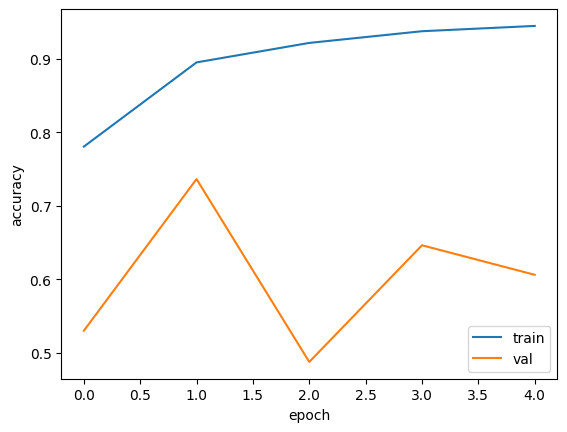

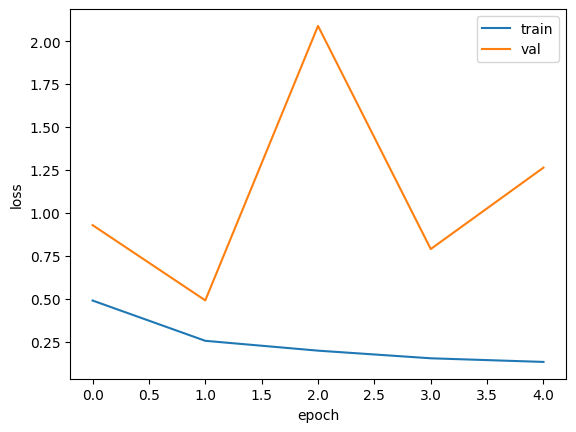


Epoch 1/10
227/227 [==============================] - 40s 127ms/step - loss: 1.1379 - accuracy: 0.6139 - val_loss: 1.4702 - val_accuracy: 0.5608
Epoch 2/10
227/227 [==============================] - 34s 121ms/step - loss: 0.4275 - accuracy: 0.7916 - val_loss: 0.7651 - val_accuracy: 0.6563
Epoch 3/10
227/227 [==============================] - 35s 122ms/step - loss: 0.3724 - accuracy: 0.8135 - val_loss: 0.8875 - val_accuracy: 0.5715
Epoch 4/10
227/227 [==============================] - 34s 121ms/step - loss: 0.2807 - accuracy: 0.8751 - val_loss: 5.6320 - val_accuracy: 0.5218
Epoch 5/10
227/227 [==============================] - 34s 123ms/step - loss: 0.1996 - accuracy: 0.9237 - val_loss: 1.4810 - val_accuracy: 0.5030


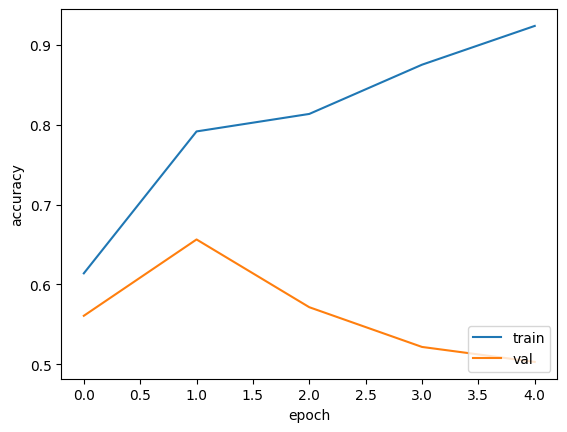

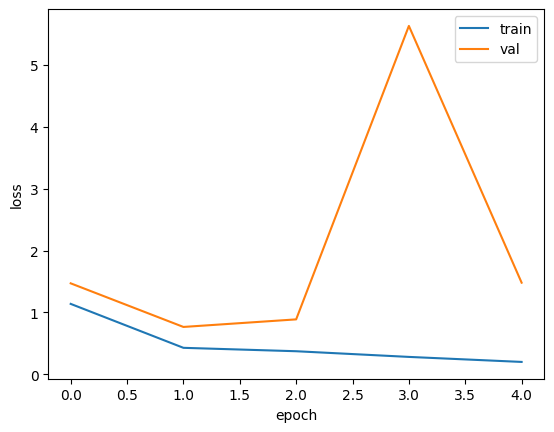


Epoch 1/10
227/227 [==============================] - 39s 124ms/step - loss: 0.2411 - accuracy: 0.8996 - val_loss: 0.6002 - val_accuracy: 0.6417
Epoch 2/10
227/227 [==============================] - 34s 123ms/step - loss: 0.1296 - accuracy: 0.9491 - val_loss: 0.2107 - val_accuracy: 0.9218
Epoch 3/10
227/227 [==============================] - 35s 123ms/step - loss: 0.1169 - accuracy: 0.9527 - val_loss: 1.4003 - val_accuracy: 0.5836
Epoch 4/10
227/227 [==============================] - 34s 122ms/step - loss: 0.1093 - accuracy: 0.9544 - val_loss: 0.2871 - val_accuracy: 0.8790
Epoch 5/10
227/227 [==============================] - 34s 123ms/step - loss: 0.1018 - accuracy: 0.9579 - val_loss: 0.4090 - val_accuracy: 0.8379


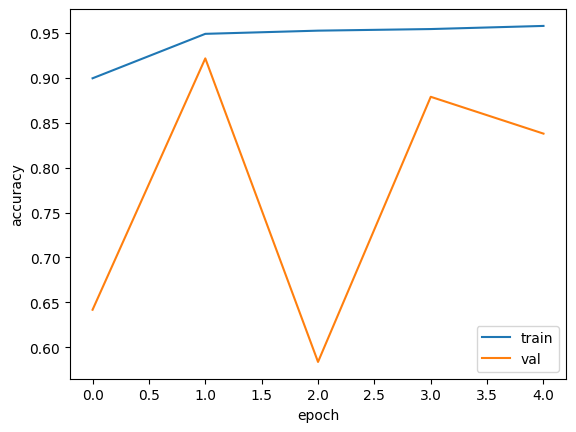

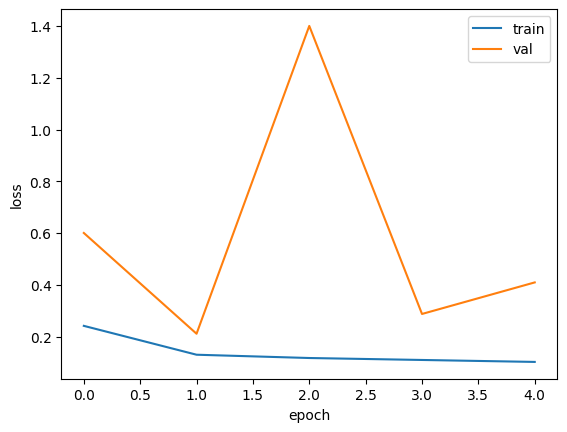


Adam
Epoch 1/10
227/227 [==============================] - 40s 127ms/step - loss: 0.5163 - accuracy: 0.7646 - val_loss: 2.2583 - val_accuracy: 0.5218
Epoch 2/10
227/227 [==============================] - 35s 122ms/step - loss: 0.2432 - accuracy: 0.9010 - val_loss: 0.4184 - val_accuracy: 0.7816
Epoch 3/10
227/227 [==============================] - 34s 123ms/step - loss: 0.1849 - accuracy: 0.9236 - val_loss: 0.7668 - val_accuracy: 0.7156
Epoch 4/10
227/227 [==============================] - 34s 122ms/step - loss: 0.1342 - accuracy: 0.9434 - val_loss: 2.0263 - val_accuracy: 0.4917
Epoch 5/10
227/227 [==============================] - 34s 122ms/step - loss: 0.1164 - accuracy: 0.9494 - val_loss: 2.8835 - val_accuracy: 0.5533


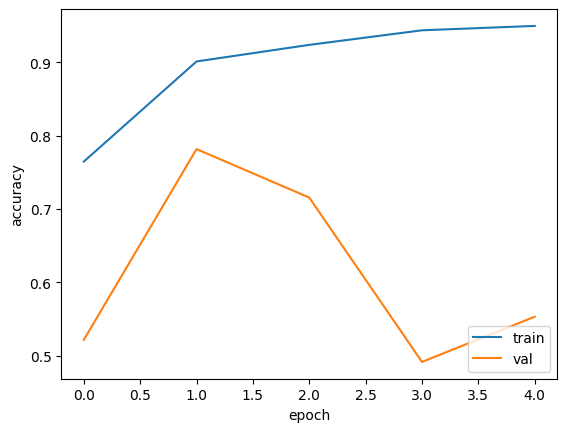

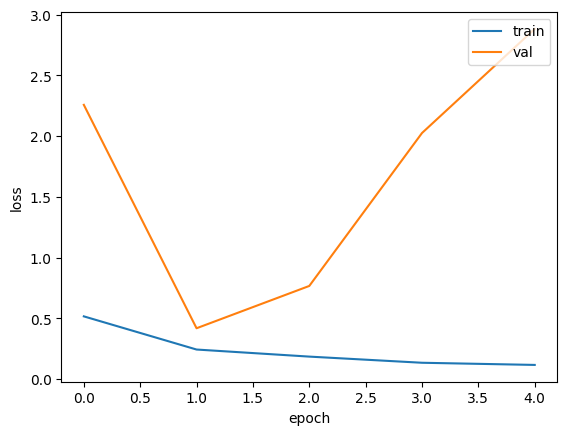


Adam
Epoch 1/10
227/227 [==============================] - 40s 127ms/step - loss: 1.1548 - accuracy: 0.6914 - val_loss: 2.8960 - val_accuracy: 0.5218
Epoch 2/10
227/227 [==============================] - 34s 121ms/step - loss: 0.3360 - accuracy: 0.8715 - val_loss: 0.7904 - val_accuracy: 0.5981
Epoch 3/10
227/227 [==============================] - 35s 124ms/step - loss: 0.2593 - accuracy: 0.9076 - val_loss: 0.2166 - val_accuracy: 0.9260
Epoch 4/10
227/227 [==============================] - 38s 137ms/step - loss: 0.2289 - accuracy: 0.9214 - val_loss: 2.7634 - val_accuracy: 0.5739
Epoch 5/10
227/227 [==============================] - 43s 141ms/step - loss: 0.2124 - accuracy: 0.9287 - val_loss: 0.6572 - val_accuracy: 0.7538
Epoch 6/10
227/227 [==============================] - 45s 146ms/step - loss: 0.3585 - accuracy: 0.8477 - val_loss: 1.0711 - val_accuracy: 0.5289


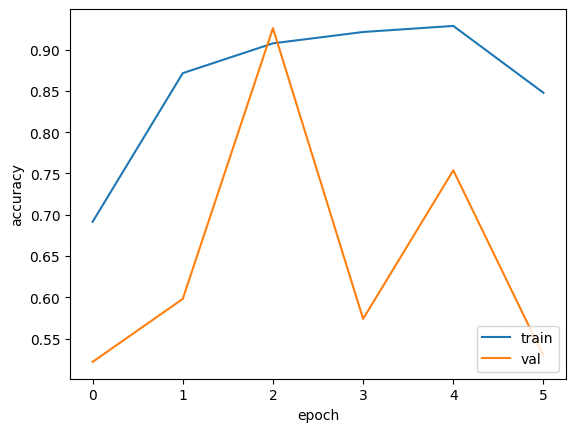

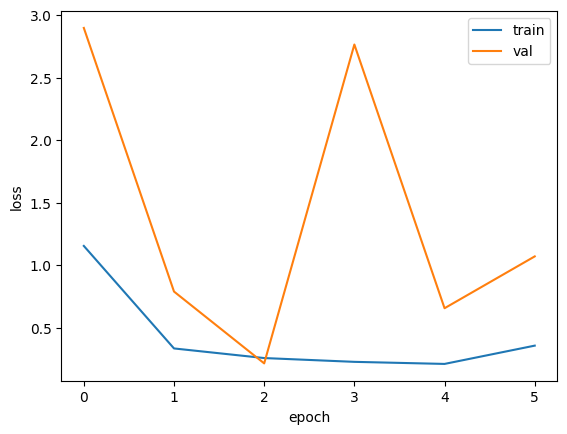


Adam
Epoch 1/10
227/227 [==============================] - 47s 138ms/step - loss: 0.2296 - accuracy: 0.9068 - val_loss: 0.6880 - val_accuracy: 0.5256
Epoch 2/10
227/227 [==============================] - 41s 134ms/step - loss: 0.1319 - accuracy: 0.9483 - val_loss: 0.4700 - val_accuracy: 0.7936
Epoch 3/10
227/227 [==============================] - 39s 126ms/step - loss: 0.1208 - accuracy: 0.9508 - val_loss: 0.4602 - val_accuracy: 0.7764
Epoch 4/10
227/227 [==============================] - 37s 124ms/step - loss: 0.1163 - accuracy: 0.9516 - val_loss: 0.7175 - val_accuracy: 0.7486
Epoch 5/10
227/227 [==============================] - 35s 122ms/step - loss: 0.1060 - accuracy: 0.9556 - val_loss: 0.5290 - val_accuracy: 0.7902
Epoch 6/10
227/227 [==============================] - 41s 141ms/step - loss: 0.0957 - accuracy: 0.9586 - val_loss: 0.2972 - val_accuracy: 0.8696
Epoch 7/10
227/227 [==============================] - 43s 151ms/step - loss: 0.0943 - accuracy: 0.9597 - val_loss: 2.7341 - 

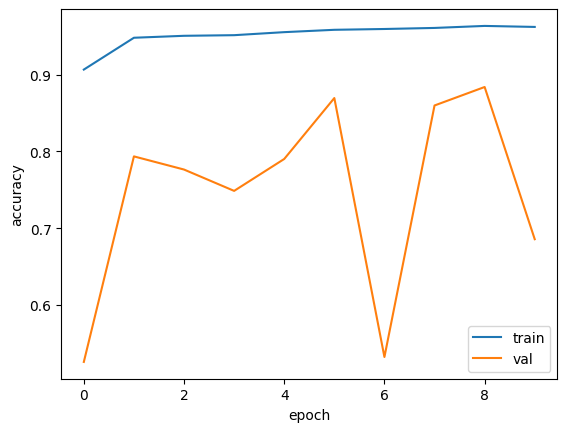

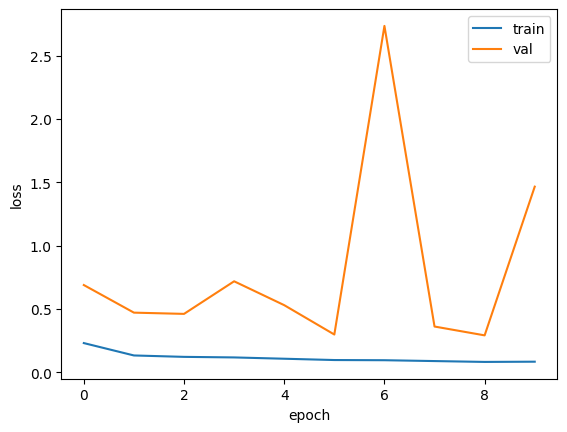


RMSprop
Epoch 1/10
227/227 [==============================] - 48s 131ms/step - loss: 0.7130 - accuracy: 0.6643 - val_loss: 0.6270 - val_accuracy: 0.6263
Epoch 2/10
227/227 [==============================] - 39s 129ms/step - loss: 0.4325 - accuracy: 0.7803 - val_loss: 1.8028 - val_accuracy: 0.5886
Epoch 3/10
227/227 [==============================] - 39s 123ms/step - loss: 0.3203 - accuracy: 0.8509 - val_loss: 0.4900 - val_accuracy: 0.8319
Epoch 4/10
227/227 [==============================] - 34s 121ms/step - loss: 0.2348 - accuracy: 0.8993 - val_loss: 1.0808 - val_accuracy: 0.6957
Epoch 5/10
227/227 [==============================] - 35s 124ms/step - loss: 0.1857 - accuracy: 0.9207 - val_loss: 0.7154 - val_accuracy: 0.8469
Epoch 6/10
227/227 [==============================] - 34s 120ms/step - loss: 0.1646 - accuracy: 0.9301 - val_loss: 2.4904 - val_accuracy: 0.6771


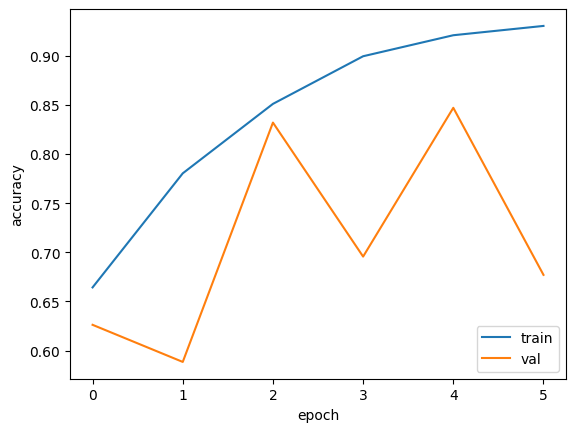

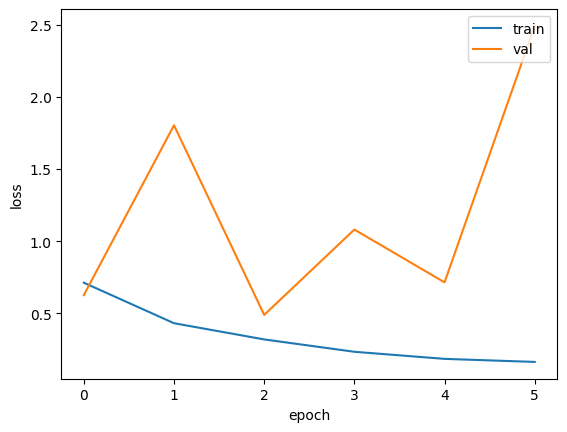


RMSprop
Epoch 1/10
227/227 [==============================] - 42s 129ms/step - loss: 1.9003 - accuracy: 0.6235 - val_loss: 4.0443 - val_accuracy: 0.5218
Epoch 2/10
227/227 [==============================] - 35s 122ms/step - loss: 0.5642 - accuracy: 0.7105 - val_loss: 1.5912 - val_accuracy: 0.5218
Epoch 3/10
227/227 [==============================] - 40s 130ms/step - loss: 0.4451 - accuracy: 0.7641 - val_loss: 2.5732 - val_accuracy: 0.5218
Epoch 4/10
227/227 [==============================] - 46s 147ms/step - loss: 0.5339 - accuracy: 0.7400 - val_loss: 4.4509 - val_accuracy: 0.5218
Epoch 5/10
227/227 [==============================] - 45s 149ms/step - loss: 0.3796 - accuracy: 0.8242 - val_loss: 0.8869 - val_accuracy: 0.6672
Epoch 6/10
227/227 [==============================] - 45s 145ms/step - loss: 0.4340 - accuracy: 0.7994 - val_loss: 1.3495 - val_accuracy: 0.5134
Epoch 7/10
227/227 [==============================] - 46s 148ms/step - loss: 0.4407 - accuracy: 0.7903 - val_loss: 8.5272

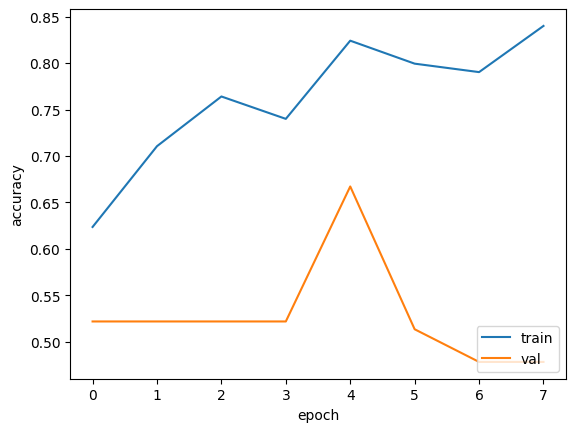

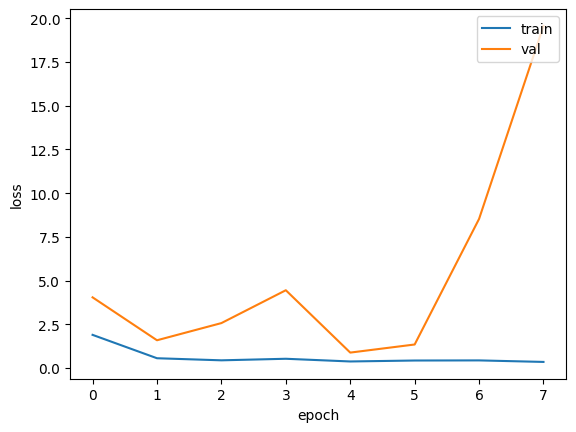


RMSprop
Epoch 1/10
227/227 [==============================] - 49s 132ms/step - loss: 0.4087 - accuracy: 0.8105 - val_loss: 0.6337 - val_accuracy: 0.5879
Epoch 2/10
227/227 [==============================] - 35s 123ms/step - loss: 0.2130 - accuracy: 0.9070 - val_loss: 0.3095 - val_accuracy: 0.8515
Epoch 3/10
227/227 [==============================] - 35s 122ms/step - loss: 0.1664 - accuracy: 0.9297 - val_loss: 0.2750 - val_accuracy: 0.8979
Epoch 4/10
227/227 [==============================] - 35s 125ms/step - loss: 0.1382 - accuracy: 0.9431 - val_loss: 0.2807 - val_accuracy: 0.8785
Epoch 5/10
227/227 [==============================] - 34s 124ms/step - loss: 0.1234 - accuracy: 0.9467 - val_loss: 0.4462 - val_accuracy: 0.8632
Epoch 6/10
227/227 [==============================] - 36s 127ms/step - loss: 0.1091 - accuracy: 0.9521 - val_loss: 0.2576 - val_accuracy: 0.9057
Epoch 7/10
227/227 [==============================] - 34s 123ms/step - loss: 0.1022 - accuracy: 0.9550 - val_loss: 0.7185

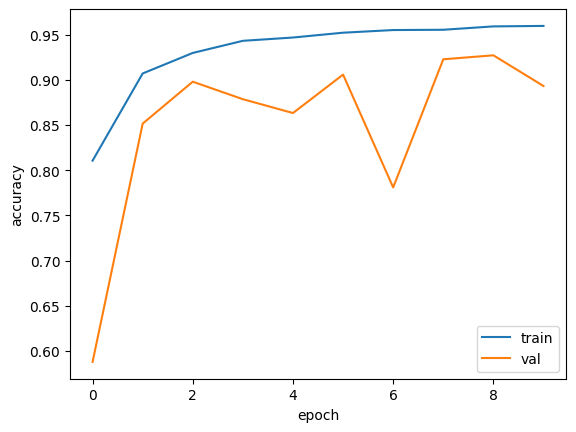

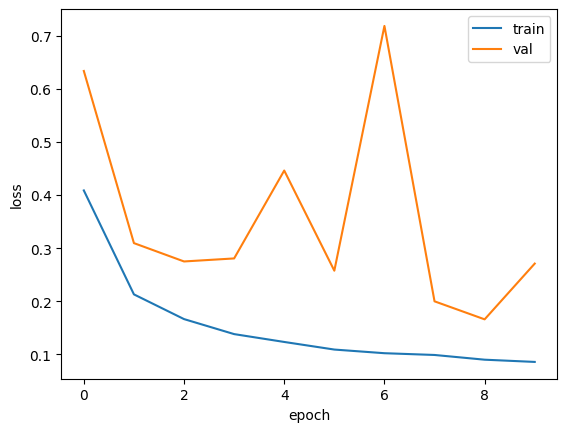


SGD
Epoch 1/10
227/227 [==============================] - 42s 132ms/step - loss: 0.4165 - accuracy: 0.8228 - val_loss: 1.1550 - val_accuracy: 0.4782
Epoch 2/10
227/227 [==============================] - 36s 127ms/step - loss: 0.2306 - accuracy: 0.9059 - val_loss: 0.4212 - val_accuracy: 0.8009
Epoch 3/10
227/227 [==============================] - 35s 125ms/step - loss: 0.2214 - accuracy: 0.9075 - val_loss: 0.3173 - val_accuracy: 0.8713
Epoch 4/10
227/227 [==============================] - 34s 125ms/step - loss: 0.2365 - accuracy: 0.8988 - val_loss: 0.4912 - val_accuracy: 0.7514
Epoch 5/10
227/227 [==============================] - 35s 126ms/step - loss: 0.2321 - accuracy: 0.8996 - val_loss: 0.3517 - val_accuracy: 0.8369
Epoch 6/10
227/227 [==============================] - 35s 127ms/step - loss: 0.1972 - accuracy: 0.9170 - val_loss: 1.8062 - val_accuracy: 0.5359


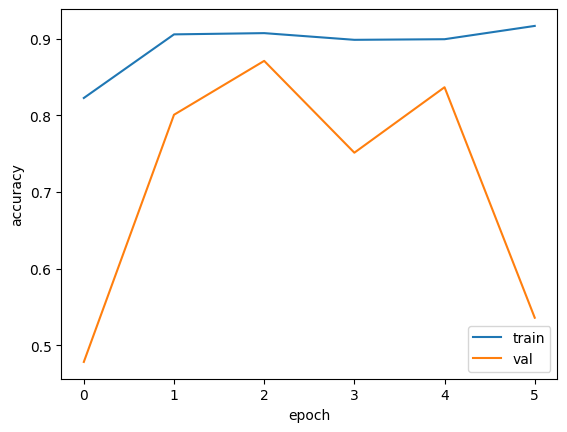

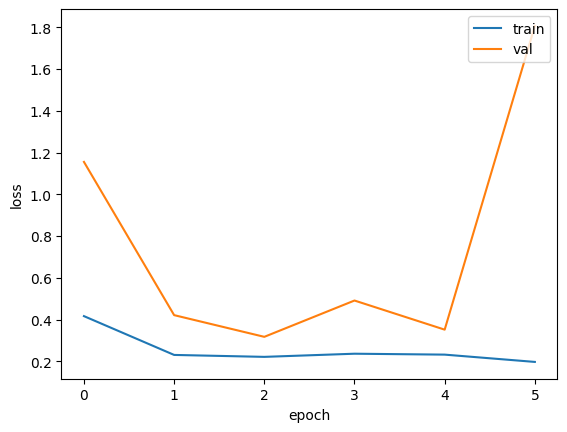


SGD
Epoch 1/10
227/227 [==============================] - 43s 132ms/step - loss: 0.3533 - accuracy: 0.8518 - val_loss: 0.7595 - val_accuracy: 0.4848
Epoch 2/10
227/227 [==============================] - 36s 131ms/step - loss: 0.2324 - accuracy: 0.9172 - val_loss: 0.3944 - val_accuracy: 0.8814
Epoch 3/10
227/227 [==============================] - 39s 141ms/step - loss: 0.1874 - accuracy: 0.9338 - val_loss: 0.2145 - val_accuracy: 0.9061
Epoch 4/10
227/227 [==============================] - 43s 136ms/step - loss: 0.1599 - accuracy: 0.9445 - val_loss: 0.2236 - val_accuracy: 0.9010
Epoch 5/10
227/227 [==============================] - 46s 150ms/step - loss: 0.1392 - accuracy: 0.9520 - val_loss: 2.5830 - val_accuracy: 0.5348
Epoch 6/10
227/227 [==============================] - 49s 155ms/step - loss: 0.1285 - accuracy: 0.9544 - val_loss: 0.2377 - val_accuracy: 0.8987


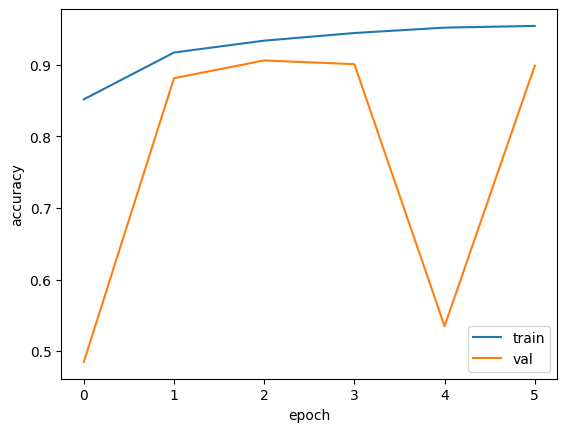

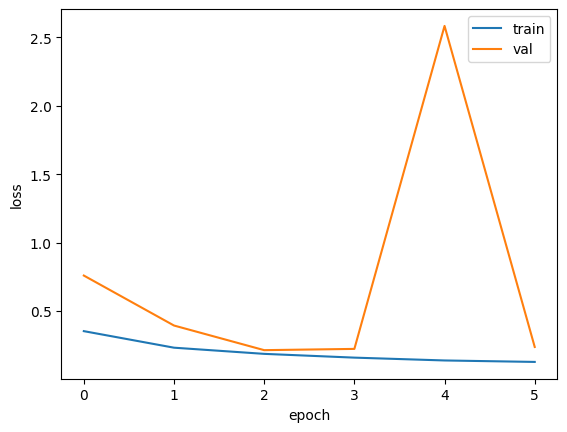


SGD
Epoch 1/10
227/227 [==============================] - 50s 144ms/step - loss: 0.9382 - accuracy: 0.5961 - val_loss: 0.6871 - val_accuracy: 0.5897
Epoch 2/10
227/227 [==============================] - 46s 145ms/step - loss: 0.6405 - accuracy: 0.6255 - val_loss: 0.6456 - val_accuracy: 0.6245
Epoch 3/10
227/227 [==============================] - 42s 133ms/step - loss: 0.6219 - accuracy: 0.6529 - val_loss: 1.2939 - val_accuracy: 0.5218
Epoch 4/10
227/227 [==============================] - 46s 149ms/step - loss: 0.6108 - accuracy: 0.6566 - val_loss: 0.8514 - val_accuracy: 0.5419
Epoch 5/10
227/227 [==============================] - 48s 152ms/step - loss: 0.6267 - accuracy: 0.6251 - val_loss: 0.6574 - val_accuracy: 0.6570


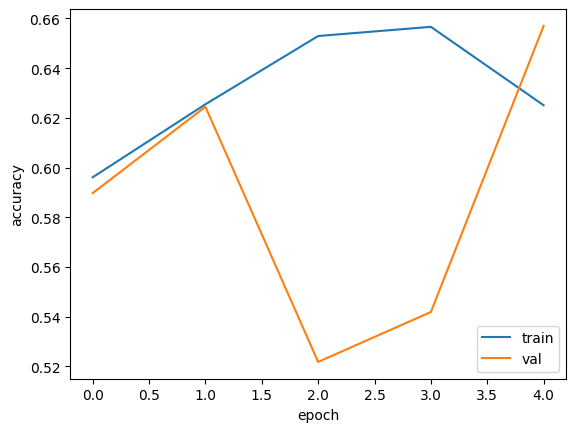

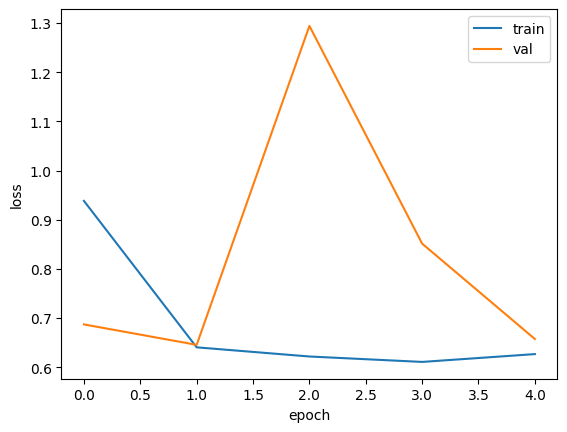

In [ ]:
#Optimizer selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()




  print("Adam")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()






  print("RMSprop")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("RMSprop")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("RMSprop")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()





  print("SGD")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('resnet50-7', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.1), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
Epoch 1/10
227/227 [==============================] - 44s 129ms/step - loss: 0.2470 - accuracy: 0.8972 - val_loss: 0.8524 - val_accuracy: 0.5246
Epoch 2/10
227/227 [==============================] - 35s 125ms/step - loss: 0.1408 - accuracy: 0.9455 - val_loss: 0.7308 - val_accuracy: 0.7054
Epoch 3/10
227/227 [==============================] - 37s 128ms/step - loss: 0.1285 - accuracy: 0.9488 - val_loss: 0.3316 - val_accuracy: 0.8550
Epoch 4/10
227/227 [==============================] - 36s 127ms/step - loss: 0.1263 - accuracy: 0.9494 - val_loss: 0.3010 - val_accuracy: 0.8624
Epoch 5/10
227/227 [==============================] - 36s 128ms/step - loss: 0.1226 - accuracy: 0.9500 - val_loss: 0.6781 - val_accuracy: 0.7375
Epoch 6/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1159 - accuracy: 0.9527 - val_loss: 0.2072 - val_accuracy: 0.9178
Epoch 7/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1061 - accuracy: 0.9558 - val_loss: 0.1660 - 

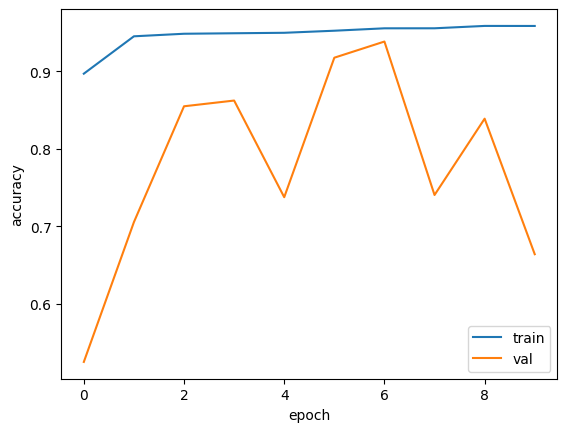

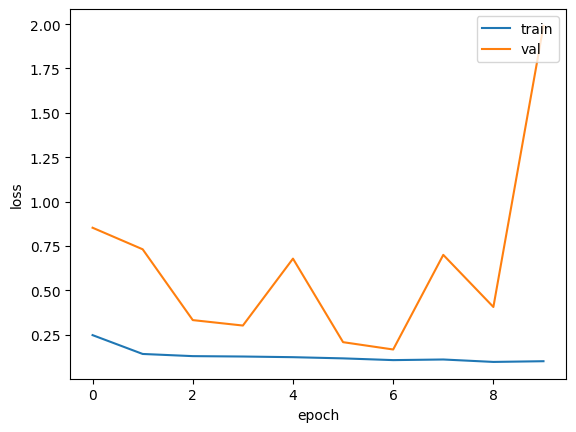


AdamW
Epoch 1/10
227/227 [==============================] - 41s 133ms/step - loss: 0.2466 - accuracy: 0.8949 - val_loss: 0.5570 - val_accuracy: 0.6673
Epoch 2/10
227/227 [==============================] - 36s 127ms/step - loss: 0.1404 - accuracy: 0.9459 - val_loss: 0.2587 - val_accuracy: 0.8951
Epoch 3/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1262 - accuracy: 0.9500 - val_loss: 3.0709 - val_accuracy: 0.5224
Epoch 4/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1116 - accuracy: 0.9553 - val_loss: 0.3331 - val_accuracy: 0.8371
Epoch 5/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1073 - accuracy: 0.9567 - val_loss: 0.2733 - val_accuracy: 0.8756


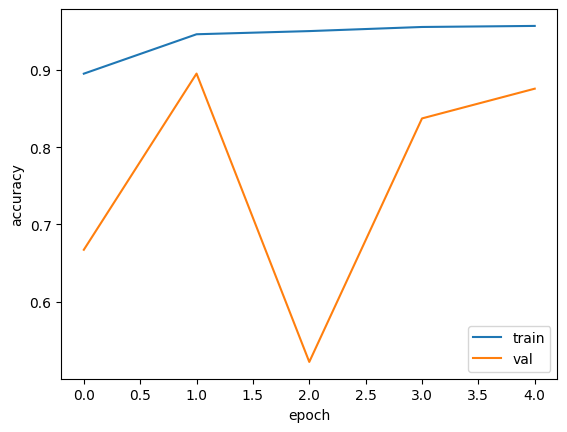

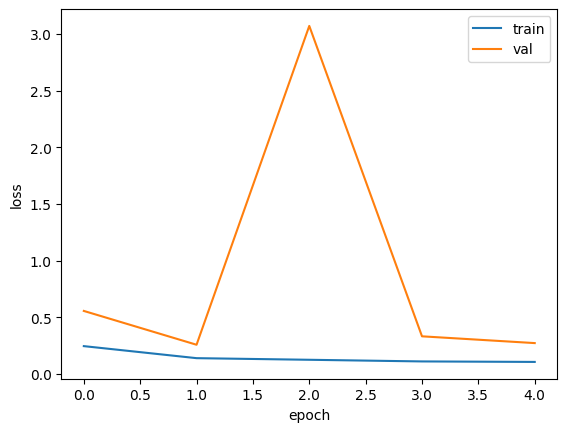


AdamW
Epoch 1/10
227/227 [==============================] - 43s 133ms/step - loss: 0.2320 - accuracy: 0.9030 - val_loss: 0.5434 - val_accuracy: 0.6986
Epoch 2/10
227/227 [==============================] - 36s 128ms/step - loss: 0.1379 - accuracy: 0.9457 - val_loss: 2.1415 - val_accuracy: 0.5291
Epoch 3/10
227/227 [==============================] - 36s 128ms/step - loss: 0.1217 - accuracy: 0.9517 - val_loss: 0.2929 - val_accuracy: 0.8765
Epoch 4/10
227/227 [==============================] - 36s 127ms/step - loss: 0.1120 - accuracy: 0.9546 - val_loss: 0.2461 - val_accuracy: 0.8979
Epoch 5/10
227/227 [==============================] - 35s 126ms/step - loss: 0.0996 - accuracy: 0.9583 - val_loss: 0.4607 - val_accuracy: 0.8158
Epoch 6/10
227/227 [==============================] - 35s 126ms/step - loss: 0.0966 - accuracy: 0.9593 - val_loss: 0.3472 - val_accuracy: 0.8556
Epoch 7/10
227/227 [==============================] - 35s 127ms/step - loss: 0.0924 - accuracy: 0.9605 - val_loss: 0.2303 -

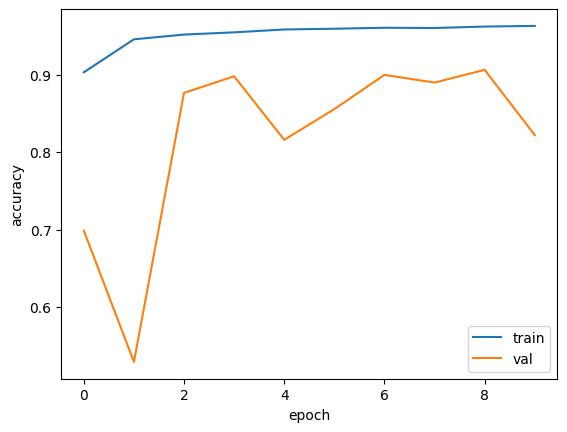

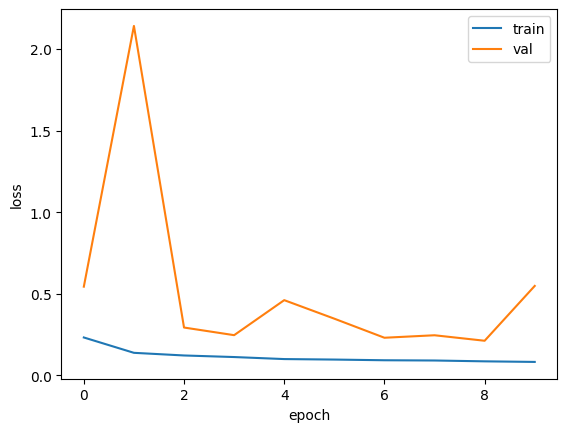

In [ ]:
#Activation function selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50-7', 'tanh', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('resnet50-7', 'sigmoid', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('resnet50-7', 'gelu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
Epoch 1/10
227/227 [==============================] - 46s 133ms/step - loss: 0.2421 - accuracy: 0.8980 - val_loss: 0.6337 - val_accuracy: 0.5794
Epoch 2/10
227/227 [==============================] - 36s 128ms/step - loss: 0.1389 - accuracy: 0.9466 - val_loss: 0.4615 - val_accuracy: 0.7595
Epoch 3/10
227/227 [==============================] - 42s 147ms/step - loss: 0.1202 - accuracy: 0.9529 - val_loss: 1.5030 - val_accuracy: 0.5486
Epoch 4/10
227/227 [==============================] - 44s 137ms/step - loss: 0.1095 - accuracy: 0.9564 - val_loss: 0.2334 - val_accuracy: 0.9000
Epoch 5/10
227/227 [==============================] - 51s 161ms/step - loss: 0.1060 - accuracy: 0.9559 - val_loss: 0.3753 - val_accuracy: 0.8538
Epoch 6/10
227/227 [==============================] - 48s 155ms/step - loss: 0.1055 - accuracy: 0.9570 - val_loss: 0.3798 - val_accuracy: 0.8289
Epoch 7/10
227/227 [==============================] - 47s 156ms/step - loss: 0.0978 - accuracy: 0.9594 - val_loss: 0.1969 - 

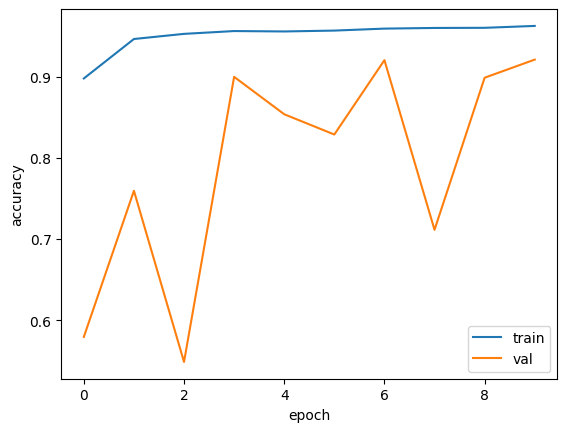

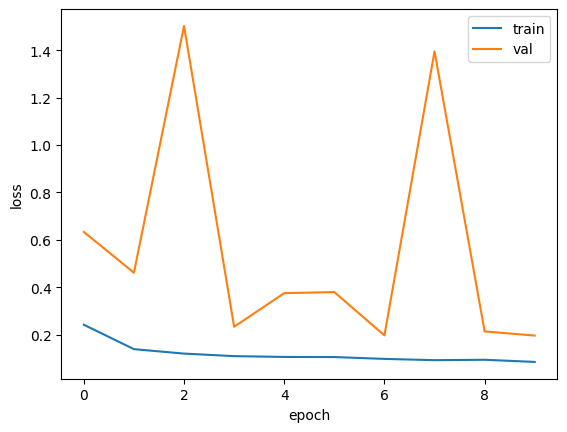


AdamW
Epoch 1/10
227/227 [==============================] - 53s 158ms/step - loss: 0.2788 - accuracy: 0.8784 - val_loss: 0.7745 - val_accuracy: 0.5039
Epoch 2/10
227/227 [==============================] - 42s 142ms/step - loss: 0.1498 - accuracy: 0.9409 - val_loss: 1.4784 - val_accuracy: 0.5780
Epoch 3/10
227/227 [==============================] - 42s 138ms/step - loss: 0.1272 - accuracy: 0.9495 - val_loss: 0.4516 - val_accuracy: 0.7631
Epoch 4/10
227/227 [==============================] - 42s 142ms/step - loss: 0.1177 - accuracy: 0.9532 - val_loss: 0.8939 - val_accuracy: 0.6603
Epoch 5/10
227/227 [==============================] - 47s 157ms/step - loss: 0.1083 - accuracy: 0.9557 - val_loss: 1.8861 - val_accuracy: 0.5464
Epoch 6/10
227/227 [==============================] - 47s 158ms/step - loss: 0.1103 - accuracy: 0.9551 - val_loss: 0.8224 - val_accuracy: 0.7436


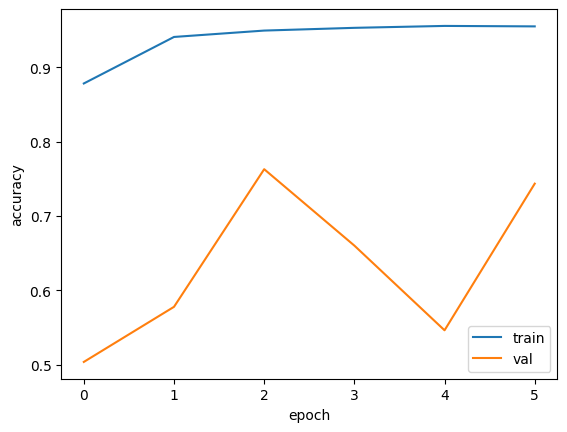

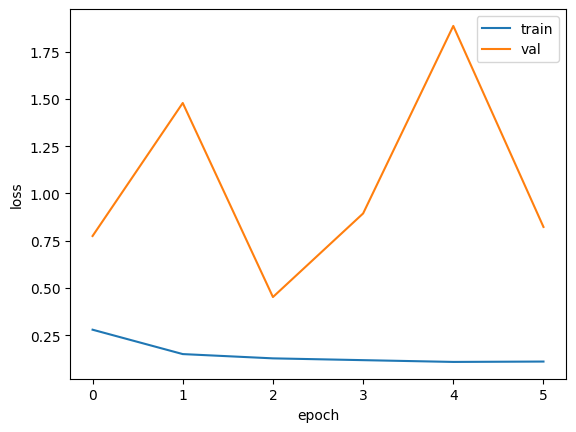

In [ ]:
#Dropout rate selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50-7', 'sigmoid', 0.1)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("AdamW")
  # Compile the model
  model = get_model('resnet50-7', 'sigmoid', 0.3)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


Epoch 1/10
227/227 [==============================] - 44s 135ms/step - loss: 0.2476 - accuracy: 0.8954 - val_loss: 0.6463 - val_accuracy: 0.5971
Epoch 2/10
227/227 [==============================] - 36s 126ms/step - loss: 0.1375 - accuracy: 0.9465 - val_loss: 0.2736 - val_accuracy: 0.8757
Epoch 3/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1277 - accuracy: 0.9497 - val_loss: 0.2441 - val_accuracy: 0.8992
Epoch 4/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1134 - accuracy: 0.9549 - val_loss: 0.4643 - val_accuracy: 0.7987
Epoch 5/10
227/227 [==============================] - 36s 128ms/step - loss: 0.1057 - accuracy: 0.9567 - val_loss: 1.3076 - val_accuracy: 0.6104
Epoch 6/10
227/227 [==============================] - 35s 126ms/step - loss: 0.1049 - accuracy: 0.9574 - val_loss: 0.8987 - val_accuracy: 0.6576
Epoch 7/10
227/227 [==============================] - 35s 127ms/step - loss: 0.1053 - accuracy: 0.9562 - val_loss: 0.1557 - val_ac

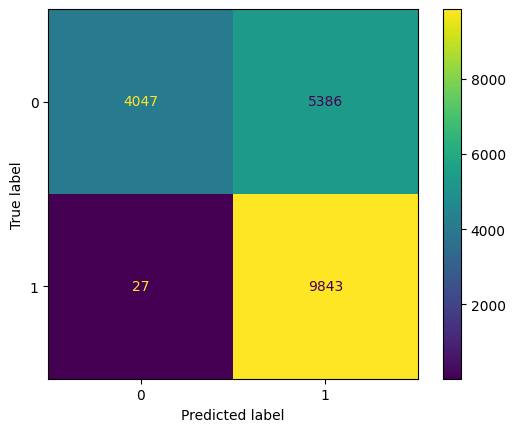


Precision:  0.6463326548033358
Recall:  0.9972644376899696
F1:  0.7843340372126381
Avg acc: 0.7196
0.71957726778221 0.71957726778221 0.71957726778221 0.71957726778221 0.71957726778221 0.71957726778221 0.71957726778221
Standard error: 0.0000
126/126 [==============================] - 8s 63ms/step
[[0.00792592 0.992074  ]
 [0.14523505 0.8547649 ]
 [0.3339081  0.66609186]
 ...
 [0.07133365 0.92866623]
 [0.07459079 0.92540926]
 [0.07308336 0.9269166 ]]
32134


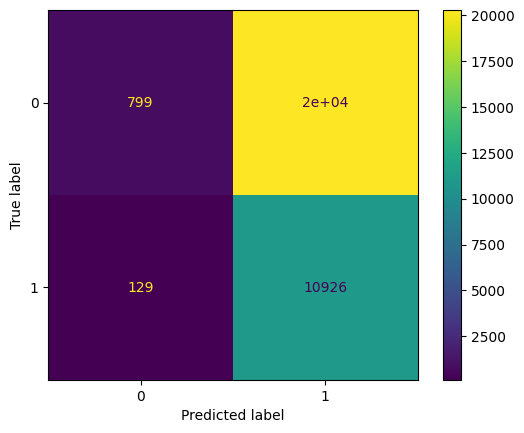


Precision:  0.3501249759661604
Recall:  0.9883310719131615
F1:  0.5170724781713637
Avg acc: 0.3649
0.364878322026514 0.364878322026514 0.364878322026514 0.364878322026514 0.364878322026514 0.364878322026514 0.364878322026514
Standard error: 0.0000


In [ ]:

model = get_model('resnet50-7', 'sigmoid', 0.1)
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # Make predictions on the test set
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp))

  tf.random.set_seed(42)
  np.random.seed(71516)
  y2 = np.array(model.predict(test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp
#convert this into numpy
KNN
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # test_loss, test_acc = model.evaluate(unseen_test_dataset)
  # print('Unseen Test accuracy:', test_acc)
  # print('Unseen Test loss:', test_loss)
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(unseen_test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(42)
  np.random.seed(42)
  y2 = np.array(model.predict(unseen_test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(unseen_test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(unseen_test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(unseen_test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(unseen_test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(unseen_test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp_unseen))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp_unseen
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

Entire ResNet-50 trainable

Hyperparam optim

AdamW
Epoch 1/10
227/227 [==============================] - 132s 295ms/step - loss: 0.7776 - accuracy: 0.8103 - val_loss: 0.8550 - val_accuracy: 0.5205
Epoch 2/10
227/227 [==============================] - 73s 291ms/step - loss: 0.0714 - accuracy: 0.9692 - val_loss: 0.8927 - val_accuracy: 0.6840
Epoch 3/10
227/227 [==============================] - 72s 289ms/step - loss: 0.0666 - accuracy: 0.9693 - val_loss: 0.0834 - val_accuracy: 0.9619
Epoch 4/10
227/227 [==============================] - 72s 290ms/step - loss: 0.0525 - accuracy: 0.9732 - val_loss: 0.2583 - val_accuracy: 0.8982
Epoch 5/10
227/227 [==============================] - 72s 291ms/step - loss: 0.0537 - accuracy: 0.9734 - val_loss: 0.0714 - val_accuracy: 0.9658
Epoch 6/10
227/227 [==============================] - 73s 292ms/step - loss: 0.0512 - accuracy: 0.9747 - val_loss: 0.0577 - val_accuracy: 0.9721
Epoch 7/10
227/227 [==============================] - 73s 293ms/step - loss: 0.0513 - accuracy: 0.9745 - val_loss: 0.3107 -

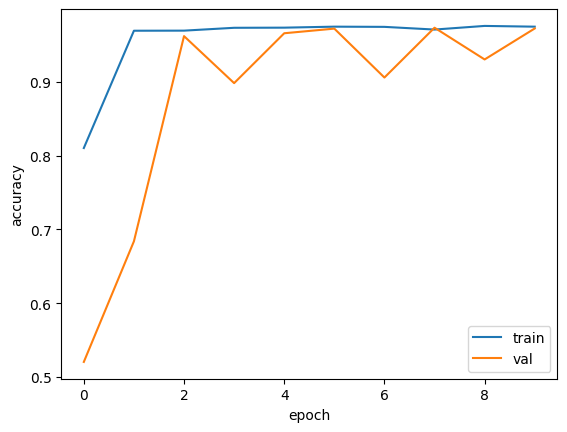

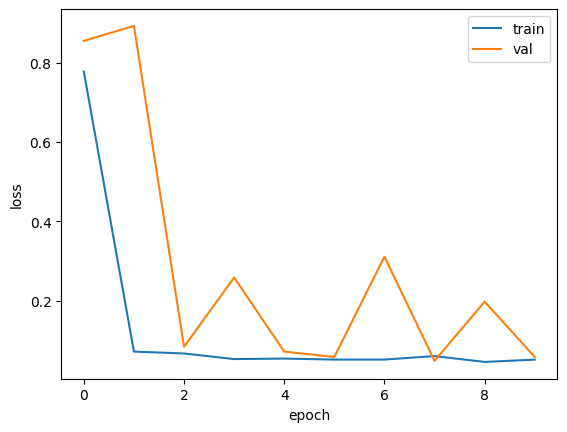


Epoch 1/10
227/227 [==============================] - 111s 292ms/step - loss: 2.7875 - accuracy: 0.7266 - val_loss: 1.5244 - val_accuracy: 0.6568
Epoch 2/10
227/227 [==============================] - 72s 290ms/step - loss: 0.1981 - accuracy: 0.9217 - val_loss: 0.1917 - val_accuracy: 0.9105
Epoch 3/10
227/227 [==============================] - 73s 292ms/step - loss: 0.1176 - accuracy: 0.9447 - val_loss: 0.3126 - val_accuracy: 0.8890
Epoch 4/10
227/227 [==============================] - 73s 294ms/step - loss: 0.0950 - accuracy: 0.9539 - val_loss: 0.0836 - val_accuracy: 0.9601
Epoch 5/10
227/227 [==============================] - 73s 293ms/step - loss: 0.0791 - accuracy: 0.9614 - val_loss: 0.8380 - val_accuracy: 0.8083
Epoch 6/10
227/227 [==============================] - 73s 293ms/step - loss: 0.3979 - accuracy: 0.8186 - val_loss: 0.4985 - val_accuracy: 0.7772
Epoch 7/10
227/227 [==============================] - 73s 294ms/step - loss: 0.1575 - accuracy: 0.9419 - val_loss: 0.2691 - val_

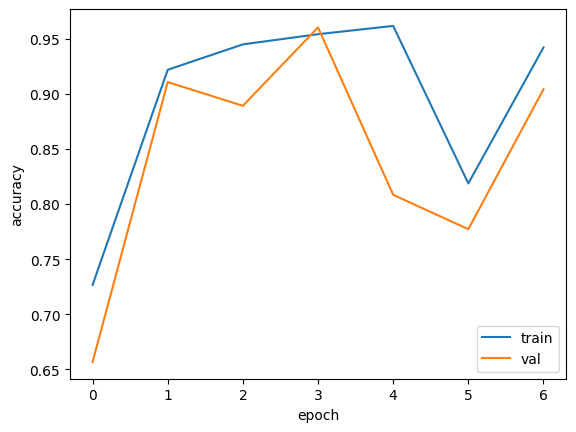

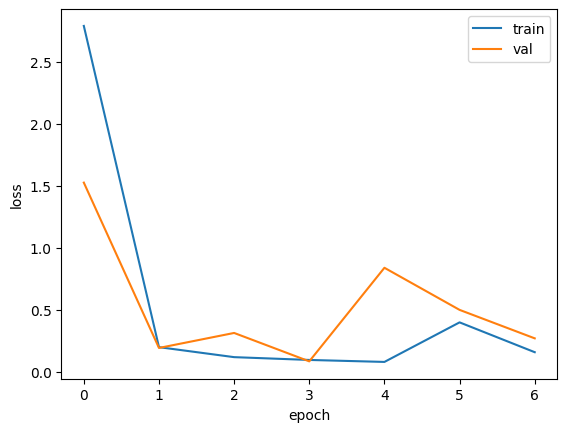


Epoch 1/10
227/227 [==============================] - 113s 295ms/step - loss: 0.4321 - accuracy: 0.8449 - val_loss: 0.7035 - val_accuracy: 0.5123
Epoch 2/10
227/227 [==============================] - 72s 291ms/step - loss: 0.0847 - accuracy: 0.9665 - val_loss: 1.1091 - val_accuracy: 0.5686
Epoch 3/10
227/227 [==============================] - 73s 292ms/step - loss: 0.0574 - accuracy: 0.9752 - val_loss: 0.2064 - val_accuracy: 0.9207
Epoch 4/10
227/227 [==============================] - 73s 296ms/step - loss: 0.0450 - accuracy: 0.9787 - val_loss: 0.0940 - val_accuracy: 0.9583
Epoch 5/10
227/227 [==============================] - 74s 297ms/step - loss: 0.0406 - accuracy: 0.9811 - val_loss: 0.0522 - val_accuracy: 0.9762
Epoch 6/10
227/227 [==============================] - 74s 298ms/step - loss: 0.0394 - accuracy: 0.9816 - val_loss: 0.0717 - val_accuracy: 0.9702
Epoch 7/10
227/227 [==============================] - 74s 299ms/step - loss: 0.0344 - accuracy: 0.9839 - val_loss: 0.0884 - val_

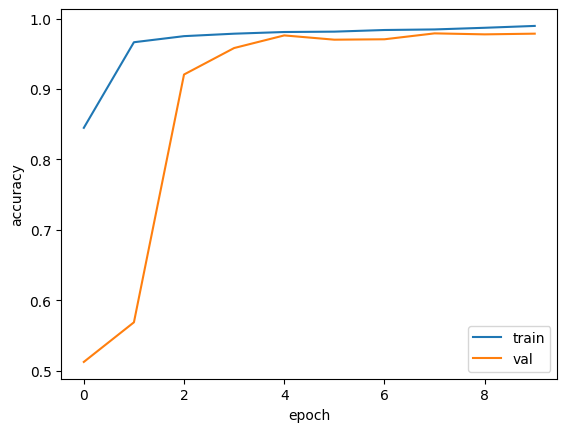

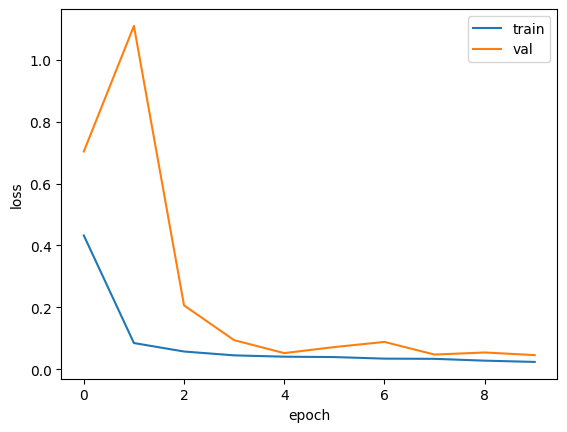


Adam
Epoch 1/10
227/227 [==============================] - 110s 296ms/step - loss: 1.0758 - accuracy: 0.5317 - val_loss: 0.6924 - val_accuracy: 0.5218
Epoch 2/10
227/227 [==============================] - 72s 291ms/step - loss: 0.2995 - accuracy: 0.8342 - val_loss: 0.4776 - val_accuracy: 0.8075
Epoch 3/10
227/227 [==============================] - 73s 291ms/step - loss: 0.2033 - accuracy: 0.8717 - val_loss: 0.1135 - val_accuracy: 0.9491
Epoch 4/10
227/227 [==============================] - 73s 295ms/step - loss: 0.1901 - accuracy: 0.8742 - val_loss: 0.0675 - val_accuracy: 0.9646
Epoch 5/10
227/227 [==============================] - 73s 294ms/step - loss: 0.1935 - accuracy: 0.8689 - val_loss: 1.1939 - val_accuracy: 0.7661
Epoch 6/10
227/227 [==============================] - 72s 292ms/step - loss: 0.1890 - accuracy: 0.8738 - val_loss: 0.0895 - val_accuracy: 0.9473
Epoch 7/10
227/227 [==============================] - 72s 292ms/step - loss: 0.1879 - accuracy: 0.8718 - val_loss: 0.0638 -

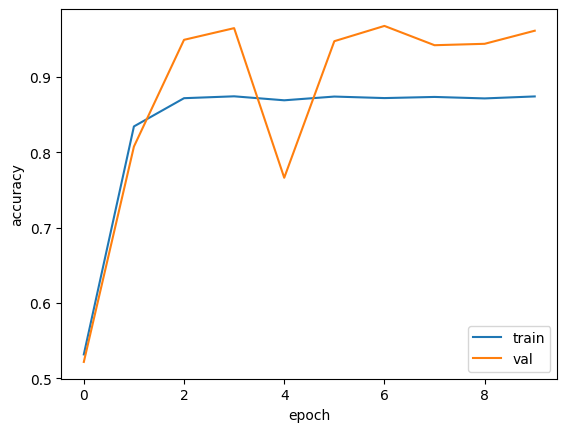

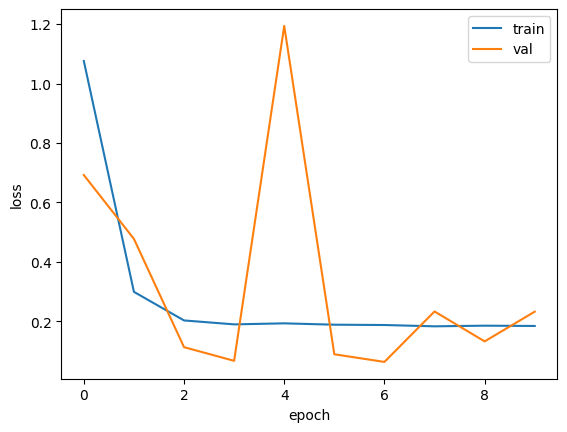


Adam
Epoch 1/10
227/227 [==============================] - 111s 298ms/step - loss: 3.5935 - accuracy: 0.6680 - val_loss: 2.8996 - val_accuracy: 0.6021
Epoch 2/10
227/227 [==============================] - 73s 292ms/step - loss: 0.1922 - accuracy: 0.9258 - val_loss: 0.1208 - val_accuracy: 0.9516
Epoch 3/10
227/227 [==============================] - 75s 296ms/step - loss: 0.1061 - accuracy: 0.9571 - val_loss: 0.0812 - val_accuracy: 0.9618
Epoch 4/10
227/227 [==============================] - 73s 293ms/step - loss: 0.2863 - accuracy: 0.9109 - val_loss: 0.1858 - val_accuracy: 0.9273
Epoch 5/10
227/227 [==============================] - 73s 293ms/step - loss: 0.1173 - accuracy: 0.9507 - val_loss: 0.0875 - val_accuracy: 0.9576
Epoch 6/10
227/227 [==============================] - 73s 293ms/step - loss: 0.0863 - accuracy: 0.9626 - val_loss: 0.0869 - val_accuracy: 0.9558


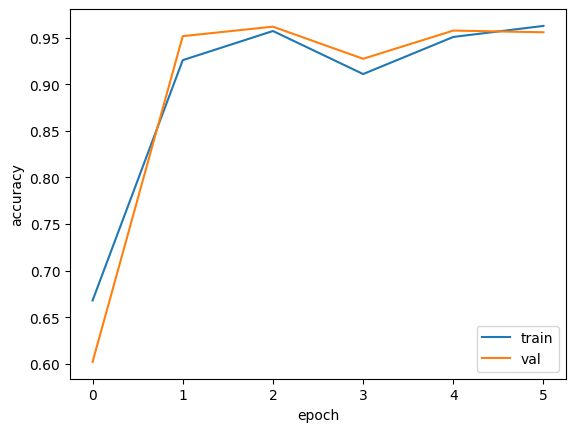

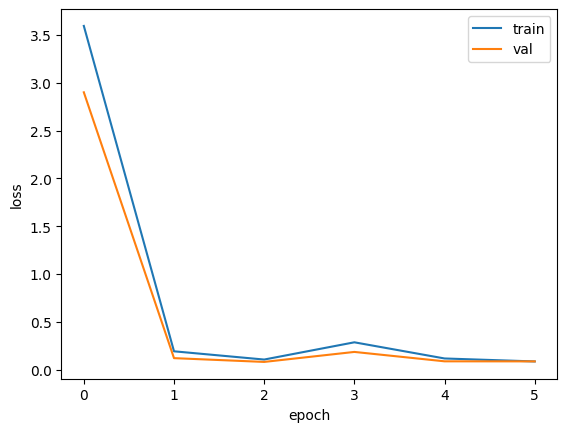


Adam
Epoch 1/10
227/227 [==============================] - 111s 299ms/step - loss: 0.4722 - accuracy: 0.8217 - val_loss: 0.7336 - val_accuracy: 0.5206
Epoch 2/10
227/227 [==============================] - 73s 293ms/step - loss: 0.0967 - accuracy: 0.9619 - val_loss: 0.7832 - val_accuracy: 0.6379
Epoch 3/10
227/227 [==============================] - 72s 292ms/step - loss: 0.0580 - accuracy: 0.9740 - val_loss: 0.1895 - val_accuracy: 0.9347
Epoch 4/10
227/227 [==============================] - 73s 294ms/step - loss: 0.0460 - accuracy: 0.9797 - val_loss: 0.0817 - val_accuracy: 0.9657
Epoch 5/10
227/227 [==============================] - 73s 292ms/step - loss: 0.0406 - accuracy: 0.9821 - val_loss: 0.0639 - val_accuracy: 0.9753
Epoch 6/10
227/227 [==============================] - 73s 292ms/step - loss: 0.0379 - accuracy: 0.9823 - val_loss: 0.0472 - val_accuracy: 0.9772
Epoch 7/10
227/227 [==============================] - 73s 295ms/step - loss: 0.0336 - accuracy: 0.9839 - val_loss: 0.0522 -

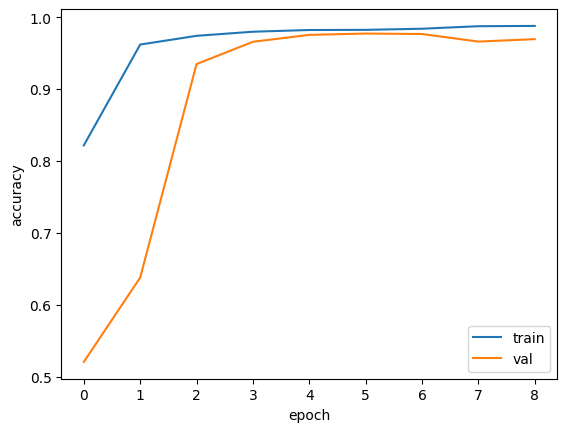

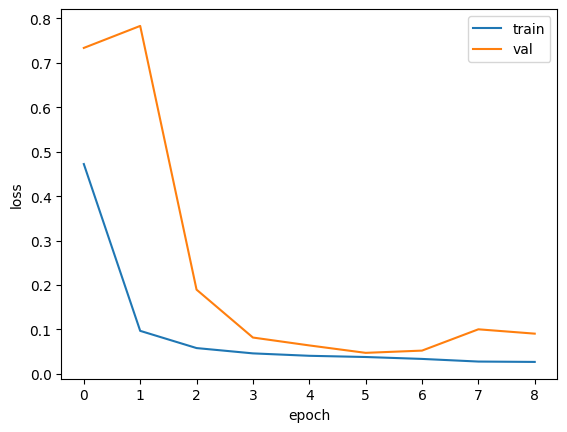


RMSprop
Epoch 1/10
227/227 [==============================] - 102s 297ms/step - loss: 0.9146 - accuracy: 0.8371 - val_loss: 0.7018 - val_accuracy: 0.4998
Epoch 2/10
227/227 [==============================] - 73s 292ms/step - loss: 0.0931 - accuracy: 0.9585 - val_loss: 0.1120 - val_accuracy: 0.9487
Epoch 3/10
227/227 [==============================] - 73s 290ms/step - loss: 0.0737 - accuracy: 0.9643 - val_loss: 0.7449 - val_accuracy: 0.8376
Epoch 4/10
227/227 [==============================] - 73s 292ms/step - loss: 0.0654 - accuracy: 0.9655 - val_loss: 0.7018 - val_accuracy: 0.7904
Epoch 5/10
227/227 [==============================] - 73s 293ms/step - loss: 0.0608 - accuracy: 0.9684 - val_loss: 0.0608 - val_accuracy: 0.9663
Epoch 6/10
227/227 [==============================] - 75s 296ms/step - loss: 0.0619 - accuracy: 0.9694 - val_loss: 0.2740 - val_accuracy: 0.9443
Epoch 7/10
227/227 [==============================] - 73s 292ms/step - loss: 0.0549 - accuracy: 0.9710 - val_loss: 0.128

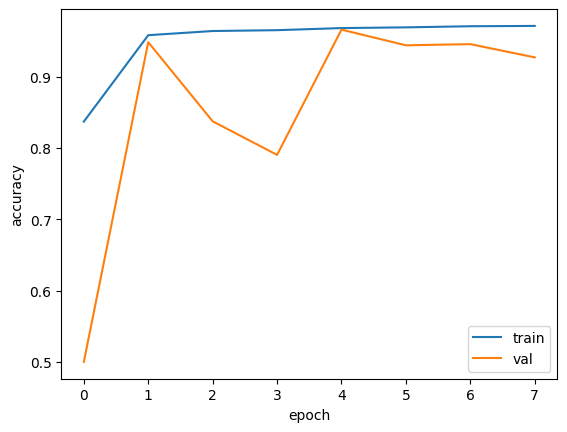

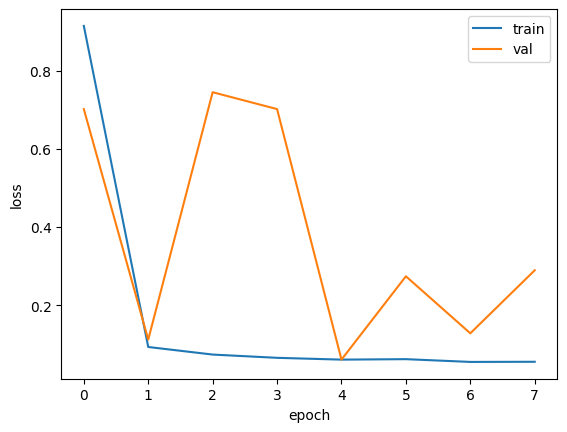


RMSprop
Epoch 1/10
227/227 [==============================] - 108s 295ms/step - loss: 12.1344 - accuracy: 0.5228 - val_loss: 0.6926 - val_accuracy: 0.5218
Epoch 2/10
227/227 [==============================] - 73s 284ms/step - loss: 0.6931 - accuracy: 0.5085 - val_loss: 0.6928 - val_accuracy: 0.5218
Epoch 3/10
227/227 [==============================] - 72s 283ms/step - loss: 0.6931 - accuracy: 0.5087 - val_loss: 0.6924 - val_accuracy: 0.5218
Epoch 4/10
227/227 [==============================] - 72s 284ms/step - loss: 0.6931 - accuracy: 0.5074 - val_loss: 0.6922 - val_accuracy: 0.5218
Epoch 5/10
227/227 [==============================] - 73s 289ms/step - loss: 0.6931 - accuracy: 0.5081 - val_loss: 0.6936 - val_accuracy: 0.4782
Epoch 6/10
227/227 [==============================] - 70s 281ms/step - loss: 0.6931 - accuracy: 0.5085 - val_loss: 0.6925 - val_accuracy: 0.5218
Epoch 7/10
227/227 [==============================] - 73s 285ms/step - loss: 0.6931 - accuracy: 0.5083 - val_loss: 0.69

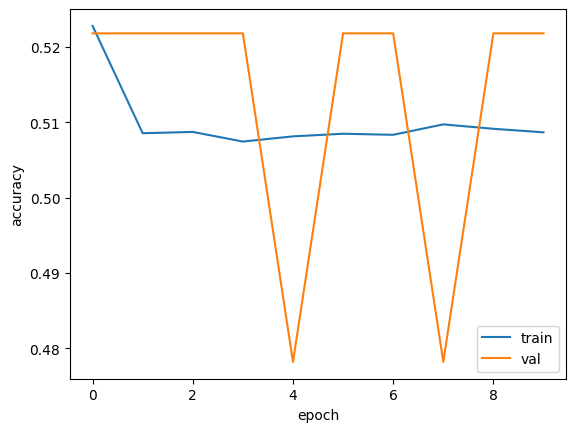

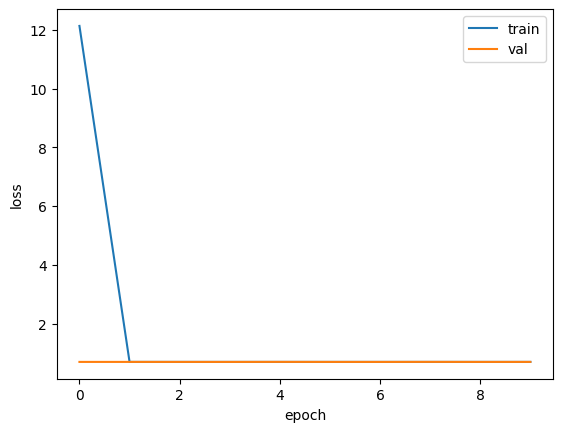


RMSprop
Epoch 1/10
227/227 [==============================] - 104s 298ms/step - loss: 0.4478 - accuracy: 0.8600 - val_loss: 0.7020 - val_accuracy: 0.5412
Epoch 2/10
227/227 [==============================] - 74s 293ms/step - loss: 0.0925 - accuracy: 0.9615 - val_loss: 1.5706 - val_accuracy: 0.6286
Epoch 3/10
227/227 [==============================] - 75s 297ms/step - loss: 0.0713 - accuracy: 0.9681 - val_loss: 0.4083 - val_accuracy: 0.9025
Epoch 4/10
227/227 [==============================] - 77s 294ms/step - loss: 0.0579 - accuracy: 0.9724 - val_loss: 0.1369 - val_accuracy: 0.9516
Epoch 5/10
227/227 [==============================] - 73s 292ms/step - loss: 0.0510 - accuracy: 0.9755 - val_loss: 0.1360 - val_accuracy: 0.9514
Epoch 6/10
227/227 [==============================] - 76s 296ms/step - loss: 0.0489 - accuracy: 0.9763 - val_loss: 0.1251 - val_accuracy: 0.9577
Epoch 7/10
227/227 [==============================] - 82s 314ms/step - loss: 0.0413 - accuracy: 0.9809 - val_loss: 0.093

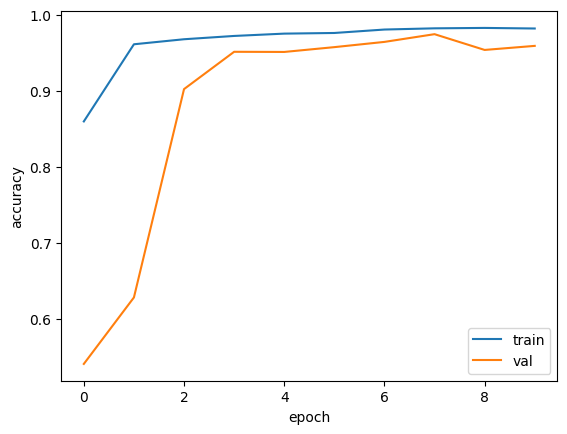

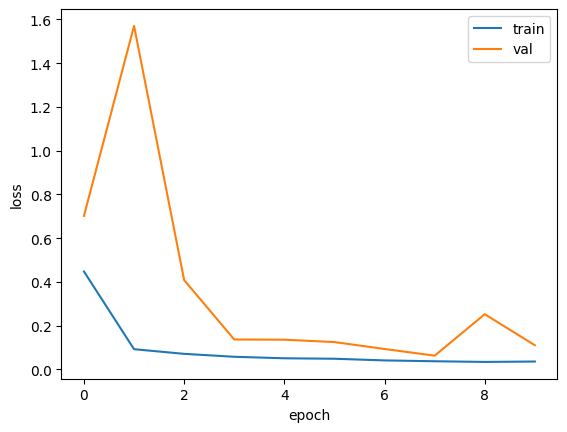


SGD
Epoch 1/10
227/227 [==============================] - 104s 324ms/step - loss: 0.4126 - accuracy: 0.8381 - val_loss: 1.1094 - val_accuracy: 0.5219
Epoch 2/10
227/227 [==============================] - 85s 320ms/step - loss: 0.1052 - accuracy: 0.9593 - val_loss: 0.0998 - val_accuracy: 0.9575
Epoch 3/10
227/227 [==============================] - 82s 311ms/step - loss: 0.0704 - accuracy: 0.9683 - val_loss: 0.1290 - val_accuracy: 0.9416
Epoch 4/10
227/227 [==============================] - 82s 313ms/step - loss: 0.0636 - accuracy: 0.9707 - val_loss: 0.0591 - val_accuracy: 0.9704
Epoch 5/10
227/227 [==============================] - 83s 310ms/step - loss: 0.0556 - accuracy: 0.9730 - val_loss: 0.0583 - val_accuracy: 0.9712
Epoch 6/10
227/227 [==============================] - 77s 297ms/step - loss: 0.0497 - accuracy: 0.9752 - val_loss: 0.0592 - val_accuracy: 0.9722
Epoch 7/10
227/227 [==============================] - 79s 303ms/step - loss: 0.0492 - accuracy: 0.9754 - val_loss: 0.0595 - 

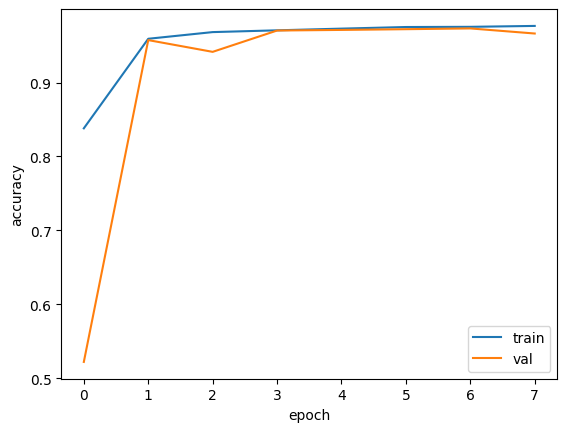

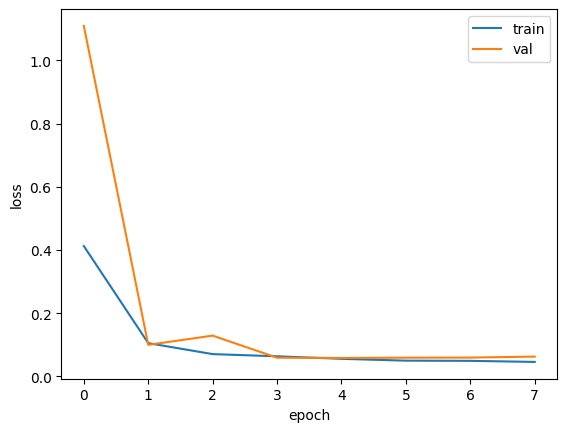


SGD
Epoch 1/10
227/227 [==============================] - 93s 298ms/step - loss: 0.7677 - accuracy: 0.6097 - val_loss: 0.7358 - val_accuracy: 0.5216
Epoch 2/10
227/227 [==============================] - 75s 293ms/step - loss: 0.4871 - accuracy: 0.7623 - val_loss: 0.4839 - val_accuracy: 0.7629
Epoch 3/10
227/227 [==============================] - 74s 295ms/step - loss: 0.2968 - accuracy: 0.8799 - val_loss: 0.2875 - val_accuracy: 0.8871
Epoch 4/10
227/227 [==============================] - 75s 295ms/step - loss: 0.1911 - accuracy: 0.9272 - val_loss: 0.2608 - val_accuracy: 0.8932
Epoch 5/10
227/227 [==============================] - 75s 294ms/step - loss: 0.1484 - accuracy: 0.9430 - val_loss: 0.1556 - val_accuracy: 0.9420
Epoch 6/10
227/227 [==============================] - 74s 293ms/step - loss: 0.1221 - accuracy: 0.9527 - val_loss: 0.1463 - val_accuracy: 0.9480
Epoch 7/10
227/227 [==============================] - 78s 304ms/step - loss: 0.1073 - accuracy: 0.9578 - val_loss: 0.1357 - v

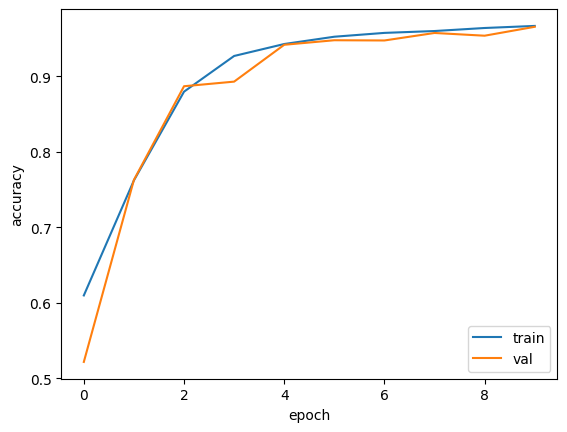

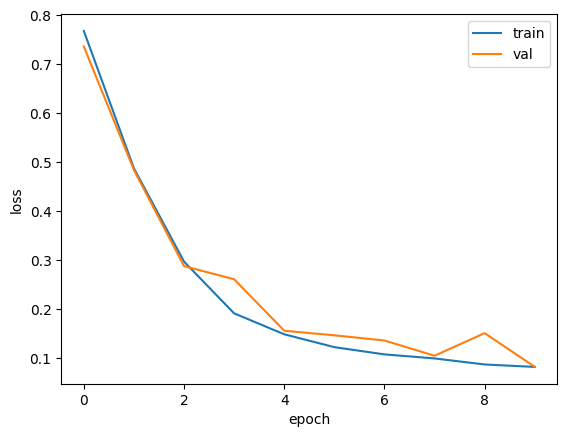


SGD
Epoch 1/10
227/227 [==============================] - 90s 295ms/step - loss: 1.7116 - accuracy: 0.5940 - val_loss: 0.7239 - val_accuracy: 0.5285
Epoch 2/10
227/227 [==============================] - 72s 291ms/step - loss: 0.4878 - accuracy: 0.7508 - val_loss: 0.6716 - val_accuracy: 0.6267
Epoch 3/10
227/227 [==============================] - 72s 290ms/step - loss: 0.1630 - accuracy: 0.9261 - val_loss: 0.1169 - val_accuracy: 0.9524
Epoch 4/10
227/227 [==============================] - 72s 290ms/step - loss: 0.0887 - accuracy: 0.9530 - val_loss: 0.4590 - val_accuracy: 0.8648
Epoch 5/10
227/227 [==============================] - 72s 289ms/step - loss: 0.0953 - accuracy: 0.9475 - val_loss: 0.1095 - val_accuracy: 0.9448
Epoch 6/10
227/227 [==============================] - 73s 290ms/step - loss: 0.0745 - accuracy: 0.9581 - val_loss: 0.0723 - val_accuracy: 0.9626
Epoch 7/10
227/227 [==============================] - 72s 290ms/step - loss: 0.0769 - accuracy: 0.9614 - val_loss: 0.0708 - v

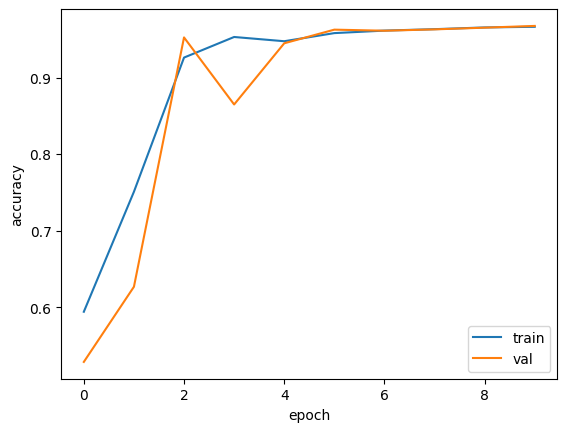

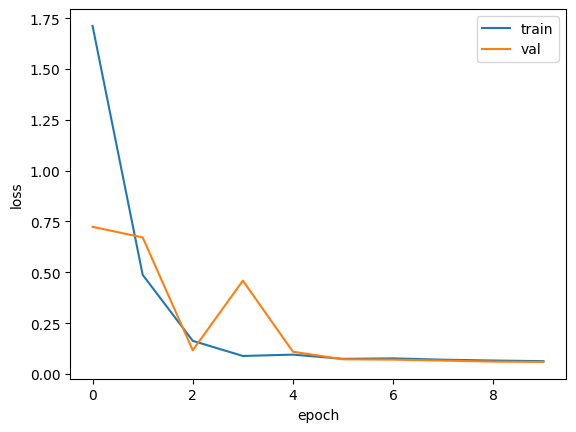

In [ ]:
#Optimizer selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()




  print("Adam")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()






  print("RMSprop")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("RMSprop")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("RMSprop")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()





  print("SGD")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('resnet50-all', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.1), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
Epoch 1/10
227/227 [==============================] - 121s 310ms/step - loss: 0.3442 - accuracy: 0.8566 - val_loss: 1.2739 - val_accuracy: 0.4782
Epoch 2/10
227/227 [==============================] - 75s 303ms/step - loss: 0.1028 - accuracy: 0.9602 - val_loss: 1.0951 - val_accuracy: 0.5555
Epoch 3/10
227/227 [==============================] - 76s 304ms/step - loss: 0.0529 - accuracy: 0.9775 - val_loss: 0.1965 - val_accuracy: 0.9222
Epoch 5/10
227/227 [==============================] - 76s 303ms/step - loss: 0.0461 - accuracy: 0.9786 - val_loss: 0.0737 - val_accuracy: 0.9662
Epoch 6/10
227/227 [==============================] - 76s 303ms/step - loss: 0.0428 - accuracy: 0.9812 - val_loss: 0.0718 - val_accuracy: 0.9719
Epoch 7/10
227/227 [==============================] - 77s 304ms/step - loss: 0.0353 - accuracy: 0.9851 - val_loss: 0.0590 - val_accuracy: 0.9754
Epoch 8/10
227/227 [==============================] - 76s 302ms/step - loss: 0.0356 - accuracy: 0.9847 - val_loss: 0.0852 -

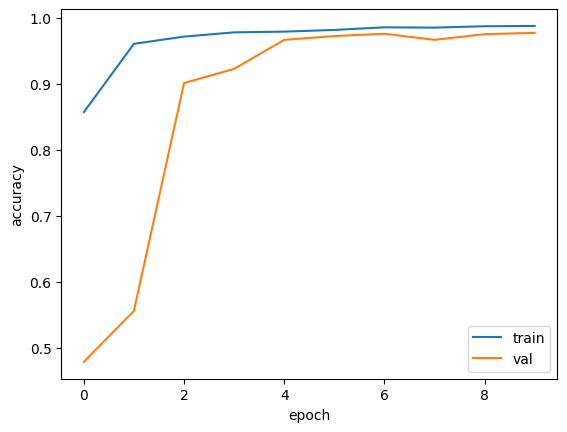

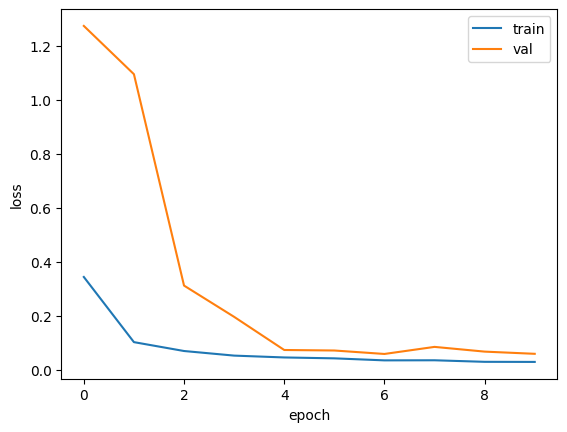


AdamW
Epoch 1/10
227/227 [==============================] - 116s 307ms/step - loss: 0.2548 - accuracy: 0.8879 - val_loss: 0.7050 - val_accuracy: 0.5331
Epoch 2/10
227/227 [==============================] - 75s 302ms/step - loss: 0.0746 - accuracy: 0.9699 - val_loss: 1.1069 - val_accuracy: 0.6246
Epoch 3/10
227/227 [==============================] - 75s 303ms/step - loss: 0.0531 - accuracy: 0.9759 - val_loss: 0.2215 - val_accuracy: 0.9244
Epoch 4/10
227/227 [==============================] - 76s 303ms/step - loss: 0.0483 - accuracy: 0.9780 - val_loss: 0.1654 - val_accuracy: 0.9401
Epoch 5/10
227/227 [==============================] - 76s 302ms/step - loss: 0.0426 - accuracy: 0.9805 - val_loss: 0.0620 - val_accuracy: 0.9726
Epoch 6/10
227/227 [==============================] - 75s 303ms/step - loss: 0.0331 - accuracy: 0.9846 - val_loss: 0.0776 - val_accuracy: 0.9666
Epoch 7/10
227/227 [==============================] - 75s 304ms/step - loss: 0.0401 - accuracy: 0.9813 - val_loss: 0.1023 

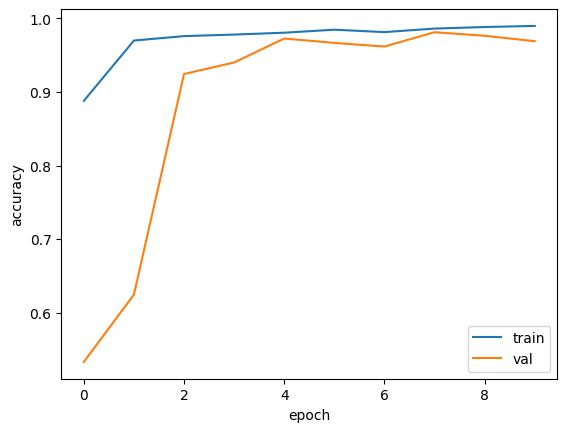

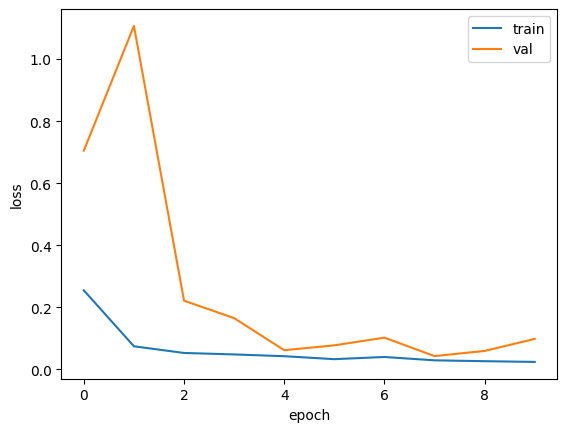


AdamW
Epoch 1/10
227/227 [==============================] - 116s 309ms/step - loss: 0.4425 - accuracy: 0.8388 - val_loss: 0.7152 - val_accuracy: 0.4514
Epoch 2/10
227/227 [==============================] - 76s 303ms/step - loss: 0.0930 - accuracy: 0.9631 - val_loss: 0.8623 - val_accuracy: 0.6088
Epoch 3/10
227/227 [==============================] - 75s 302ms/step - loss: 0.0581 - accuracy: 0.9747 - val_loss: 0.2066 - val_accuracy: 0.9255
Epoch 4/10
227/227 [==============================] - 75s 301ms/step - loss: 0.0512 - accuracy: 0.9771 - val_loss: 0.0797 - val_accuracy: 0.9664
Epoch 5/10
227/227 [==============================] - 75s 301ms/step - loss: 0.0484 - accuracy: 0.9774 - val_loss: 0.0671 - val_accuracy: 0.9685
Epoch 6/10
227/227 [==============================] - 76s 303ms/step - loss: 0.0405 - accuracy: 0.9813 - val_loss: 0.0485 - val_accuracy: 0.9764
Epoch 7/10
227/227 [==============================] - 75s 304ms/step - loss: 0.0327 - accuracy: 0.9846 - val_loss: 0.0713 

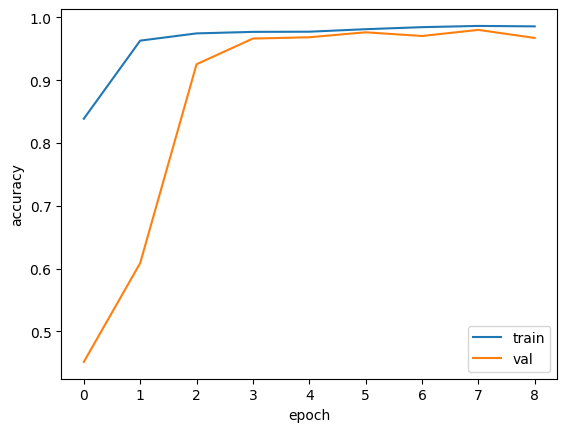

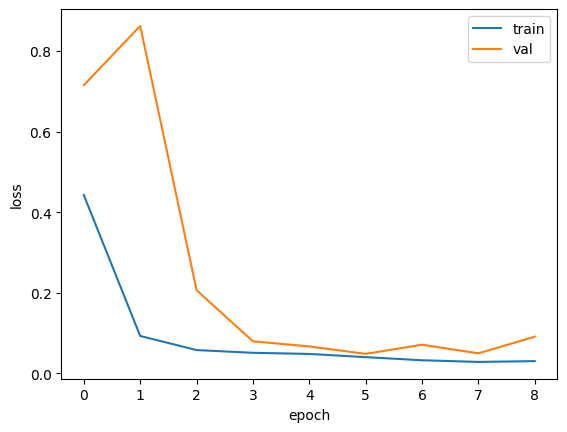

In [ ]:
#Activation function selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50-all', 'tanh', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('resnet50-all', 'sigmoid', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('resnet50-all', 'gelu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()





AdamW
Epoch 1/10
    227/Unknown - 110s 255ms/step - loss: 0.4047 - accuracy: 0.8570Epoch 2/10
227/227 [==============================] - 77s 306ms/step - loss: 0.0899 - accuracy: 0.9641 - val_loss: 0.9256 - val_accuracy: 0.5888
Epoch 3/10
227/227 [==============================] - 81s 324ms/step - loss: 0.0567 - accuracy: 0.9753 - val_loss: 0.1420 - val_accuracy: 0.9423
Epoch 4/10
227/227 [==============================] - 84s 319ms/step - loss: 0.0455 - accuracy: 0.9791 - val_loss: 0.0660 - val_accuracy: 0.9688
Epoch 5/10
227/227 [==============================] - 85s 325ms/step - loss: 0.0401 - accuracy: 0.9812 - val_loss: 0.0834 - val_accuracy: 0.9687
Epoch 6/10
227/227 [==============================] - 86s 328ms/step - loss: 0.0364 - accuracy: 0.9829 - val_loss: 0.2627 - val_accuracy: 0.9417
Epoch 7/10
227/227 [==============================] - 85s 327ms/step - loss: 0.0359 - accuracy: 0.9834 - val_loss: 0.0703 - val_accuracy: 0.9690


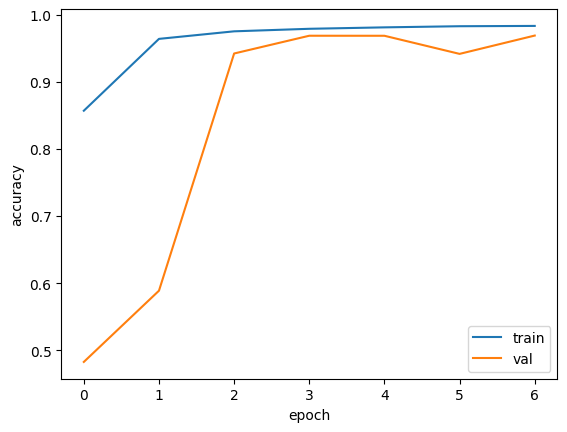

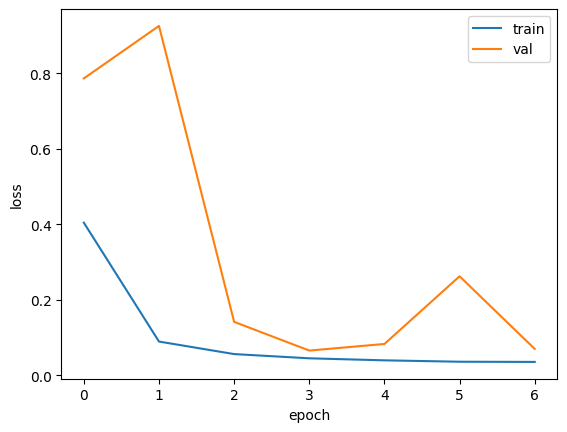


AdamW
Epoch 1/10
227/227 [==============================] - 127s 324ms/step - loss: 0.3325 - accuracy: 0.8635 - val_loss: 0.7182 - val_accuracy: 0.5408
Epoch 2/10
227/227 [==============================] - 83s 321ms/step - loss: 0.0875 - accuracy: 0.9653 - val_loss: 0.9017 - val_accuracy: 0.6315
Epoch 3/10
227/227 [==============================] - 82s 318ms/step - loss: 0.0586 - accuracy: 0.9746 - val_loss: 0.2020 - val_accuracy: 0.9190
Epoch 4/10
227/227 [==============================] - 84s 324ms/step - loss: 0.0460 - accuracy: 0.9788 - val_loss: 0.0814 - val_accuracy: 0.9631
Epoch 5/10
227/227 [==============================] - 83s 318ms/step - loss: 0.0422 - accuracy: 0.9807 - val_loss: 0.0527 - val_accuracy: 0.9768
Epoch 6/10
227/227 [==============================] - 84s 323ms/step - loss: 0.0354 - accuracy: 0.9842 - val_loss: 0.0608 - val_accuracy: 0.9727
Epoch 7/10
227/227 [==============================] - 87s 331ms/step - loss: 0.0317 - accuracy: 0.9852 - val_loss: 0.0607 

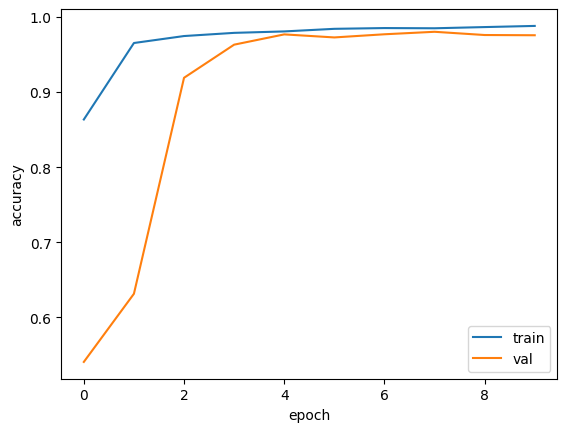

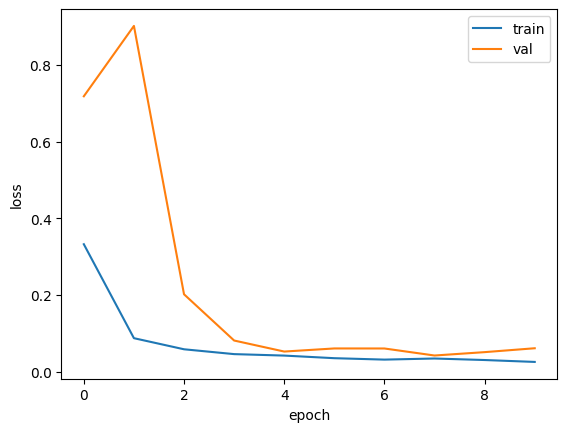

In [ ]:

#Dropout rate selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50-all', 'relu', 0.1)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("AdamW")
  # Compile the model
  model = get_model('resnet50-all', 'relu', 0.3)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


Epoch 1/10
227/227 [==============================] - 135s 340ms/step - loss: 0.4444 - accuracy: 0.8441 - val_loss: 0.7796 - val_accuracy: 0.5128
Epoch 2/10
227/227 [==============================] - 75s 297ms/step - loss: 0.0926 - accuracy: 0.9622 - val_loss: 1.0651 - val_accuracy: 0.5876
Epoch 3/10
227/227 [==============================] - 74s 297ms/step - loss: 0.0612 - accuracy: 0.9735 - val_loss: 0.1992 - val_accuracy: 0.9229
Epoch 4/10
227/227 [==============================] - 74s 297ms/step - loss: 0.0462 - accuracy: 0.9782 - val_loss: 0.0701 - val_accuracy: 0.9716
Epoch 5/10
227/227 [==============================] - 74s 299ms/step - loss: 0.0418 - accuracy: 0.9804 - val_loss: 0.0769 - val_accuracy: 0.9665
Epoch 6/10
227/227 [==============================] - 74s 298ms/step - loss: 0.0391 - accuracy: 0.9817 - val_loss: 0.0508 - val_accuracy: 0.9761
Epoch 7/10
227/227 [==============================] - 75s 299ms/step - loss: 0.0356 - accuracy: 0.9847 - val_loss: 0.2075 - val_a

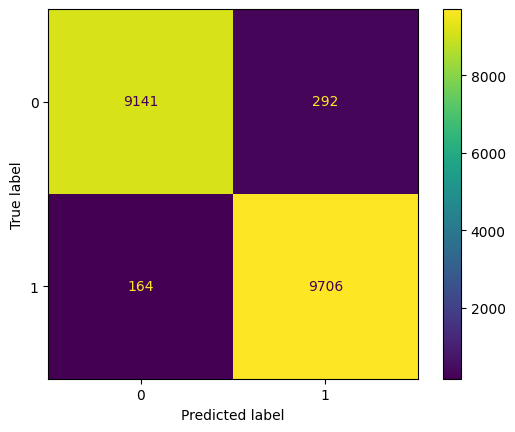


Precision:  0.9707941588317663
Recall:  0.9833839918946302
F1:  0.9770485202335415
Avg acc: 0.9764
0.976376729005854 0.976376729005854 0.976376729005854 0.976376729005854 0.976376729005854 0.976376729005854 0.976376729005854
Standard error: 0.0000
126/126 [==============================] - 9s 64ms/step
[[9.8524803e-01 1.4752007e-02]
 [9.8025268e-01 1.9747337e-02]
 [9.5497507e-01 4.5024958e-02]
 ...
 [9.9999958e-01 3.2270731e-07]
 [9.9999994e-01 1.5279552e-07]
 [9.9999988e-01 2.1592975e-07]]
32134


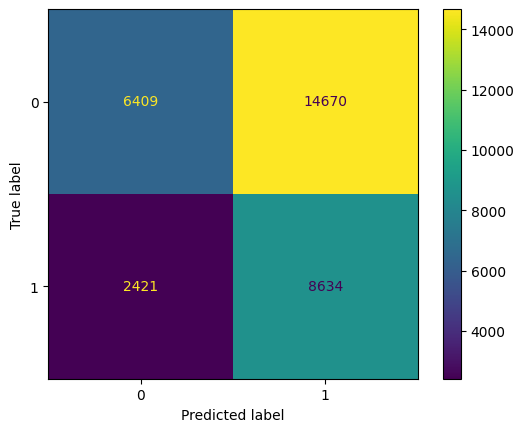


Precision:  0.37049433573635426
Recall:  0.7810040705563094
F1:  0.5025757443464595
Avg acc: 0.4681
0.46813344121491257 0.46813344121491257 0.46813344121491257 0.46813344121491257 0.46813344121491257 0.46813344121491257 0.46813344121491257
Standard error: 0.0000


In [ ]:
model = get_model('resnet50-all', 'relu', 0.2)
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # Make predictions on the test set
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp))

  tf.random.set_seed(42)
  np.random.seed(71516)
  y2 = np.array(model.predict(test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # test_loss, test_acc = model.evaluate(unseen_test_dataset)
  # print('Unseen Test accuracy:', test_acc)
  # print('Unseen Test loss:', test_loss)
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(unseen_test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(42)
  np.random.seed(42)
  y2 = np.array(model.predict(unseen_test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(unseen_test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(unseen_test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(unseen_test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(unseen_test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(unseen_test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp_unseen))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp_unseen
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

ResNet-50

Hyperparameter tuning

In [ ]:

# with tf.device('/gpu:0'):
#   # Define a function to build the model
#   def build_model(hp):
#     global hparam
#     hp = hparam
#     # Create an optimizer based on the chosen hyperparameters
#     optim = None
#     if hparam.get('optimizer') == 'adam':
#         optim = tf.keras.optimizers.Adam(learning_rate=hparam.get('learning_rate'))
#     elif hparam.get('optimizer') == 'adamw':
#         optim = tf.keras.optimizers.AdamW(learning_rate=hparam.get('learning_rate'))
#     elif hparam.get('optimizer') == 'adagrad':
#         optim = tf.keras.optimizers.experimental.Adagrad(learning_rate=hparam.get('learning_rate'))
#     elif hparam.get('optimizer') == 'rmsprop':
#         optim = tf.keras.optimizers.experimental.RMSprop(learning_rate=hparam.get('learning_rate'))
#     else:
#         optim = tf.keras.optimizers.SGD(learning_rate=hparam.get('learning_rate'))

#     # Compile the model
#     model = Sequential()

#     # Convolutional layers
#     model.add(Conv2D(32, (3, 3), activation=hparam.get('units_activation'), input_shape=(64, 64, 3)))
#     model.add(MaxPooling2D(pool_size=(2, 2)))
#     model.add(Conv2D(64, (3, 3), activation=hparam.get('units_activation')))
#     model.add(MaxPooling2D(pool_size=(2, 2)))
#     model.add(Dropout(hparam.get('dropout_rate')))
#     # Dense layers
#     model.add(Flatten())
#     model.add(Dense(hparam['units'], activation=hparam.get('units_activation')))
#     model.add(Dense(2, activation='softmax'))

#     model.compile(optimizer=optim, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
#     return model
  
#   hparam = hp()
#   hparam.Choice('learning_rate', [0.0001, 0.001, 0.01, 0.1])
#   # 'num_hidden_layers': hp.Choice('num_hidden_layers', [1, 2, 3, 4]),
#   hparam.Choice('units', [64, 128, 256, 512, 1024])
#   hparam.Choice('units_activation', ['relu', 'tanh', 'LeakyReLU'])
#   hparam.Choice('dropout_rate', [0.1, 0.2, 0.3, 0.4])
#   hparam.Choice('optimizer', ['adam', 'adamw', 'adagrad', 'rmsprop', 'sgd'])

#   # # Create a tuner object and define search strategy
#   # tuner = kt.Hyperband(build_model, objective='val_accuracy', max_epochs=1, factor=3, directory='my_dir', project_name='cat_dog')
#   tuner = keras_tuner.RandomSearch(
#     build_model,
#     max_trials=10,
#     # Do not resume the previous search in the same directory.
#     overwrite=True,
#     objective="val_accuracy",
#     # Set a directory to store the intermediate results.
#     directory="my_dir/cat_dog",
#   )
  
#   # Define callbacks
#   callbacks = [
#     tf.keras.callbacks.EarlyStopping(patience=3),
#     tf.keras.callbacks.TensorBoard(log_dir='my_dir/cat_dog_logs', histogram_freq=1)
#   ]

#   # Perform the hyperparameter search
#   tuner.search(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)

#   # Get the best hyperparameters and build the model
#   temp = tuner.get_best_hyperparameters(num_trials=10)
#   print(temp)
#   best_hyperparameters = tuner.get_best_hyperparameters(num_trials=10)
#   model = build_model(best_hyperparameters)

# %load_ext tensorboard
# %tensorboard --logdir=my_dir/cat_dog_logs

Trial 1 Complete [00h 04m 33s]
val_accuracy: 0.9573597311973572

Best val_accuracy So Far: 0.9573597311973572
Total elapsed time: 00h 04m 33s


Reusing TensorBoard on port 6006 (pid 18378), started 0:31:29 ago. (Use '!kill 18378' to kill it.)

<IPython.core.display.Javascript object>

Training

AdamW
94765736/94765736 [==============================] - 4s 0us/step
Epoch 1/10
227/227 [==============================] - 48s 127ms/step - loss: 0.5618 - accuracy: 0.7113 - val_loss: 0.4525 - val_accuracy: 0.8020
Epoch 2/10
227/227 [==============================] - 33s 118ms/step - loss: 0.4117 - accuracy: 0.8170 - val_loss: 0.3637 - val_accuracy: 0.8491
Epoch 3/10
227/227 [==============================] - 32s 115ms/step - loss: 0.3487 - accuracy: 0.8475 - val_loss: 0.3143 - val_accuracy: 0.8589
Epoch 4/10
227/227 [==============================] - 33s 119ms/step - loss: 0.2881 - accuracy: 0.8800 - val_loss: 0.2483 - val_accuracy: 0.8985
Epoch 5/10
227/227 [==============================] - 32s 115ms/step - loss: 0.2512 - accuracy: 0.8973 - val_loss: 0.2194 - val_accuracy: 0.9128
Epoch 6/10
227/227 [==============================] - 32s 118ms/step - loss: 0.2204 - accuracy: 0.9117 - val_loss: 0.1878 - val_accuracy: 0.9289
Epoch 7/10
227/227 [==============================] - 33s 1

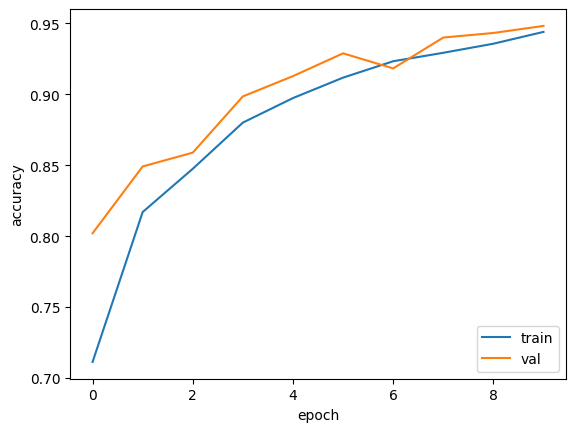

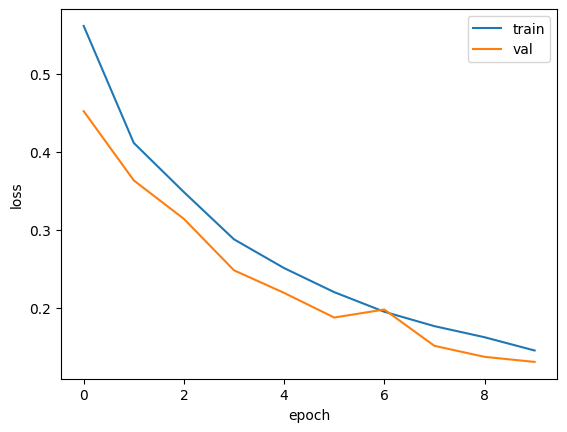


Epoch 1/10
227/227 [==============================] - 36s 120ms/step - loss: 0.8722 - accuracy: 0.6269 - val_loss: 0.5037 - val_accuracy: 0.7565
Epoch 2/10
227/227 [==============================] - 33s 116ms/step - loss: 0.4564 - accuracy: 0.7770 - val_loss: 0.4256 - val_accuracy: 0.7867
Epoch 3/10
227/227 [==============================] - 32s 118ms/step - loss: 0.3940 - accuracy: 0.8040 - val_loss: 0.3904 - val_accuracy: 0.8030
Epoch 4/10
227/227 [==============================] - 39s 131ms/step - loss: 0.3740 - accuracy: 0.8082 - val_loss: 0.3023 - val_accuracy: 0.8699
Epoch 5/10
227/227 [==============================] - 35s 118ms/step - loss: 0.3633 - accuracy: 0.8235 - val_loss: 0.3088 - val_accuracy: 0.8539
Epoch 6/10
227/227 [==============================] - 32s 117ms/step - loss: 0.3489 - accuracy: 0.8354 - val_loss: 0.2867 - val_accuracy: 0.8735
Epoch 7/10
227/227 [==============================] - 33s 119ms/step - loss: 0.3336 - accuracy: 0.8436 - val_loss: 0.2744 - val_a

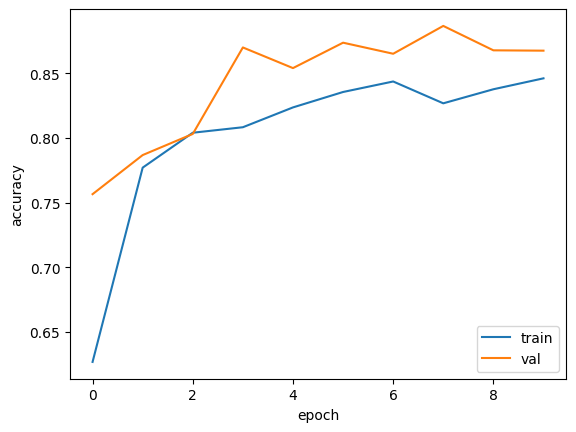

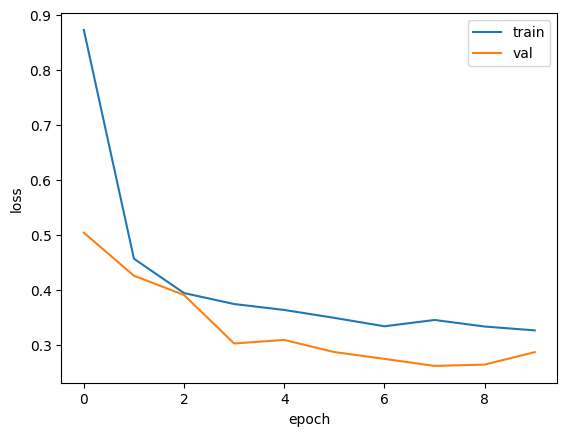


Epoch 1/10
227/227 [==============================] - 36s 120ms/step - loss: 0.6097 - accuracy: 0.6585 - val_loss: 0.5322 - val_accuracy: 0.7386
Epoch 2/10
227/227 [==============================] - 33s 119ms/step - loss: 0.5170 - accuracy: 0.7431 - val_loss: 0.4877 - val_accuracy: 0.7666
Epoch 3/10
227/227 [==============================] - 32s 116ms/step - loss: 0.4676 - accuracy: 0.7845 - val_loss: 0.4393 - val_accuracy: 0.8136
Epoch 4/10
227/227 [==============================] - 32s 117ms/step - loss: 0.4263 - accuracy: 0.8129 - val_loss: 0.4004 - val_accuracy: 0.8325
Epoch 5/10
227/227 [==============================] - 33s 117ms/step - loss: 0.3911 - accuracy: 0.8351 - val_loss: 0.3665 - val_accuracy: 0.8487
Epoch 6/10
227/227 [==============================] - 32s 116ms/step - loss: 0.3610 - accuracy: 0.8529 - val_loss: 0.3389 - val_accuracy: 0.8628
Epoch 7/10
227/227 [==============================] - 33s 118ms/step - loss: 0.3367 - accuracy: 0.8663 - val_loss: 0.3278 - val_a

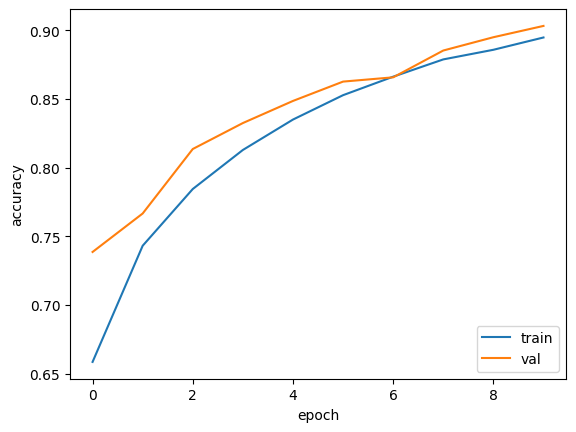

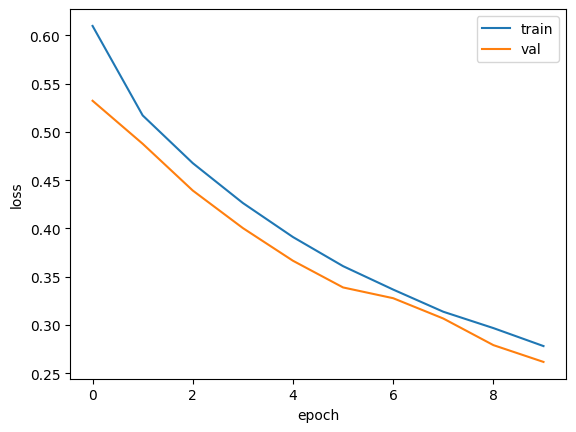


Adam
Epoch 1/10
227/227 [==============================] - 39s 123ms/step - loss: 0.5683 - accuracy: 0.7104 - val_loss: 0.4524 - val_accuracy: 0.7917
Epoch 2/10
227/227 [==============================] - 32s 116ms/step - loss: 0.4199 - accuracy: 0.8105 - val_loss: 0.3598 - val_accuracy: 0.8485
Epoch 3/10
227/227 [==============================] - 32s 116ms/step - loss: 0.3343 - accuracy: 0.8584 - val_loss: 0.2909 - val_accuracy: 0.8843
Epoch 4/10
227/227 [==============================] - 33s 116ms/step - loss: 0.2797 - accuracy: 0.8867 - val_loss: 0.2342 - val_accuracy: 0.9074
Epoch 5/10
227/227 [==============================] - 32s 116ms/step - loss: 0.2424 - accuracy: 0.9025 - val_loss: 0.2051 - val_accuracy: 0.9205
Epoch 6/10
227/227 [==============================] - 33s 118ms/step - loss: 0.2175 - accuracy: 0.9133 - val_loss: 0.1824 - val_accuracy: 0.9363
Epoch 7/10
227/227 [==============================] - 32s 115ms/step - loss: 0.1833 - accuracy: 0.9291 - val_loss: 0.1592 - 

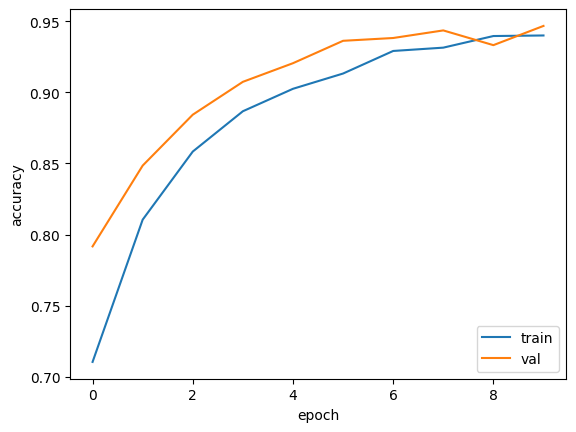

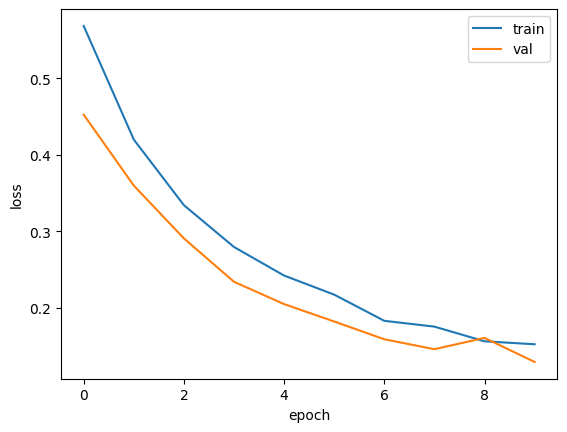


Adam
Epoch 1/10
227/227 [==============================] - 38s 125ms/step - loss: 0.7460 - accuracy: 0.6934 - val_loss: 0.4439 - val_accuracy: 0.8115
Epoch 2/10
227/227 [==============================] - 34s 120ms/step - loss: 0.4111 - accuracy: 0.8125 - val_loss: 0.3900 - val_accuracy: 0.8301
Epoch 3/10
227/227 [==============================] - 33s 119ms/step - loss: 0.3550 - accuracy: 0.8436 - val_loss: 0.3189 - val_accuracy: 0.8496
Epoch 4/10
227/227 [==============================] - 33s 120ms/step - loss: 0.3533 - accuracy: 0.8348 - val_loss: 0.2979 - val_accuracy: 0.8634
Epoch 5/10
227/227 [==============================] - 33s 118ms/step - loss: 0.3491 - accuracy: 0.8313 - val_loss: 0.3515 - val_accuracy: 0.8552
Epoch 6/10
227/227 [==============================] - 34s 122ms/step - loss: 0.3567 - accuracy: 0.8220 - val_loss: 0.5581 - val_accuracy: 0.7143
Epoch 7/10
227/227 [==============================] - 34s 119ms/step - loss: 0.3863 - accuracy: 0.7975 - val_loss: 0.2848 - 

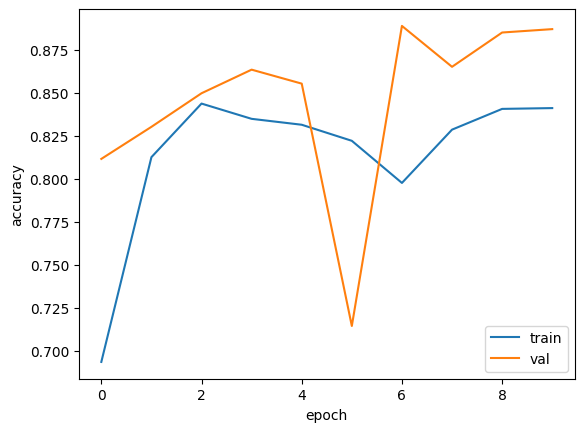

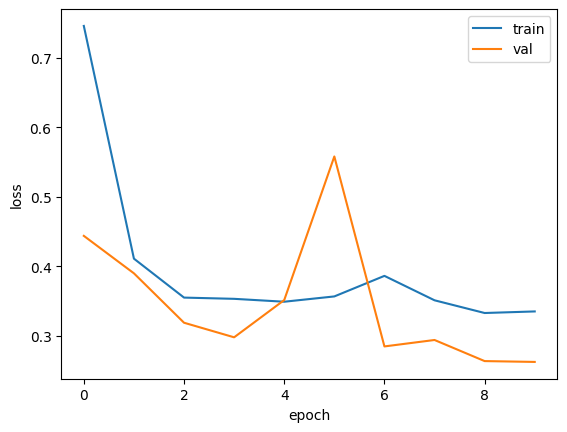


Adam
Epoch 1/10
227/227 [==============================] - 39s 126ms/step - loss: 0.5880 - accuracy: 0.6752 - val_loss: 0.5287 - val_accuracy: 0.7287
Epoch 2/10
227/227 [==============================] - 34s 122ms/step - loss: 0.5075 - accuracy: 0.7504 - val_loss: 0.4730 - val_accuracy: 0.7824
Epoch 3/10
227/227 [==============================] - 35s 126ms/step - loss: 0.4575 - accuracy: 0.7904 - val_loss: 0.4437 - val_accuracy: 0.7850
Epoch 4/10
227/227 [==============================] - 42s 139ms/step - loss: 0.4157 - accuracy: 0.8212 - val_loss: 0.3907 - val_accuracy: 0.8340
Epoch 5/10
227/227 [==============================] - 69s 253ms/step - loss: 0.3811 - accuracy: 0.8389 - val_loss: 0.3581 - val_accuracy: 0.8514
Epoch 6/10
227/227 [==============================] - 52s 156ms/step - loss: 0.3529 - accuracy: 0.8555 - val_loss: 0.3313 - val_accuracy: 0.8731
Epoch 7/10
227/227 [==============================] - 49s 162ms/step - loss: 0.3267 - accuracy: 0.8717 - val_loss: 0.3089 - 

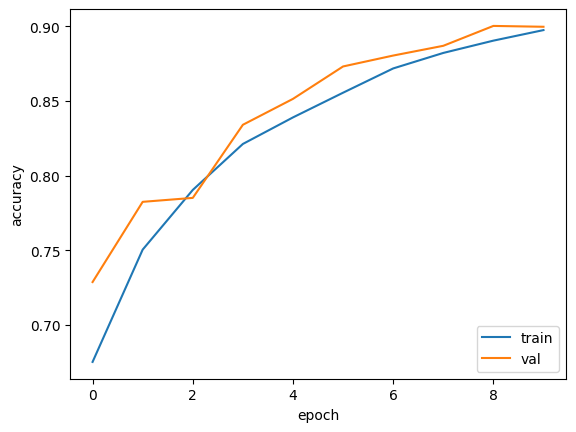

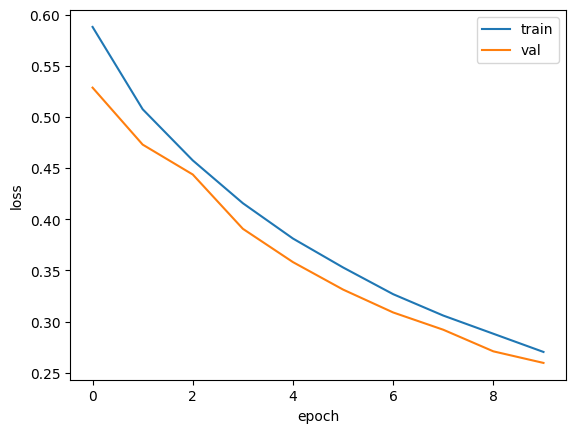


RMSprop
Epoch 1/10
227/227 [==============================] - 44s 127ms/step - loss: 0.6775 - accuracy: 0.6389 - val_loss: 0.5502 - val_accuracy: 0.7347
Epoch 2/10
227/227 [==============================] - 45s 161ms/step - loss: 0.5390 - accuracy: 0.7134 - val_loss: 0.5357 - val_accuracy: 0.7123
Epoch 3/10
227/227 [==============================] - 42s 148ms/step - loss: 0.4750 - accuracy: 0.7591 - val_loss: 0.4041 - val_accuracy: 0.8058
Epoch 4/10
227/227 [==============================] - 56s 177ms/step - loss: 0.4259 - accuracy: 0.7899 - val_loss: 0.3924 - val_accuracy: 0.8101
Epoch 5/10
227/227 [==============================] - 42s 130ms/step - loss: 0.3795 - accuracy: 0.8157 - val_loss: 0.3189 - val_accuracy: 0.8434
Epoch 6/10
227/227 [==============================] - 39s 123ms/step - loss: 0.3428 - accuracy: 0.8368 - val_loss: 0.4092 - val_accuracy: 0.7813
Epoch 7/10
227/227 [==============================] - 37s 129ms/step - loss: 0.3145 - accuracy: 0.8554 - val_loss: 0.2621

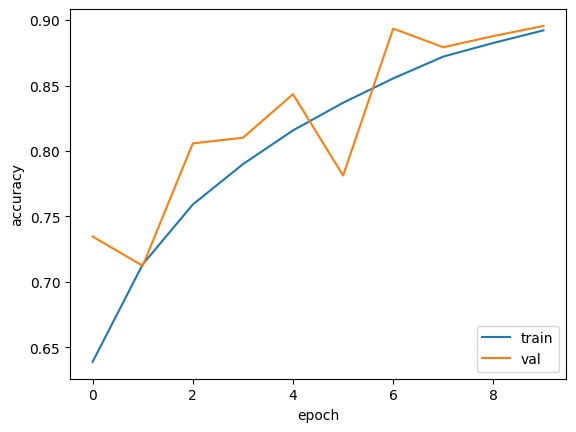

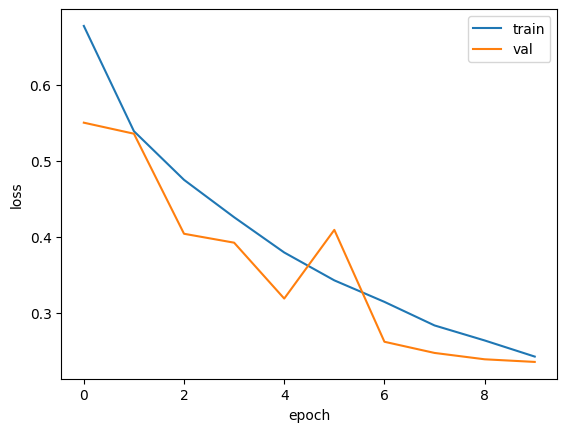


RMSprop
Epoch 1/10
227/227 [==============================] - 45s 138ms/step - loss: 1.3388 - accuracy: 0.6101 - val_loss: 0.5830 - val_accuracy: 0.6942
Epoch 2/10
227/227 [==============================] - 47s 156ms/step - loss: 0.5847 - accuracy: 0.6789 - val_loss: 0.5888 - val_accuracy: 0.6442
Epoch 3/10
227/227 [==============================] - 41s 124ms/step - loss: 0.5319 - accuracy: 0.7111 - val_loss: 0.5558 - val_accuracy: 0.6931
Epoch 4/10
227/227 [==============================] - 38s 134ms/step - loss: 0.4976 - accuracy: 0.7330 - val_loss: 0.7749 - val_accuracy: 0.6089
Epoch 5/10
227/227 [==============================] - 39s 126ms/step - loss: 0.4679 - accuracy: 0.7519 - val_loss: 0.4820 - val_accuracy: 0.7213
Epoch 6/10
227/227 [==============================] - 38s 133ms/step - loss: 0.4429 - accuracy: 0.7624 - val_loss: 0.5671 - val_accuracy: 0.6995
Epoch 7/10
227/227 [==============================] - 40s 134ms/step - loss: 0.4279 - accuracy: 0.7710 - val_loss: 0.4240

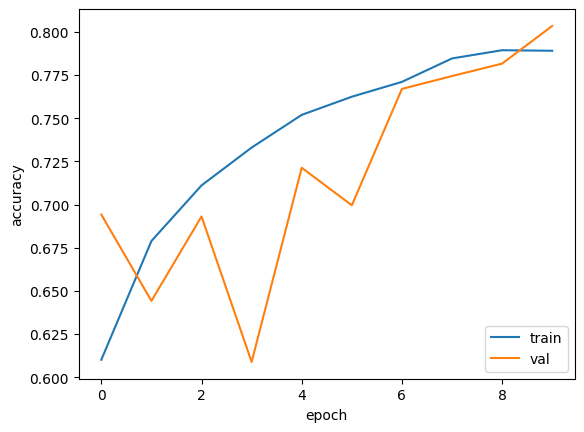

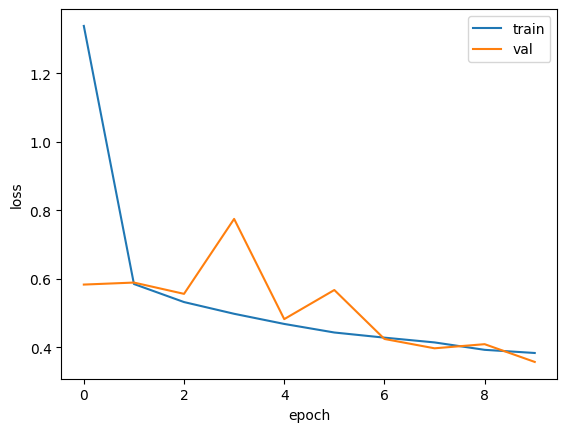


RMSprop
Epoch 1/10
227/227 [==============================] - 60s 169ms/step - loss: 0.6087 - accuracy: 0.6582 - val_loss: 0.5530 - val_accuracy: 0.6935
Epoch 2/10
227/227 [==============================] - 50s 157ms/step - loss: 0.5366 - accuracy: 0.7235 - val_loss: 0.5624 - val_accuracy: 0.7007
Epoch 3/10
227/227 [==============================] - 46s 149ms/step - loss: 0.4988 - accuracy: 0.7566 - val_loss: 0.5049 - val_accuracy: 0.7640
Epoch 4/10
227/227 [==============================] - 47s 149ms/step - loss: 0.4672 - accuracy: 0.7822 - val_loss: 0.5356 - val_accuracy: 0.6982
Epoch 5/10
227/227 [==============================] - 46s 147ms/step - loss: 0.4405 - accuracy: 0.7992 - val_loss: 0.4224 - val_accuracy: 0.8215
Epoch 6/10
227/227 [==============================] - 47s 154ms/step - loss: 0.4139 - accuracy: 0.8160 - val_loss: 0.4863 - val_accuracy: 0.7313
Epoch 7/10
227/227 [==============================] - 48s 151ms/step - loss: 0.3914 - accuracy: 0.8299 - val_loss: 0.4162

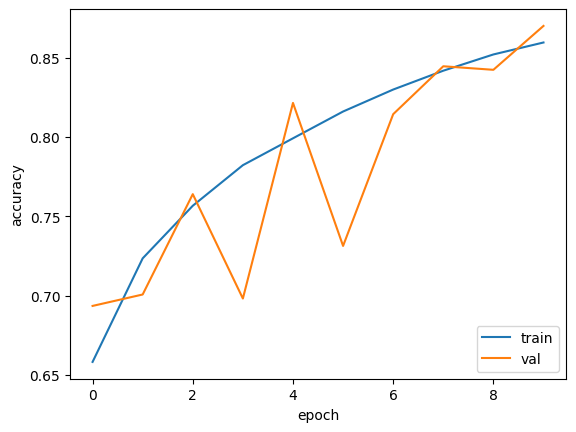

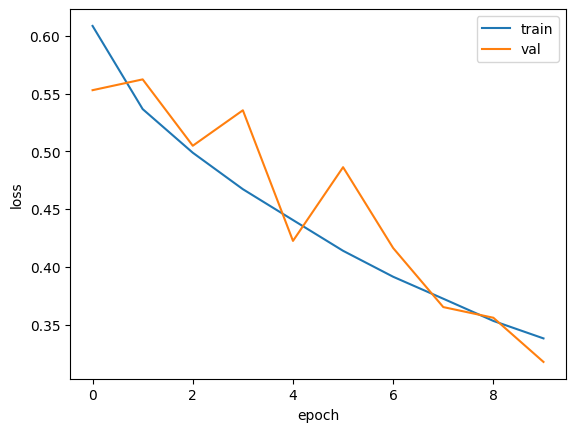


SGD
Epoch 1/10
227/227 [==============================] - 40s 123ms/step - loss: 0.6955 - accuracy: 0.5853 - val_loss: 0.6227 - val_accuracy: 0.6433
Epoch 2/10
227/227 [==============================] - 34s 119ms/step - loss: 0.6290 - accuracy: 0.6350 - val_loss: 0.6716 - val_accuracy: 0.5652
Epoch 3/10
227/227 [==============================] - 33s 118ms/step - loss: 0.6124 - accuracy: 0.6543 - val_loss: 0.5844 - val_accuracy: 0.6964
Epoch 4/10
227/227 [==============================] - 34s 119ms/step - loss: 0.6049 - accuracy: 0.6655 - val_loss: 0.5721 - val_accuracy: 0.7193
Epoch 5/10
227/227 [==============================] - 34s 120ms/step - loss: 0.5922 - accuracy: 0.6756 - val_loss: 0.6159 - val_accuracy: 0.6218
Epoch 6/10
227/227 [==============================] - 34s 119ms/step - loss: 0.5820 - accuracy: 0.6871 - val_loss: 0.5752 - val_accuracy: 0.6711
Epoch 7/10
227/227 [==============================] - 34s 121ms/step - loss: 0.5759 - accuracy: 0.6922 - val_loss: 0.5522 - v

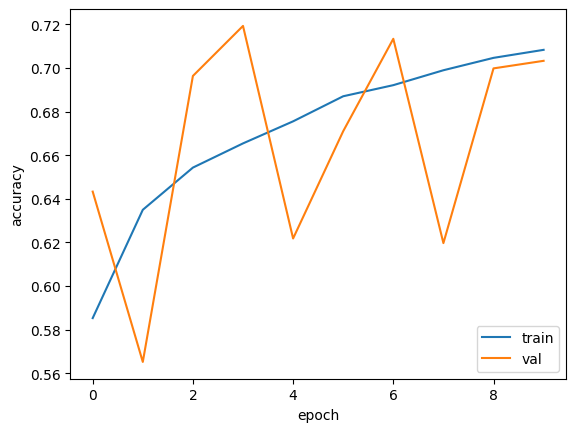

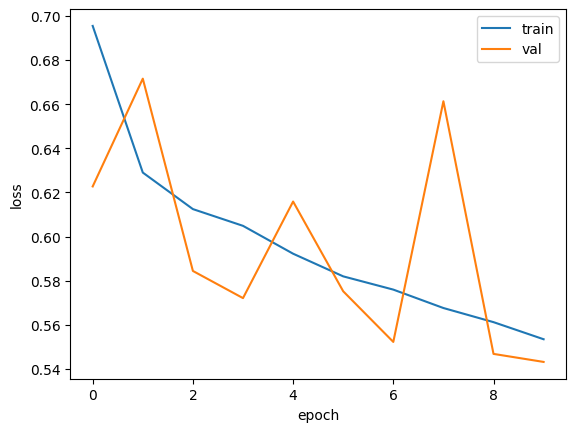


SGD
Epoch 1/10
227/227 [==============================] - 39s 123ms/step - loss: 0.6744 - accuracy: 0.5751 - val_loss: 0.6328 - val_accuracy: 0.6410
Epoch 2/10
227/227 [==============================] - 35s 122ms/step - loss: 0.6336 - accuracy: 0.6374 - val_loss: 0.6245 - val_accuracy: 0.6458
Epoch 3/10
227/227 [==============================] - 51s 169ms/step - loss: 0.6179 - accuracy: 0.6590 - val_loss: 0.6182 - val_accuracy: 0.6431
Epoch 4/10
227/227 [==============================] - 49s 143ms/step - loss: 0.6067 - accuracy: 0.6737 - val_loss: 0.5991 - val_accuracy: 0.6793
Epoch 5/10
227/227 [==============================] - 48s 146ms/step - loss: 0.5989 - accuracy: 0.6828 - val_loss: 0.5866 - val_accuracy: 0.7117
Epoch 6/10
227/227 [==============================] - 48s 160ms/step - loss: 0.5928 - accuracy: 0.6907 - val_loss: 0.6237 - val_accuracy: 0.6226
Epoch 7/10
227/227 [==============================] - 51s 160ms/step - loss: 0.5875 - accuracy: 0.6942 - val_loss: 0.5975 - v

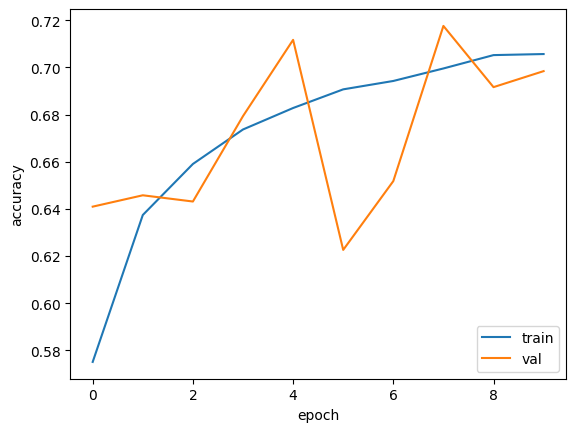

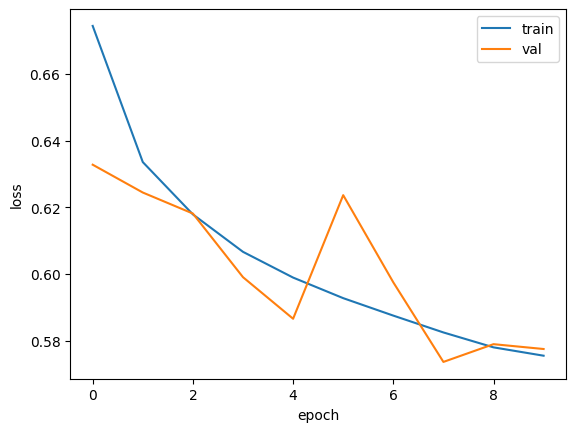


SGD
Epoch 1/10
227/227 [==============================] - 49s 126ms/step - loss: 0.7518 - accuracy: 0.5348 - val_loss: 0.6903 - val_accuracy: 0.5218
Epoch 2/10
227/227 [==============================] - 35s 121ms/step - loss: 0.6914 - accuracy: 0.5093 - val_loss: 0.6926 - val_accuracy: 0.5218
Epoch 3/10
227/227 [==============================] - 34s 119ms/step - loss: 0.6928 - accuracy: 0.5110 - val_loss: 0.6929 - val_accuracy: 0.5218
Epoch 4/10
227/227 [==============================] - 33s 118ms/step - loss: 0.6930 - accuracy: 0.5107 - val_loss: 0.6925 - val_accuracy: 0.5218


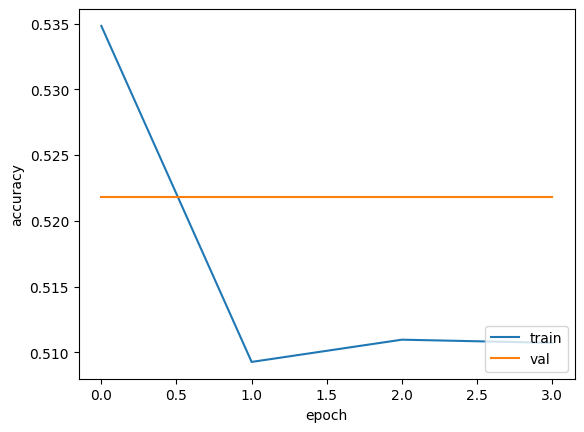

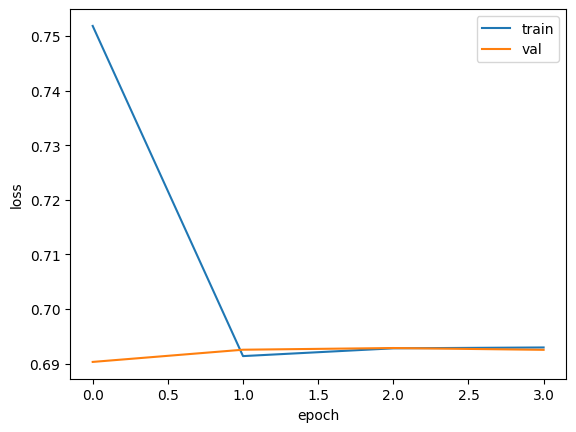

In [ ]:
#Optimizer selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()




  print("Adam")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()






  print("RMSprop")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("RMSprop")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("RMSprop")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()





  print("SGD")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('resnet50', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.1), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
Epoch 1/10
227/227 [==============================] - 53s 135ms/step - loss: 0.6284 - accuracy: 0.6857 - val_loss: 0.4731 - val_accuracy: 0.7568
Epoch 2/10
227/227 [==============================] - 34s 119ms/step - loss: 0.4183 - accuracy: 0.8083 - val_loss: 0.3588 - val_accuracy: 0.8445
Epoch 3/10
227/227 [==============================] - 35s 123ms/step - loss: 0.3834 - accuracy: 0.8281 - val_loss: 0.3318 - val_accuracy: 0.8576
Epoch 4/10
227/227 [==============================] - 34s 121ms/step - loss: 0.3523 - accuracy: 0.8448 - val_loss: 0.4770 - val_accuracy: 0.7863
Epoch 5/10
227/227 [==============================] - 35s 123ms/step - loss: 0.3403 - accuracy: 0.8512 - val_loss: 0.3472 - val_accuracy: 0.8491
Epoch 6/10
227/227 [==============================] - 35s 121ms/step - loss: 0.3306 - accuracy: 0.8567 - val_loss: 0.2950 - val_accuracy: 0.8786
Epoch 7/10
227/227 [==============================] - 36s 124ms/step - loss: 0.3150 - accuracy: 0.8651 - val_loss: 0.2875 - 

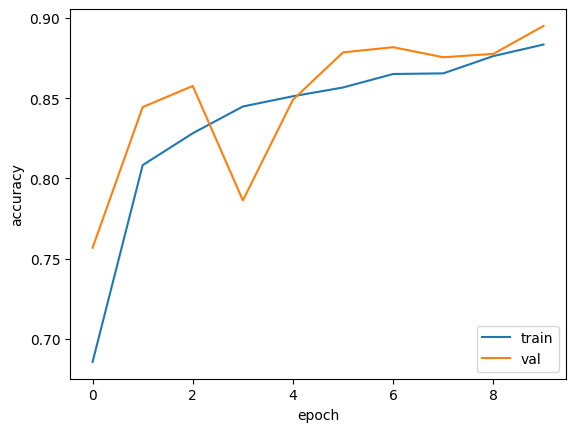

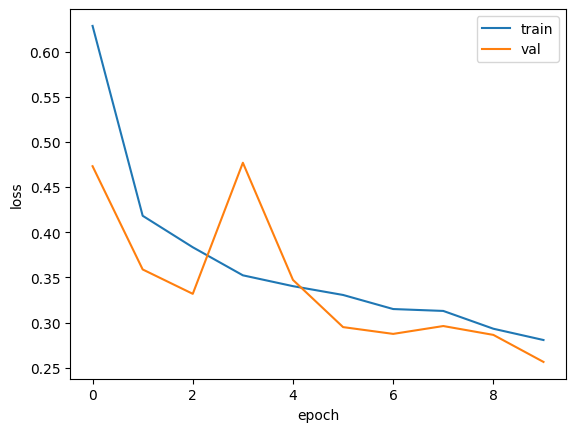


AdamW
Epoch 1/10
227/227 [==============================] - 41s 126ms/step - loss: 0.5792 - accuracy: 0.6911 - val_loss: 0.4874 - val_accuracy: 0.7621
Epoch 2/10
227/227 [==============================] - 36s 121ms/step - loss: 0.4746 - accuracy: 0.7745 - val_loss: 0.4242 - val_accuracy: 0.8088
Epoch 3/10
227/227 [==============================] - 35s 123ms/step - loss: 0.4276 - accuracy: 0.8054 - val_loss: 0.4006 - val_accuracy: 0.8324
Epoch 4/10
227/227 [==============================] - 35s 123ms/step - loss: 0.3884 - accuracy: 0.8278 - val_loss: 0.3565 - val_accuracy: 0.8417
Epoch 5/10
227/227 [==============================] - 34s 120ms/step - loss: 0.3816 - accuracy: 0.8294 - val_loss: 0.3640 - val_accuracy: 0.8464
Epoch 6/10
227/227 [==============================] - 35s 123ms/step - loss: 0.3571 - accuracy: 0.8436 - val_loss: 0.3439 - val_accuracy: 0.8462
Epoch 7/10
227/227 [==============================] - 34s 122ms/step - loss: 0.3537 - accuracy: 0.8457 - val_loss: 0.3218 -

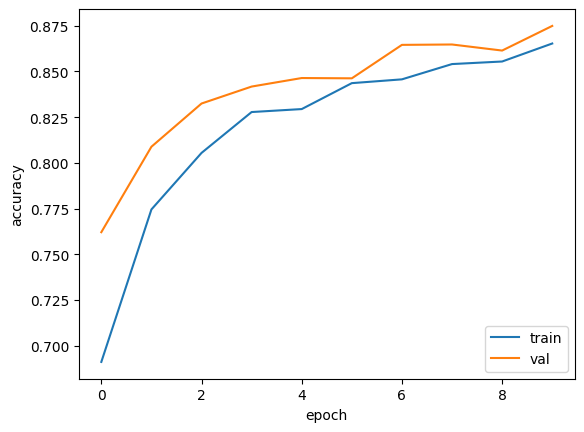

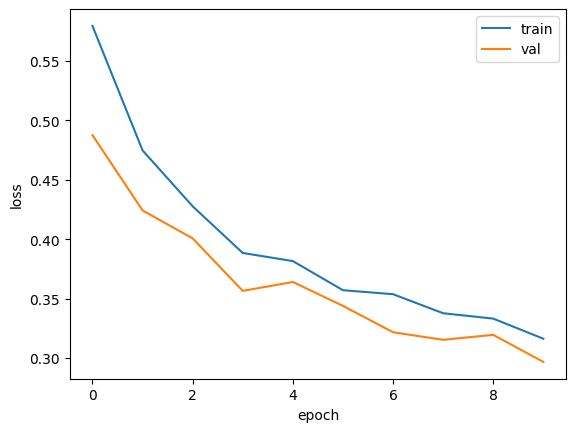


AdamW
Epoch 1/10
227/227 [==============================] - 39s 126ms/step - loss: 0.5617 - accuracy: 0.7132 - val_loss: 0.4522 - val_accuracy: 0.7742
Epoch 2/10
227/227 [==============================] - 34s 120ms/step - loss: 0.4061 - accuracy: 0.8168 - val_loss: 0.3519 - val_accuracy: 0.8474
Epoch 3/10
227/227 [==============================] - 34s 120ms/step - loss: 0.3460 - accuracy: 0.8484 - val_loss: 0.3347 - val_accuracy: 0.8545
Epoch 4/10
227/227 [==============================] - 34s 122ms/step - loss: 0.2931 - accuracy: 0.8756 - val_loss: 0.3430 - val_accuracy: 0.8451
Epoch 5/10
227/227 [==============================] - 35s 123ms/step - loss: 0.2590 - accuracy: 0.8907 - val_loss: 0.2314 - val_accuracy: 0.9036
Epoch 6/10
227/227 [==============================] - 35s 120ms/step - loss: 0.2212 - accuracy: 0.9100 - val_loss: 0.1937 - val_accuracy: 0.9247
Epoch 7/10
227/227 [==============================] - 34s 121ms/step - loss: 0.1981 - accuracy: 0.9204 - val_loss: 0.1703 -

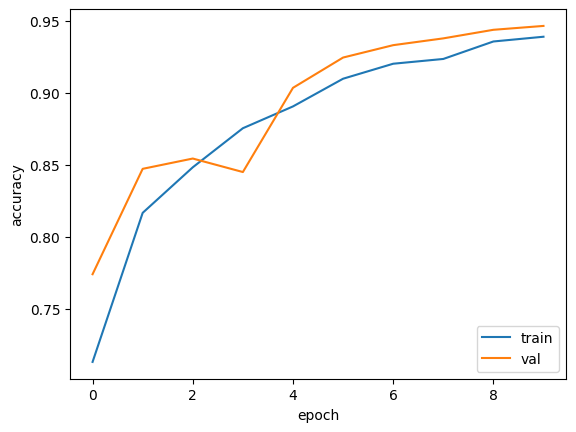

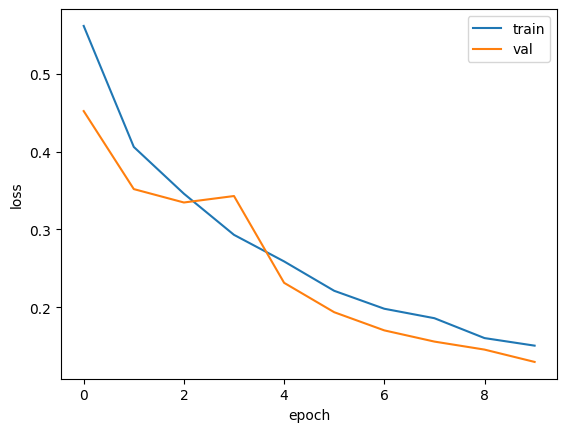

In [ ]:
#Activation function selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50', 'tanh', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('resnet50', 'sigmoid', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('resnet50', 'gelu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

AdamW
Epoch 1/10
227/227 [==============================] - 41s 130ms/step - loss: 0.5626 - accuracy: 0.7120 - val_loss: 0.4515 - val_accuracy: 0.8075
Epoch 2/10
227/227 [==============================] - 34s 120ms/step - loss: 0.4259 - accuracy: 0.8050 - val_loss: 0.3666 - val_accuracy: 0.8414
Epoch 3/10
227/227 [==============================] - 35s 123ms/step - loss: 0.3580 - accuracy: 0.8448 - val_loss: 0.3271 - val_accuracy: 0.8636
Epoch 4/10
227/227 [==============================] - 35s 123ms/step - loss: 0.2952 - accuracy: 0.8786 - val_loss: 0.2836 - val_accuracy: 0.8800
Epoch 5/10
227/227 [==============================] - 34s 121ms/step - loss: 0.2583 - accuracy: 0.8944 - val_loss: 0.2419 - val_accuracy: 0.9001
Epoch 6/10
227/227 [==============================] - 34s 123ms/step - loss: 0.2219 - accuracy: 0.9127 - val_loss: 0.1962 - val_accuracy: 0.9270
Epoch 7/10
227/227 [==============================] - 34s 121ms/step - loss: 0.2000 - accuracy: 0.9213 - val_loss: 0.2324 - 

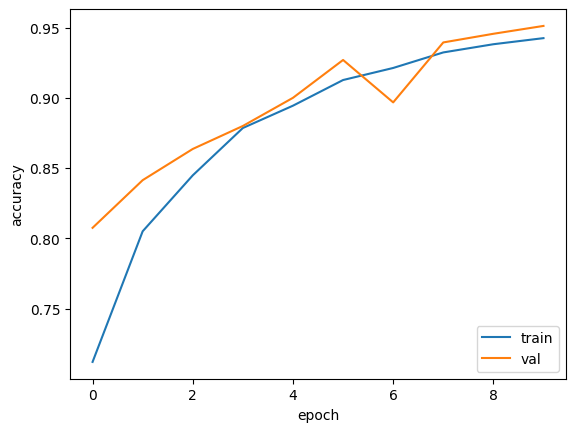

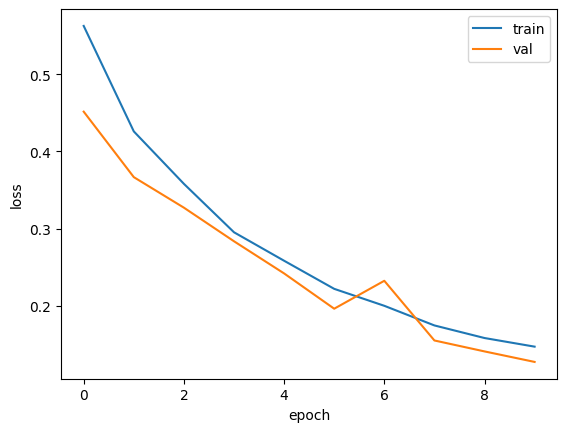


AdamW
Epoch 1/10
227/227 [==============================] - 42s 135ms/step - loss: 0.5749 - accuracy: 0.7124 - val_loss: 0.4512 - val_accuracy: 0.8061
Epoch 2/10
227/227 [==============================] - 35s 123ms/step - loss: 0.4172 - accuracy: 0.8135 - val_loss: 0.3589 - val_accuracy: 0.8474
Epoch 3/10
227/227 [==============================] - 34s 120ms/step - loss: 0.3551 - accuracy: 0.8462 - val_loss: 0.3312 - val_accuracy: 0.8592
Epoch 4/10
227/227 [==============================] - 43s 161ms/step - loss: 0.3067 - accuracy: 0.8707 - val_loss: 0.2598 - val_accuracy: 0.9000
Epoch 5/10
227/227 [==============================] - 35s 122ms/step - loss: 0.2634 - accuracy: 0.8939 - val_loss: 0.2294 - val_accuracy: 0.9098
Epoch 6/10
227/227 [==============================] - 35s 121ms/step - loss: 0.2316 - accuracy: 0.9082 - val_loss: 0.2374 - val_accuracy: 0.8957
Epoch 7/10
227/227 [==============================] - 34s 122ms/step - loss: 0.2081 - accuracy: 0.9171 - val_loss: 0.1780 -

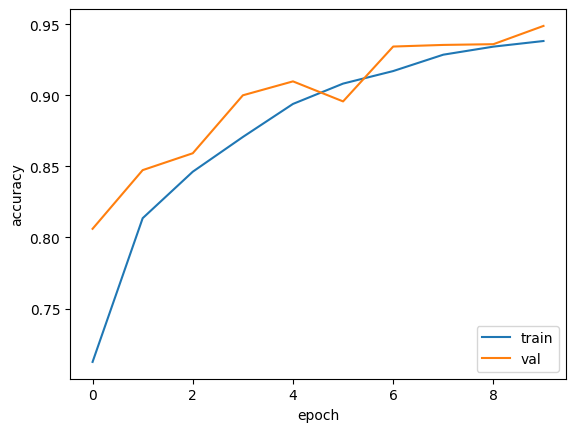

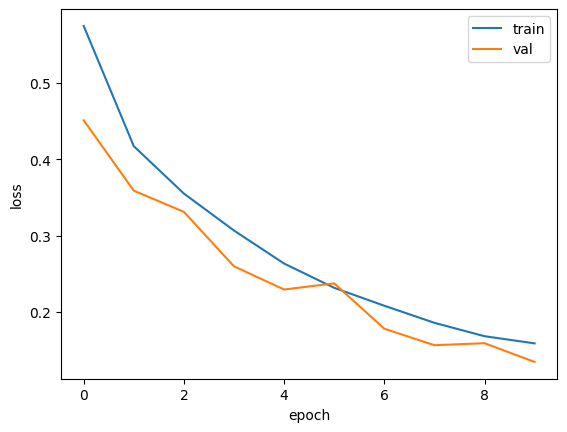

In [ ]:
#Dropout rate selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('resnet50', 'relu', 0.1)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("AdamW")
  # Compile the model
  model = get_model('resnet50', 'relu', 0.3)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


Epoch 1/10
227/227 [==============================] - 66s 180ms/step - loss: 0.5513 - accuracy: 0.7202 - val_loss: 0.4442 - val_accuracy: 0.8054
Epoch 2/10
227/227 [==============================] - 44s 141ms/step - loss: 0.4045 - accuracy: 0.8198 - val_loss: 0.3518 - val_accuracy: 0.8510
Epoch 3/10
227/227 [==============================] - 50s 167ms/step - loss: 0.3276 - accuracy: 0.8615 - val_loss: 0.3177 - val_accuracy: 0.8630
Epoch 4/10
227/227 [==============================] - 35s 122ms/step - loss: 0.2734 - accuracy: 0.8874 - val_loss: 0.2361 - val_accuracy: 0.9066
Epoch 5/10
227/227 [==============================] - 36s 121ms/step - loss: 0.2313 - accuracy: 0.9072 - val_loss: 0.1973 - val_accuracy: 0.9233
Epoch 6/10
227/227 [==============================] - 35s 123ms/step - loss: 0.1923 - accuracy: 0.9256 - val_loss: 0.1709 - val_accuracy: 0.9335
Epoch 7/10
227/227 [==============================] - 35s 119ms/step - loss: 0.1758 - accuracy: 0.9313 - val_loss: 0.1729 - val_ac

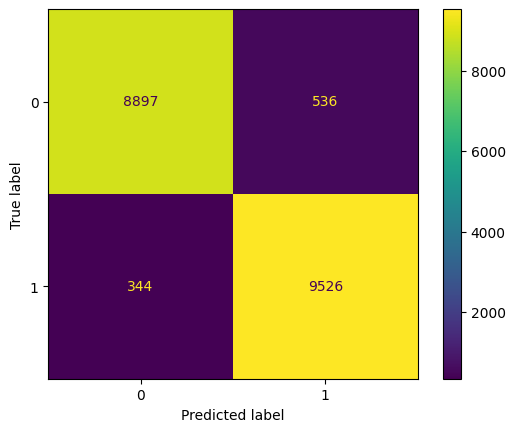


Precision:  0.9467302723116676
Recall:  0.9651469098277609
F1:  0.955849889624724
Avg acc: 0.9544
0.954411231414806 0.954411231414806 0.954411231414806 0.954411231414806 0.954411231414806 0.954411231414806 0.954411231414806
Standard error: 0.0000
126/126 [==============================] - 9s 64ms/step
[[0.04572397 0.954276  ]
 [0.16093515 0.8390647 ]
 [0.23051156 0.76948845]
 ...
 [0.8323713  0.16762865]
 [0.74740285 0.25259712]
 [0.74435276 0.2556472 ]]
32134


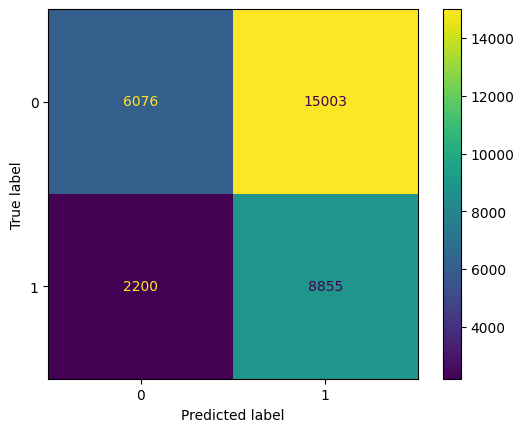


Precision:  0.37115432978455865
Recall:  0.8009950248756219
F1:  0.5072609056798328
Avg acc: 0.4646
0.4646480363477936 0.4646480363477936 0.4646480363477936 0.4646480363477936 0.4646480363477936 0.4646480363477936 0.4646480363477936
Standard error: 0.0000


In [ ]:
model = get_model('resnet50', 'relu', 0.1)
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # Make predictions on the test set
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp))

  tf.random.set_seed(42)
  np.random.seed(71516)
  y2 = np.array(model.predict(test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # test_loss, test_acc = model.evaluate(unseen_test_dataset)
  # print('Unseen Test accuracy:', test_acc)
  # print('Unseen Test loss:', test_loss)
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(unseen_test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(42)
  np.random.seed(42)
  y2 = np.array(model.predict(unseen_test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(unseen_test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(unseen_test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(unseen_test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(unseen_test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(unseen_test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp_unseen))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp_unseen
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

DenseNet

Hyperparam optim

AdamW
Epoch 1/10
227/227 [==============================] - 56s 134ms/step - loss: 0.4743 - accuracy: 0.8767 - val_loss: 0.1060 - val_accuracy: 0.9535
Epoch 2/10
227/227 [==============================] - 33s 116ms/step - loss: 0.0963 - accuracy: 0.9591 - val_loss: 0.0813 - val_accuracy: 0.9649
Epoch 3/10
227/227 [==============================] - 33s 113ms/step - loss: 0.0792 - accuracy: 0.9652 - val_loss: 0.0642 - val_accuracy: 0.9700
Epoch 4/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0693 - accuracy: 0.9681 - val_loss: 0.0633 - val_accuracy: 0.9713
Epoch 5/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0646 - accuracy: 0.9698 - val_loss: 0.0570 - val_accuracy: 0.9720
Epoch 6/10
227/227 [==============================] - 33s 114ms/step - loss: 0.0608 - accuracy: 0.9720 - val_loss: 0.0579 - val_accuracy: 0.9728
Epoch 7/10
227/227 [==============================] - 32s 114ms/step - loss: 0.0574 - accuracy: 0.9729 - val_loss: 0.0527 - 

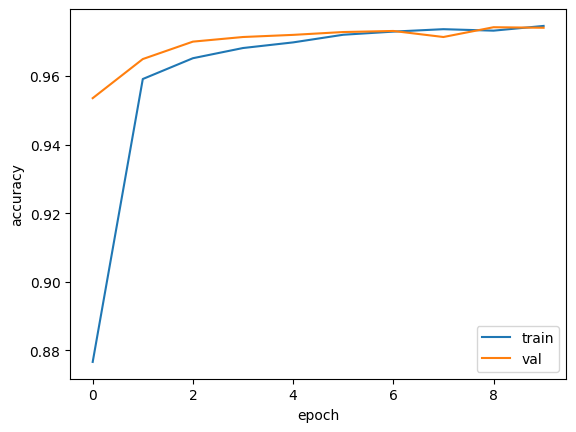

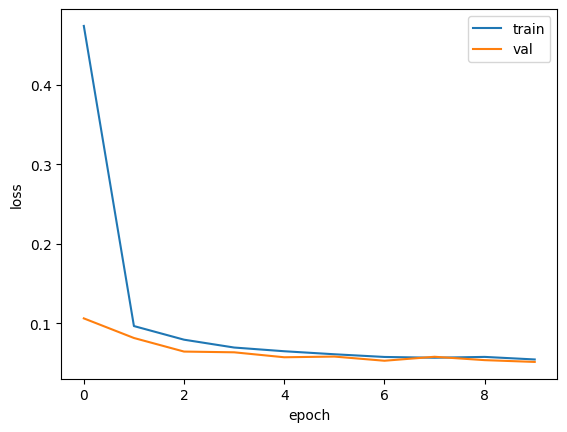


Epoch 1/10
227/227 [==============================] - 42s 124ms/step - loss: 2.7738 - accuracy: 0.5191 - val_loss: 0.6859 - val_accuracy: 0.5305
Epoch 2/10
227/227 [==============================] - 32s 113ms/step - loss: 0.6874 - accuracy: 0.5188 - val_loss: 0.6863 - val_accuracy: 0.5305
Epoch 3/10
227/227 [==============================] - 33s 117ms/step - loss: 0.6872 - accuracy: 0.5190 - val_loss: 0.6859 - val_accuracy: 0.5305
Epoch 4/10
227/227 [==============================] - 33s 113ms/step - loss: 0.6873 - accuracy: 0.5189 - val_loss: 0.6858 - val_accuracy: 0.5306
Epoch 5/10
227/227 [==============================] - 33s 117ms/step - loss: 0.6872 - accuracy: 0.5186 - val_loss: 0.6862 - val_accuracy: 0.5306
Epoch 6/10
227/227 [==============================] - 33s 114ms/step - loss: 0.6873 - accuracy: 0.5190 - val_loss: 0.6857 - val_accuracy: 0.5306
Epoch 7/10
227/227 [==============================] - 33s 117ms/step - loss: 0.6873 - accuracy: 0.5190 - val_loss: 0.6862 - val_a

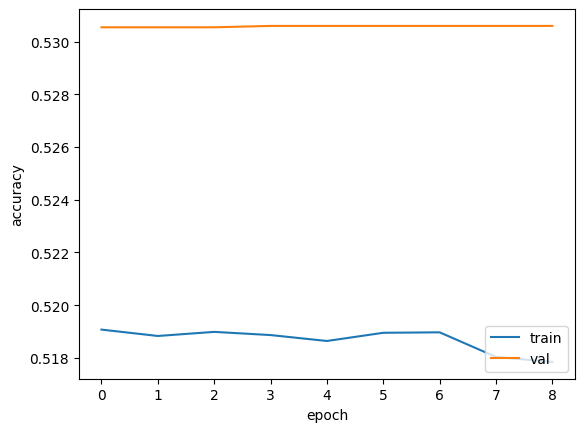

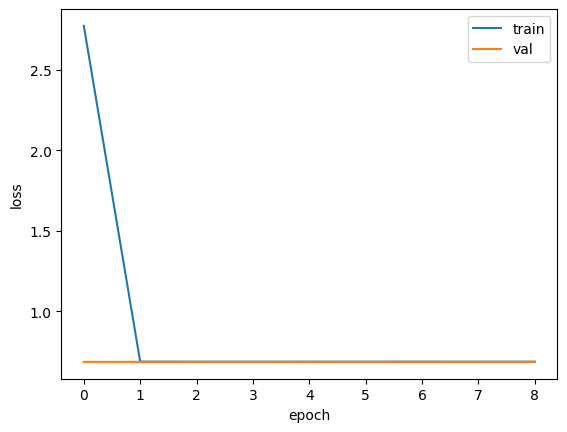


Epoch 1/10
227/227 [==============================] - 42s 125ms/step - loss: 0.3298 - accuracy: 0.8782 - val_loss: 0.1152 - val_accuracy: 0.9588
Epoch 2/10
227/227 [==============================] - 33s 117ms/step - loss: 0.1056 - accuracy: 0.9595 - val_loss: 0.0765 - val_accuracy: 0.9680
Epoch 3/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0828 - accuracy: 0.9672 - val_loss: 0.0680 - val_accuracy: 0.9692
Epoch 4/10
227/227 [==============================] - 33s 116ms/step - loss: 0.0690 - accuracy: 0.9717 - val_loss: 0.0614 - val_accuracy: 0.9739
Epoch 5/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0607 - accuracy: 0.9747 - val_loss: 0.0551 - val_accuracy: 0.9762
Epoch 6/10
227/227 [==============================] - 33s 114ms/step - loss: 0.0548 - accuracy: 0.9770 - val_loss: 0.0575 - val_accuracy: 0.9741
Epoch 7/10
227/227 [==============================] - 33s 117ms/step - loss: 0.0496 - accuracy: 0.9789 - val_loss: 0.0535 - val_a

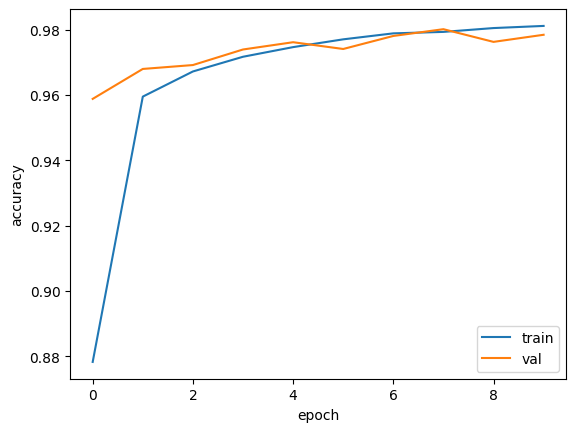

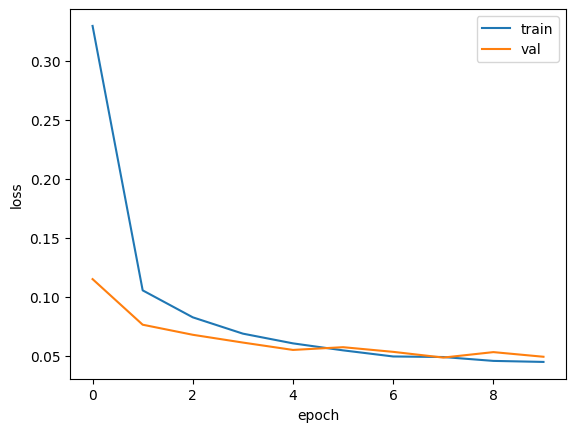


Adam
Epoch 1/10
227/227 [==============================] - 42s 124ms/step - loss: 0.2740 - accuracy: 0.9184 - val_loss: 0.0808 - val_accuracy: 0.9660
Epoch 2/10
227/227 [==============================] - 33s 116ms/step - loss: 0.0804 - accuracy: 0.9659 - val_loss: 0.0773 - val_accuracy: 0.9674
Epoch 3/10
227/227 [==============================] - 32s 113ms/step - loss: 0.0690 - accuracy: 0.9696 - val_loss: 0.0672 - val_accuracy: 0.9704
Epoch 4/10
227/227 [==============================] - 33s 114ms/step - loss: 0.0634 - accuracy: 0.9718 - val_loss: 0.0607 - val_accuracy: 0.9714
Epoch 5/10
227/227 [==============================] - 33s 117ms/step - loss: 0.0593 - accuracy: 0.9733 - val_loss: 0.0655 - val_accuracy: 0.9687
Epoch 6/10
227/227 [==============================] - 32s 114ms/step - loss: 0.0588 - accuracy: 0.9730 - val_loss: 0.0619 - val_accuracy: 0.9732
Epoch 7/10
227/227 [==============================] - 34s 119ms/step - loss: 0.0576 - accuracy: 0.9735 - val_loss: 0.0572 - 

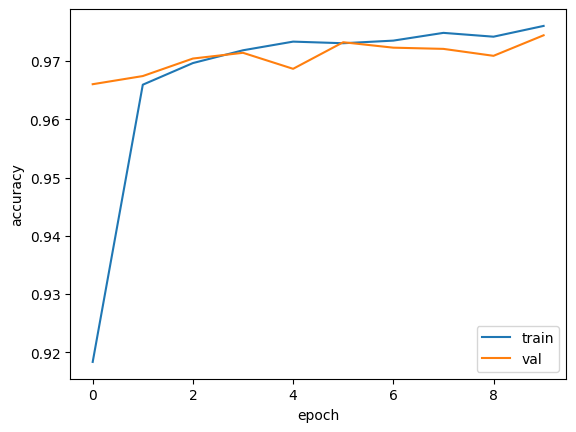

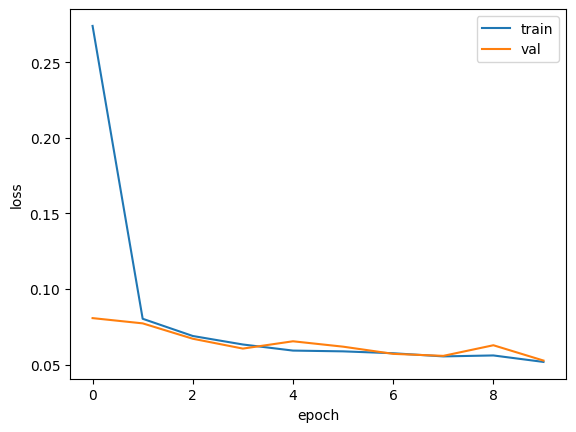


Adam
Epoch 1/10
227/227 [==============================] - 43s 127ms/step - loss: 1.7647 - accuracy: 0.7893 - val_loss: 0.1807 - val_accuracy: 0.9075
Epoch 2/10
227/227 [==============================] - 33s 114ms/step - loss: 0.1963 - accuracy: 0.8948 - val_loss: 0.1218 - val_accuracy: 0.9483
Epoch 3/10
227/227 [==============================] - 33s 117ms/step - loss: 0.1472 - accuracy: 0.9277 - val_loss: 0.0998 - val_accuracy: 0.9554
Epoch 4/10
227/227 [==============================] - 33s 115ms/step - loss: 0.1252 - accuracy: 0.9371 - val_loss: 0.0918 - val_accuracy: 0.9561
Epoch 5/10
227/227 [==============================] - 33s 118ms/step - loss: 0.1185 - accuracy: 0.9397 - val_loss: 0.0878 - val_accuracy: 0.9563
Epoch 6/10
227/227 [==============================] - 33s 115ms/step - loss: 0.1112 - accuracy: 0.9433 - val_loss: 0.0872 - val_accuracy: 0.9601
Epoch 7/10
227/227 [==============================] - 33s 118ms/step - loss: 0.1283 - accuracy: 0.9303 - val_loss: 0.0758 - 

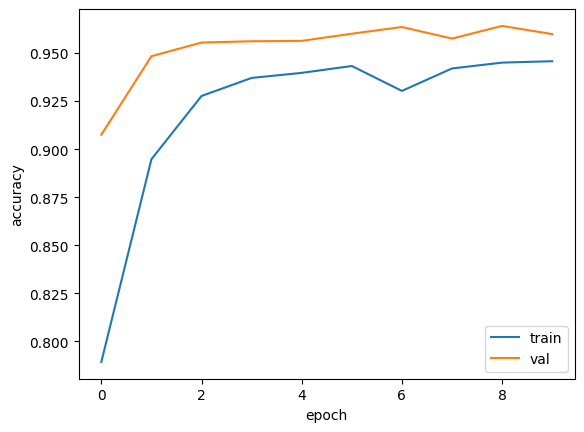

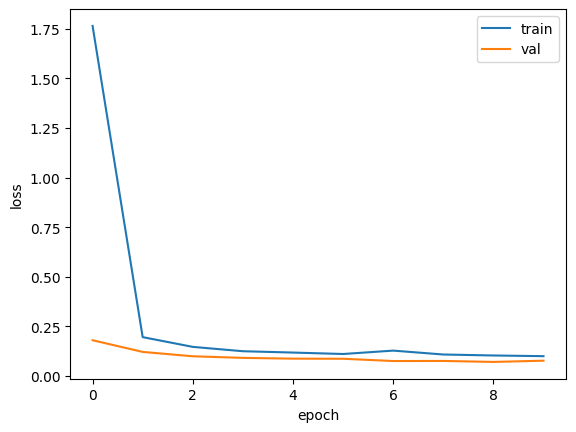


Adam
Epoch 1/10
227/227 [==============================] - 42s 125ms/step - loss: 0.3262 - accuracy: 0.8760 - val_loss: 0.1055 - val_accuracy: 0.9612
Epoch 2/10
227/227 [==============================] - 33s 115ms/step - loss: 0.1071 - accuracy: 0.9582 - val_loss: 0.0814 - val_accuracy: 0.9679
Epoch 3/10
227/227 [==============================] - 33s 116ms/step - loss: 0.0808 - accuracy: 0.9668 - val_loss: 0.0672 - val_accuracy: 0.9710
Epoch 4/10
227/227 [==============================] - 34s 117ms/step - loss: 0.0706 - accuracy: 0.9712 - val_loss: 0.0635 - val_accuracy: 0.9726
Epoch 5/10
227/227 [==============================] - 32s 115ms/step - loss: 0.0611 - accuracy: 0.9748 - val_loss: 0.0578 - val_accuracy: 0.9737
Epoch 6/10
227/227 [==============================] - 33s 116ms/step - loss: 0.0547 - accuracy: 0.9767 - val_loss: 0.0567 - val_accuracy: 0.9735
Epoch 7/10
227/227 [==============================] - 33s 117ms/step - loss: 0.0522 - accuracy: 0.9779 - val_loss: 0.0519 - 

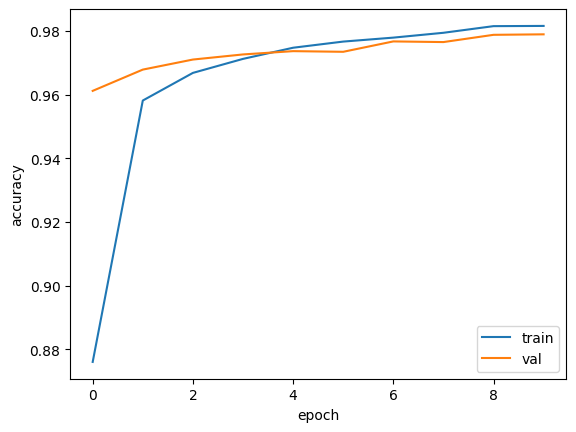

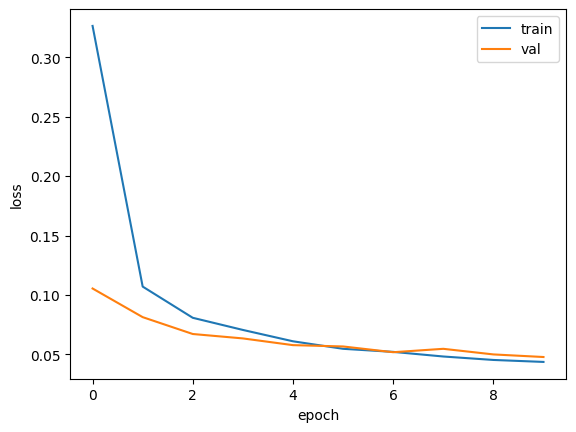


RMSprop
Epoch 1/10
227/227 [==============================] - 42s 126ms/step - loss: 0.7526 - accuracy: 0.8708 - val_loss: 0.1116 - val_accuracy: 0.9588
Epoch 2/10
227/227 [==============================] - 33s 116ms/step - loss: 0.1051 - accuracy: 0.9577 - val_loss: 0.1142 - val_accuracy: 0.9617
Epoch 3/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0805 - accuracy: 0.9651 - val_loss: 0.0714 - val_accuracy: 0.9694
Epoch 4/10
227/227 [==============================] - 33s 118ms/step - loss: 0.0715 - accuracy: 0.9685 - val_loss: 0.0675 - val_accuracy: 0.9677
Epoch 5/10
227/227 [==============================] - 33s 116ms/step - loss: 0.0662 - accuracy: 0.9699 - val_loss: 0.0702 - val_accuracy: 0.9701
Epoch 6/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0640 - accuracy: 0.9718 - val_loss: 0.0684 - val_accuracy: 0.9690
Epoch 7/10
227/227 [==============================] - 33s 119ms/step - loss: 0.0583 - accuracy: 0.9734 - val_loss: 0.0708

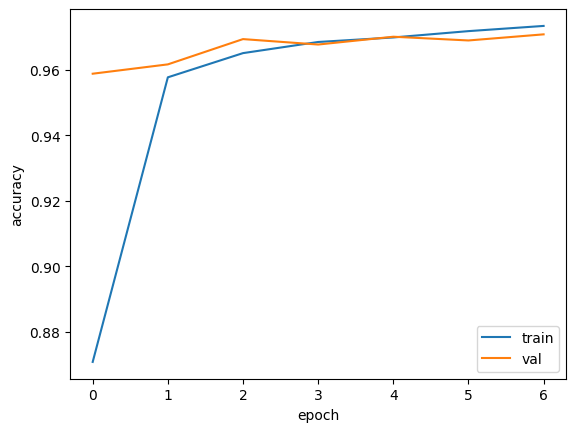

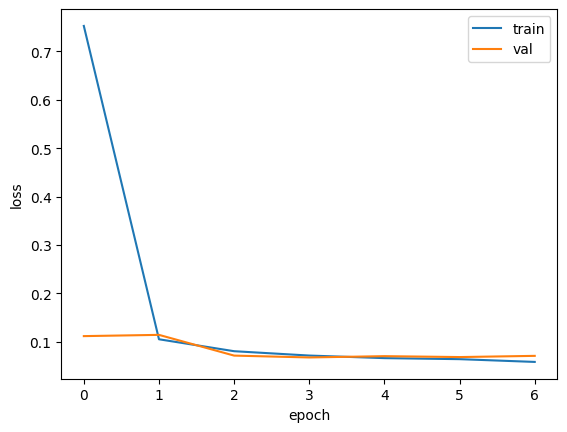


RMSprop
Epoch 1/10
227/227 [==============================] - 43s 125ms/step - loss: 8.6470 - accuracy: 0.6473 - val_loss: 0.3997 - val_accuracy: 0.7717
Epoch 2/10
227/227 [==============================] - 33s 116ms/step - loss: 0.4095 - accuracy: 0.7817 - val_loss: 0.2741 - val_accuracy: 0.8858
Epoch 3/10
227/227 [==============================] - 33s 116ms/step - loss: 0.3054 - accuracy: 0.8560 - val_loss: 0.2327 - val_accuracy: 0.8992
Epoch 4/10
227/227 [==============================] - 34s 118ms/step - loss: 0.2709 - accuracy: 0.8790 - val_loss: 0.1628 - val_accuracy: 0.9418
Epoch 5/10
227/227 [==============================] - 33s 116ms/step - loss: 0.2497 - accuracy: 0.8942 - val_loss: 0.1769 - val_accuracy: 0.9268
Epoch 6/10
227/227 [==============================] - 33s 117ms/step - loss: 0.2413 - accuracy: 0.8992 - val_loss: 0.1441 - val_accuracy: 0.9477
Epoch 7/10
227/227 [==============================] - 34s 116ms/step - loss: 0.2274 - accuracy: 0.9065 - val_loss: 0.1695

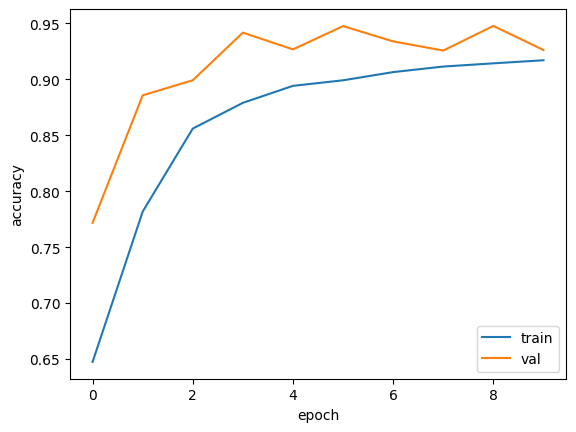

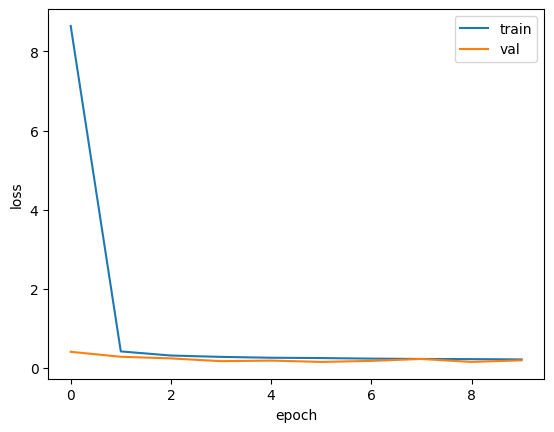


RMSprop
Epoch 1/10
227/227 [==============================] - 51s 129ms/step - loss: 0.4985 - accuracy: 0.8332 - val_loss: 0.1790 - val_accuracy: 0.9281
Epoch 2/10
227/227 [==============================] - 33s 117ms/step - loss: 0.1223 - accuracy: 0.9527 - val_loss: 0.0942 - val_accuracy: 0.9635
Epoch 3/10
227/227 [==============================] - 34s 118ms/step - loss: 0.0822 - accuracy: 0.9660 - val_loss: 0.0736 - val_accuracy: 0.9672
Epoch 4/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0655 - accuracy: 0.9718 - val_loss: 0.0782 - val_accuracy: 0.9671
Epoch 5/10
227/227 [==============================] - 33s 118ms/step - loss: 0.0590 - accuracy: 0.9751 - val_loss: 0.0647 - val_accuracy: 0.9710
Epoch 6/10
227/227 [==============================] - 34s 118ms/step - loss: 0.0530 - accuracy: 0.9767 - val_loss: 0.0633 - val_accuracy: 0.9734
Epoch 7/10
227/227 [==============================] - 33s 118ms/step - loss: 0.0494 - accuracy: 0.9781 - val_loss: 0.0530

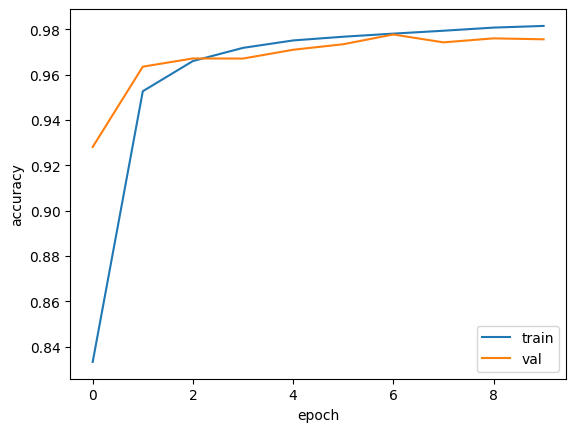

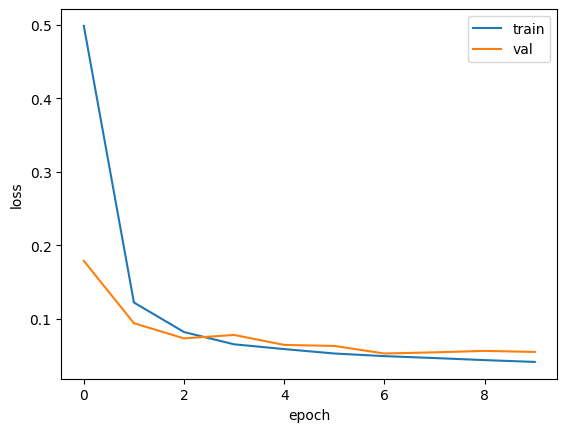


SGD
Epoch 1/10
227/227 [==============================] - 43s 126ms/step - loss: 0.3687 - accuracy: 0.8911 - val_loss: 0.1614 - val_accuracy: 0.9439
Epoch 2/10
227/227 [==============================] - 33s 115ms/step - loss: 0.1292 - accuracy: 0.9536 - val_loss: 0.1083 - val_accuracy: 0.9609
Epoch 3/10
227/227 [==============================] - 38s 136ms/step - loss: 0.1001 - accuracy: 0.9629 - val_loss: 0.0885 - val_accuracy: 0.9655
Epoch 4/10
227/227 [==============================] - 41s 122ms/step - loss: 0.0860 - accuracy: 0.9662 - val_loss: 0.0760 - val_accuracy: 0.9690
Epoch 5/10
227/227 [==============================] - 39s 142ms/step - loss: 0.0776 - accuracy: 0.9693 - val_loss: 0.0724 - val_accuracy: 0.9706
Epoch 6/10
227/227 [==============================] - 45s 139ms/step - loss: 0.0702 - accuracy: 0.9713 - val_loss: 0.0809 - val_accuracy: 0.9638
Epoch 7/10
227/227 [==============================] - 37s 119ms/step - loss: 0.0660 - accuracy: 0.9738 - val_loss: 0.0666 - v

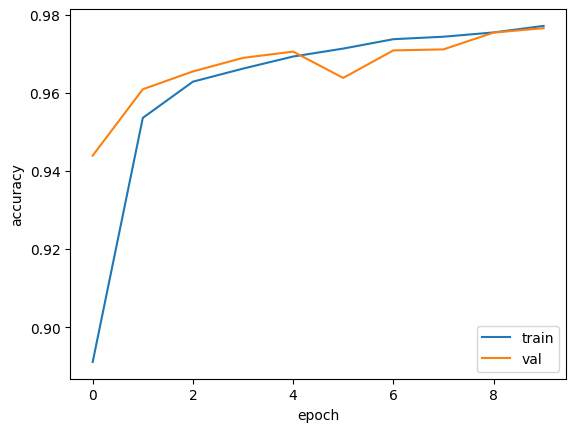

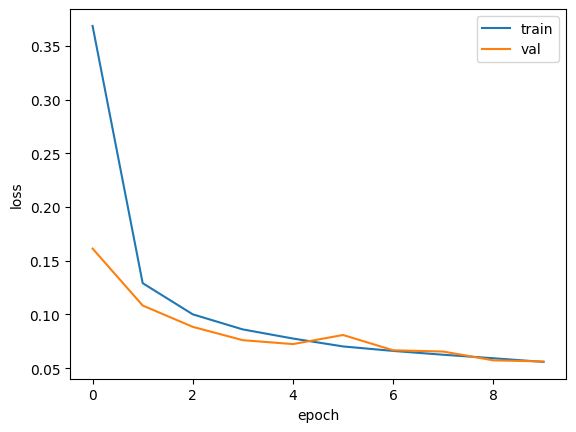


SGD
Epoch 1/10
227/227 [==============================] - 44s 127ms/step - loss: 0.6348 - accuracy: 0.7316 - val_loss: 0.3477 - val_accuracy: 0.8552
Epoch 2/10
227/227 [==============================] - 36s 124ms/step - loss: 0.3375 - accuracy: 0.8568 - val_loss: 0.2190 - val_accuracy: 0.9211
Epoch 3/10
227/227 [==============================] - 43s 146ms/step - loss: 0.2572 - accuracy: 0.8962 - val_loss: 0.1831 - val_accuracy: 0.9353
Epoch 4/10
227/227 [==============================] - 43s 148ms/step - loss: 0.2190 - accuracy: 0.9149 - val_loss: 0.1630 - val_accuracy: 0.9436
Epoch 5/10
227/227 [==============================] - 46s 148ms/step - loss: 0.1932 - accuracy: 0.9263 - val_loss: 0.1484 - val_accuracy: 0.9490
Epoch 6/10
227/227 [==============================] - 44s 139ms/step - loss: 0.1781 - accuracy: 0.9316 - val_loss: 0.1369 - val_accuracy: 0.9518
Epoch 7/10
227/227 [==============================] - 41s 132ms/step - loss: 0.1630 - accuracy: 0.9386 - val_loss: 0.1317 - v

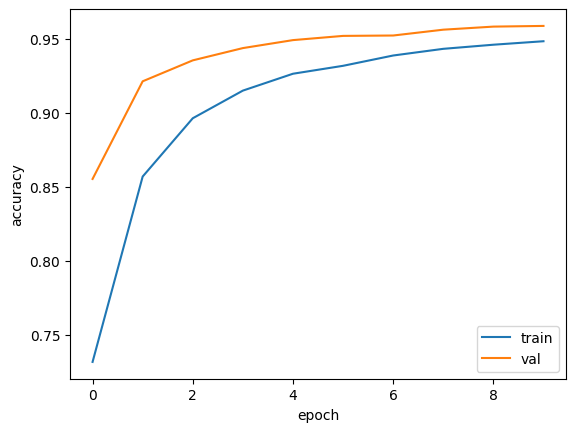

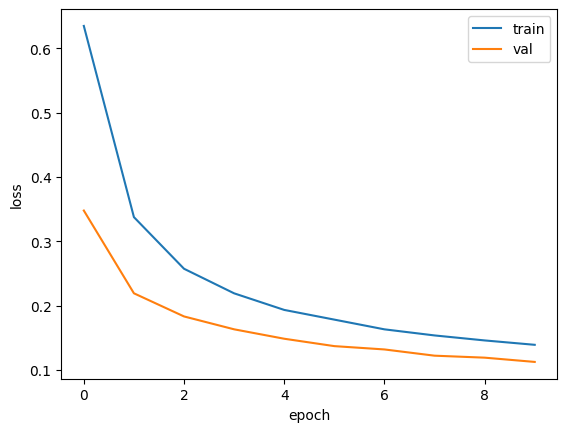


SGD
Epoch 1/10
227/227 [==============================] - 49s 133ms/step - loss: 1.4843 - accuracy: 0.6413 - val_loss: 0.8463 - val_accuracy: 0.5993
Epoch 2/10
227/227 [==============================] - 39s 120ms/step - loss: 0.6321 - accuracy: 0.6209 - val_loss: 0.6883 - val_accuracy: 0.5273
Epoch 3/10
227/227 [==============================] - 35s 118ms/step - loss: 0.5902 - accuracy: 0.6457 - val_loss: 0.4522 - val_accuracy: 0.7612
Epoch 4/10
227/227 [==============================] - 36s 119ms/step - loss: 0.6357 - accuracy: 0.5835 - val_loss: 0.6530 - val_accuracy: 0.5939
Epoch 5/10
227/227 [==============================] - 34s 118ms/step - loss: 0.6491 - accuracy: 0.5685 - val_loss: 0.6878 - val_accuracy: 0.4872
Epoch 6/10
227/227 [==============================] - 47s 166ms/step - loss: 0.6856 - accuracy: 0.5217 - val_loss: 0.6927 - val_accuracy: 0.5219


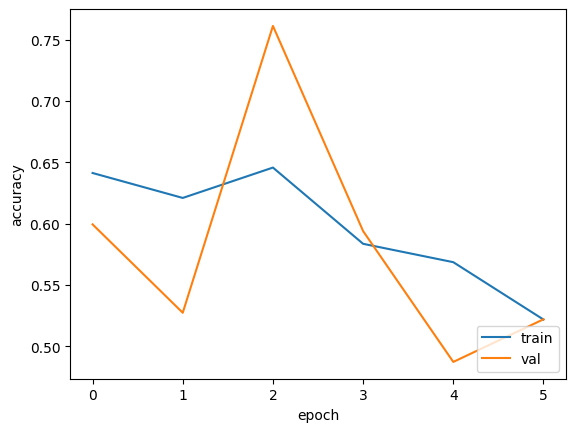

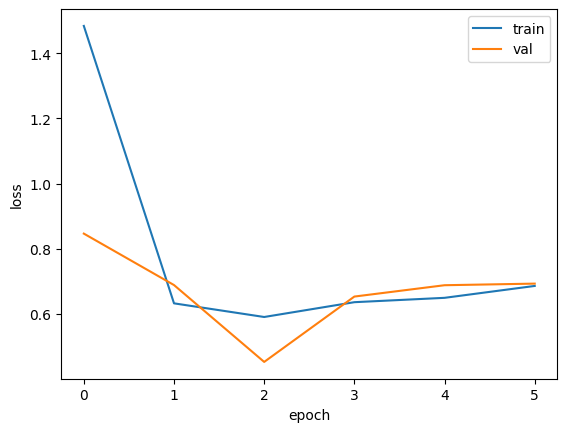

In [ ]:
#Optimizer selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()




  print("Adam")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()






  print("RMSprop")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("RMSprop")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("RMSprop")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()





  print("SGD")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('densenet', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.1), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
29084464/29084464 [==============================] - 0s 0us/step
Epoch 1/10
227/227 [==============================] - 63s 151ms/step - loss: 0.2429 - accuracy: 0.9004 - val_loss: 0.1072 - val_accuracy: 0.9622
Epoch 2/10
227/227 [==============================] - 45s 160ms/step - loss: 0.0992 - accuracy: 0.9624 - val_loss: 0.0796 - val_accuracy: 0.9686
Epoch 3/10
227/227 [==============================] - 37s 123ms/step - loss: 0.0777 - accuracy: 0.9686 - val_loss: 0.0669 - val_accuracy: 0.9713
Epoch 4/10
227/227 [==============================] - 37s 129ms/step - loss: 0.0674 - accuracy: 0.9728 - val_loss: 0.0616 - val_accuracy: 0.9744
Epoch 5/10
227/227 [==============================] - 37s 121ms/step - loss: 0.0601 - accuracy: 0.9752 - val_loss: 0.0594 - val_accuracy: 0.9740
Epoch 6/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0555 - accuracy: 0.9776 - val_loss: 0.0569 - val_accuracy: 0.9756
Epoch 7/10
227/227 [==============================] - 33s 1

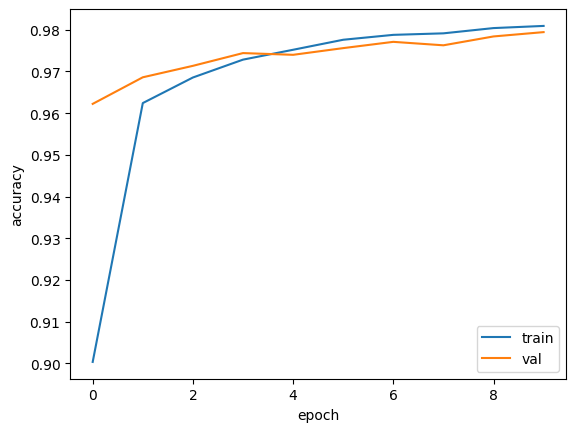

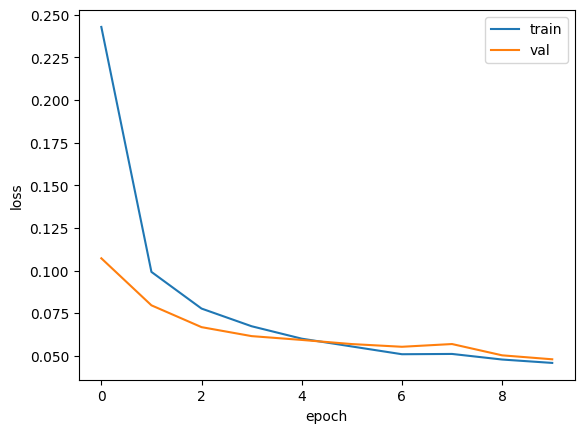


AdamW
Epoch 1/10
227/227 [==============================] - 43s 125ms/step - loss: 0.2910 - accuracy: 0.8836 - val_loss: 0.1582 - val_accuracy: 0.9486
Epoch 2/10
227/227 [==============================] - 33s 115ms/step - loss: 0.1416 - accuracy: 0.9509 - val_loss: 0.1129 - val_accuracy: 0.9601
Epoch 3/10
227/227 [==============================] - 33s 116ms/step - loss: 0.1077 - accuracy: 0.9614 - val_loss: 0.0925 - val_accuracy: 0.9658
Epoch 4/10
227/227 [==============================] - 34s 117ms/step - loss: 0.0791 - accuracy: 0.9698 - val_loss: 0.0738 - val_accuracy: 0.9710
Epoch 6/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0723 - accuracy: 0.9712 - val_loss: 0.0675 - val_accuracy: 0.9722
Epoch 7/10
227/227 [==============================] - 33s 116ms/step - loss: 0.0681 - accuracy: 0.9722 - val_loss: 0.0647 - val_accuracy: 0.9730
Epoch 8/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0634 - accuracy: 0.9739 - val_loss: 0.0641 -

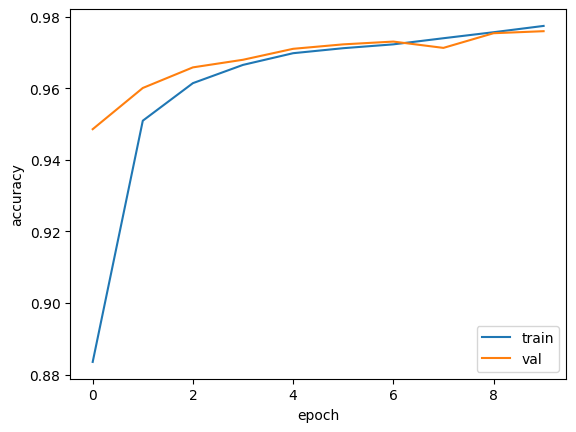

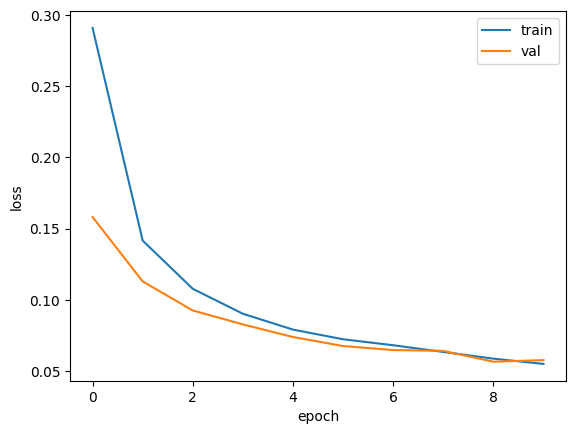


AdamW
Epoch 1/10
227/227 [==============================] - 43s 127ms/step - loss: 0.3000 - accuracy: 0.8846 - val_loss: 0.1027 - val_accuracy: 0.9611
Epoch 2/10
227/227 [==============================] - 34s 120ms/step - loss: 0.1012 - accuracy: 0.9615 - val_loss: 0.0748 - val_accuracy: 0.9686
Epoch 3/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0768 - accuracy: 0.9689 - val_loss: 0.0678 - val_accuracy: 0.9718
Epoch 4/10
227/227 [==============================] - 34s 117ms/step - loss: 0.0644 - accuracy: 0.9737 - val_loss: 0.0589 - val_accuracy: 0.9747
Epoch 5/10
227/227 [==============================] - 33s 118ms/step - loss: 0.0564 - accuracy: 0.9767 - val_loss: 0.0647 - val_accuracy: 0.9735
Epoch 6/10
227/227 [==============================] - 34s 117ms/step - loss: 0.0523 - accuracy: 0.9781 - val_loss: 0.0570 - val_accuracy: 0.9732
Epoch 7/10
227/227 [==============================] - 33s 117ms/step - loss: 0.0459 - accuracy: 0.9801 - val_loss: 0.0504 -

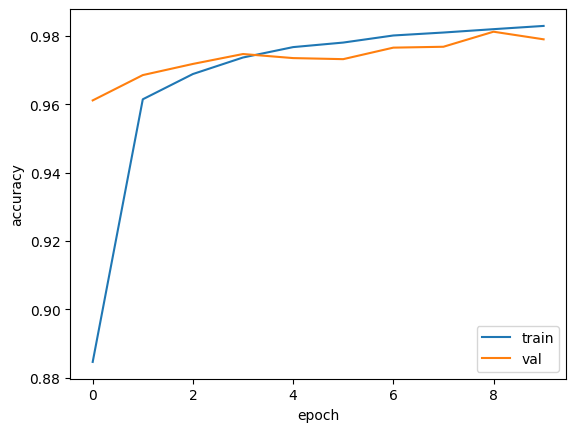

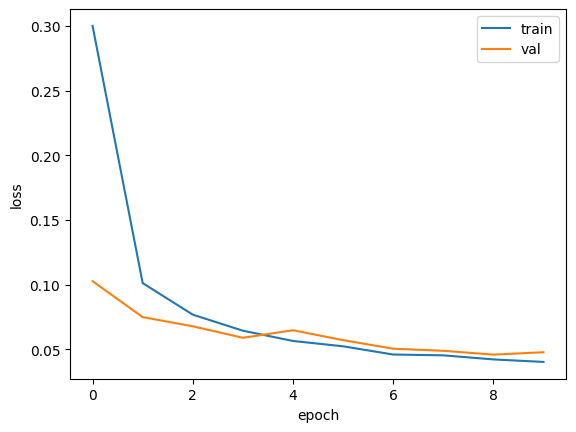

In [ ]:
#Activation function selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('densenet', 'tanh', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('densenet', 'sigmoid', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('densenet', 'gelu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

AdamW
Epoch 1/10
227/227 [==============================] - 51s 138ms/step - loss: 0.2893 - accuracy: 0.8883 - val_loss: 0.1091 - val_accuracy: 0.9571
Epoch 2/10
227/227 [==============================] - 37s 125ms/step - loss: 0.0997 - accuracy: 0.9611 - val_loss: 0.0807 - val_accuracy: 0.9668
Epoch 3/10
227/227 [==============================] - 37s 130ms/step - loss: 0.0783 - accuracy: 0.9688 - val_loss: 0.0702 - val_accuracy: 0.9687
Epoch 4/10
227/227 [==============================] - 34s 120ms/step - loss: 0.0645 - accuracy: 0.9727 - val_loss: 0.0635 - val_accuracy: 0.9739
Epoch 5/10
227/227 [==============================] - 33s 116ms/step - loss: 0.0584 - accuracy: 0.9751 - val_loss: 0.0696 - val_accuracy: 0.9691
Epoch 6/10
227/227 [==============================] - 34s 119ms/step - loss: 0.0539 - accuracy: 0.9770 - val_loss: 0.0545 - val_accuracy: 0.9758
Epoch 7/10
227/227 [==============================] - 34s 116ms/step - loss: 0.0535 - accuracy: 0.9778 - val_loss: 0.0511 - 

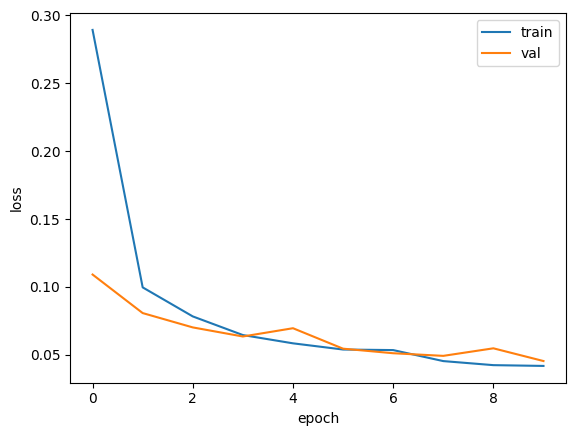


AdamW
Epoch 1/10
227/227 [==============================] - 45s 126ms/step - loss: 0.3461 - accuracy: 0.8744 - val_loss: 0.1016 - val_accuracy: 0.9594
Epoch 2/10
227/227 [==============================] - 34s 118ms/step - loss: 0.1113 - accuracy: 0.9567 - val_loss: 0.0819 - val_accuracy: 0.9661
Epoch 3/10
227/227 [==============================] - 34s 117ms/step - loss: 0.0696 - accuracy: 0.9703 - val_loss: 0.0604 - val_accuracy: 0.9738
Epoch 5/10
227/227 [==============================] - 34s 116ms/step - loss: 0.0624 - accuracy: 0.9736 - val_loss: 0.0565 - val_accuracy: 0.9764
Epoch 6/10
227/227 [==============================] - 33s 114ms/step - loss: 0.0581 - accuracy: 0.9756 - val_loss: 0.0561 - val_accuracy: 0.9752
Epoch 7/10
227/227 [==============================] - 33s 115ms/step - loss: 0.0540 - accuracy: 0.9770 - val_loss: 0.0508 - val_accuracy: 0.9759
Epoch 8/10
227/227 [==============================] - 34s 115ms/step - loss: 0.0505 - accuracy: 0.9780 - val_loss: 0.0521 -

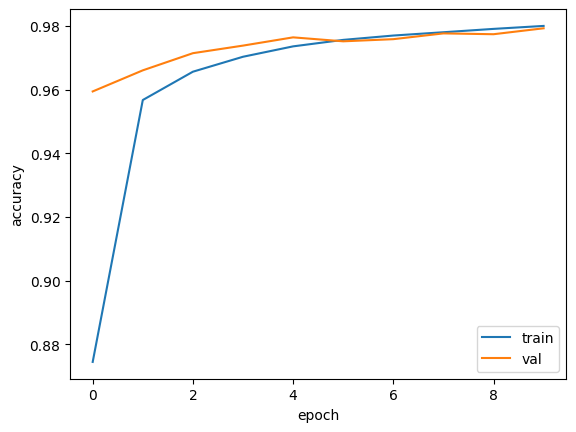

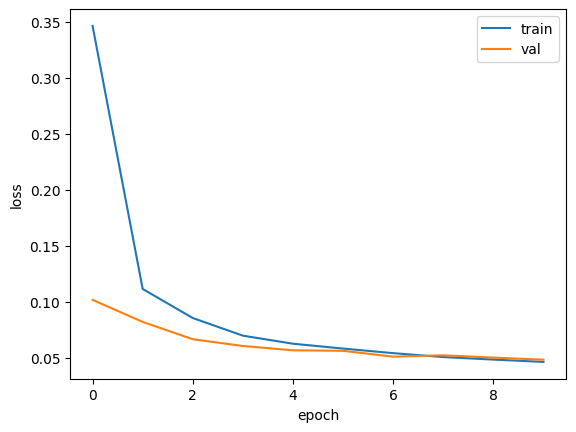

In [ ]:
#Dropout rate selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('densenet', 'relu', 0.1)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("AdamW")
  # Compile the model
  model = get_model('densenet', 'relu', 0.3)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


Epoch 1/10
227/227 [==============================] - 53s 149ms/step - loss: 0.3349 - accuracy: 0.8781 - val_loss: 0.1127 - val_accuracy: 0.9577
Epoch 2/10
227/227 [==============================] - 33s 118ms/step - loss: 0.1067 - accuracy: 0.9589 - val_loss: 0.0814 - val_accuracy: 0.9674
Epoch 3/10
227/227 [==============================] - 35s 119ms/step - loss: 0.0804 - accuracy: 0.9678 - val_loss: 0.0773 - val_accuracy: 0.9710
Epoch 4/10
227/227 [==============================] - 34s 119ms/step - loss: 0.0696 - accuracy: 0.9705 - val_loss: 0.0687 - val_accuracy: 0.9687
Epoch 5/10
227/227 [==============================] - 33s 118ms/step - loss: 0.0610 - accuracy: 0.9747 - val_loss: 0.0573 - val_accuracy: 0.9751
Epoch 6/10
227/227 [==============================] - 33s 119ms/step - loss: 0.0549 - accuracy: 0.9774 - val_loss: 0.0536 - val_accuracy: 0.9767
Epoch 7/10
227/227 [==============================] - 34s 119ms/step - loss: 0.0512 - accuracy: 0.9783 - val_loss: 0.0553 - val_ac

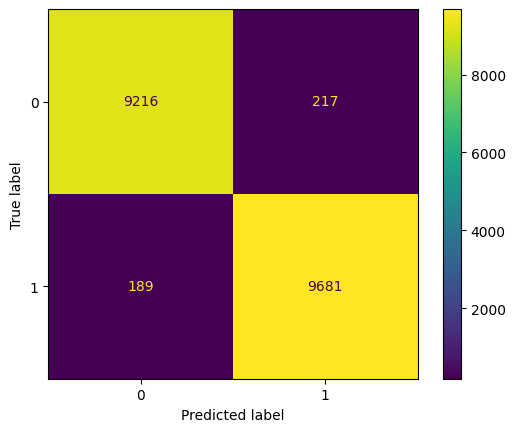


Precision:  0.978076379066478
Recall:  0.9808510638297873
F1:  0.9794617563739376
Avg acc: 0.9790
0.9789669999481946 0.9789669999481946 0.9789669999481946 0.9789669999481946 0.9789669999481946 0.9789669999481946 0.9789669999481946
Standard error: 0.0000
126/126 [==============================] - 9s 61ms/step
[[1.0630788e-03 9.9893701e-01]
 [1.8961204e-03 9.9810398e-01]
 [1.0826410e-02 9.8917347e-01]
 ...
 [9.9910122e-01 8.9869933e-04]
 [9.9609435e-01 3.9056246e-03]
 [9.9445915e-01 5.5407980e-03]]
32134


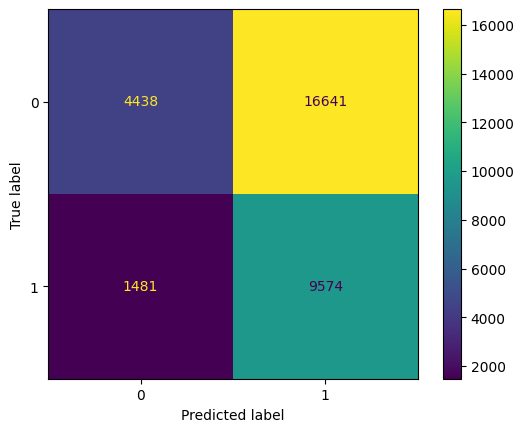


Precision:  0.3652107572000763
Recall:  0.8660334690185436
F1:  0.51376442178696
Avg acc: 0.4360
0.43604904462563016 0.43604904462563016 0.43604904462563016 0.43604904462563016 0.43604904462563016 0.43604904462563016 0.43604904462563016
Standard error: 0.0000


In [ ]:
model = get_model('densenet', 'relu', 0.1)
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # Make predictions on the test set
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp))

  tf.random.set_seed(42)
  np.random.seed(71516)
  y2 = np.array(model.predict(test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # test_loss, test_acc = model.evaluate(unseen_test_dataset)
  # print('Unseen Test accuracy:', test_acc)
  # print('Unseen Test loss:', test_loss)
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(unseen_test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(42)
  np.random.seed(42)
  y2 = np.array(model.predict(unseen_test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(unseen_test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(unseen_test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(unseen_test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(unseen_test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(unseen_test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp_unseen))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp_unseen
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

Have a simple CNN model, train it on this from scratch.

Argue why transfer learning is beneficial,  show how simple CNN works when trained on this specific ds. Compare and contrast.

Note that the Dropout layer only applies when training is set to True such that no values are dropped during inference. When using model.fit, training will be appropriately set to True automatically, and in other contexts, you can set the kwarg explicitly to True when calling the layer.

In [ ]:
import tensorflow_datasets as tfds

temp = tfds.list_builders()
#Apparently there's no deepfake datasets on tensorflow or huggingface, haven't checked pytorch too much but google search only revealed github links to download datasets(videos)
#There's a few datasets(frames, not videos, which is better for us) on Kaggle but we can't use that and compare it to a research paper
#So, we'll go with celeb-df 2.0 for testing -> unseen data, as confirmed by the TA

In [ ]:
for a in temp:
  if 'celeb' in a: print(a)

celeb_a
celeb_a_hq
voxceleb


Random SimpleCNN baseline

Hyperparam optim

AdamW
Epoch 1/10
227/227 [==============================] - 38s 90ms/step - loss: 0.6508 - accuracy: 0.6193 - val_loss: 0.6199 - val_accuracy: 0.6614
Epoch 2/10
227/227 [==============================] - 19s 53ms/step - loss: 0.6139 - accuracy: 0.6571 - val_loss: 0.5924 - val_accuracy: 0.6834
Epoch 3/10
227/227 [==============================] - 20s 55ms/step - loss: 0.5941 - accuracy: 0.6787 - val_loss: 0.5731 - val_accuracy: 0.7193
Epoch 4/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5827 - accuracy: 0.6922 - val_loss: 0.5587 - val_accuracy: 0.7308
Epoch 5/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5710 - accuracy: 0.7022 - val_loss: 0.5466 - val_accuracy: 0.7389
Epoch 6/10
227/227 [==============================] - 20s 54ms/step - loss: 0.5638 - accuracy: 0.7101 - val_loss: 0.5368 - val_accuracy: 0.7537
Epoch 7/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5559 - accuracy: 0.7169 - val_loss: 0.5286 - val_acc

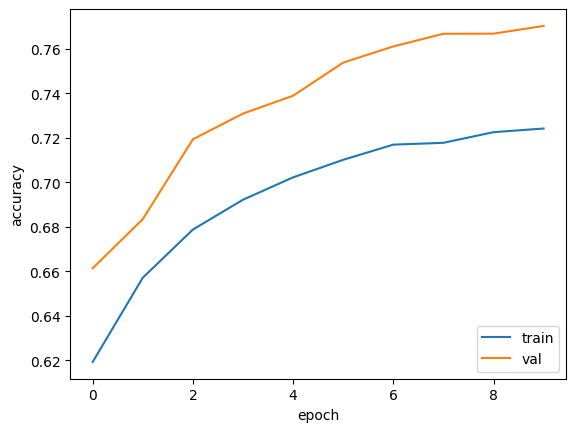

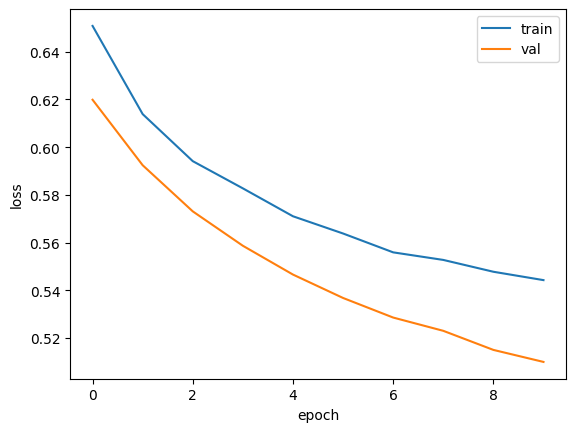


Epoch 1/10
227/227 [==============================] - 21s 55ms/step - loss: 0.5745 - accuracy: 0.7014 - val_loss: 0.4908 - val_accuracy: 0.8098
Epoch 2/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5132 - accuracy: 0.7488 - val_loss: 0.4506 - val_accuracy: 0.8289
Epoch 3/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5012 - accuracy: 0.7529 - val_loss: 0.4319 - val_accuracy: 0.8461
Epoch 4/10
227/227 [==============================] - 19s 53ms/step - loss: 0.4981 - accuracy: 0.7577 - val_loss: 0.4222 - val_accuracy: 0.8404
Epoch 5/10
227/227 [==============================] - 19s 54ms/step - loss: 0.4959 - accuracy: 0.7597 - val_loss: 0.4164 - val_accuracy: 0.8398
Epoch 6/10
227/227 [==============================] - 19s 54ms/step - loss: 0.4948 - accuracy: 0.7569 - val_loss: 0.4137 - val_accuracy: 0.8476
Epoch 7/10
227/227 [==============================] - 19s 54ms/step - loss: 0.4963 - accuracy: 0.7580 - val_loss: 0.4126 - val_accuracy

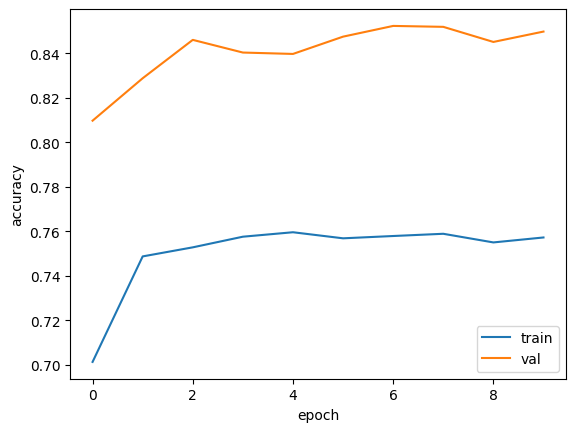

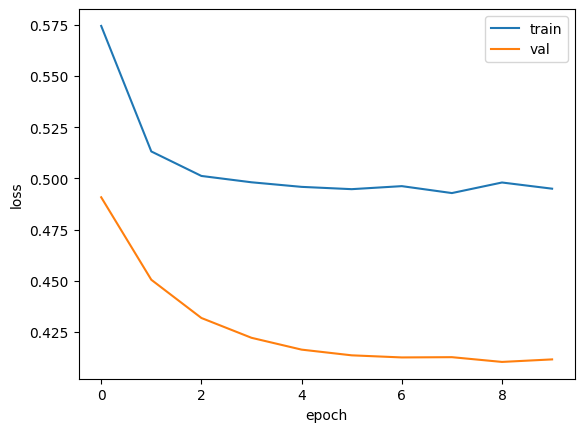


Epoch 1/10
227/227 [==============================] - 20s 56ms/step - loss: 0.6862 - accuracy: 0.5525 - val_loss: 0.6771 - val_accuracy: 0.6412
Epoch 2/10
227/227 [==============================] - 19s 53ms/step - loss: 0.6729 - accuracy: 0.6114 - val_loss: 0.6652 - val_accuracy: 0.6434
Epoch 3/10
227/227 [==============================] - 19s 53ms/step - loss: 0.6634 - accuracy: 0.6316 - val_loss: 0.6556 - val_accuracy: 0.6491
Epoch 4/10
227/227 [==============================] - 19s 55ms/step - loss: 0.6548 - accuracy: 0.6380 - val_loss: 0.6475 - val_accuracy: 0.6501
Epoch 5/10
227/227 [==============================] - 19s 54ms/step - loss: 0.6480 - accuracy: 0.6412 - val_loss: 0.6407 - val_accuracy: 0.6578
Epoch 6/10
227/227 [==============================] - 19s 55ms/step - loss: 0.6420 - accuracy: 0.6464 - val_loss: 0.6345 - val_accuracy: 0.6572
Epoch 7/10
227/227 [==============================] - 19s 54ms/step - loss: 0.6364 - accuracy: 0.6527 - val_loss: 0.6290 - val_accuracy

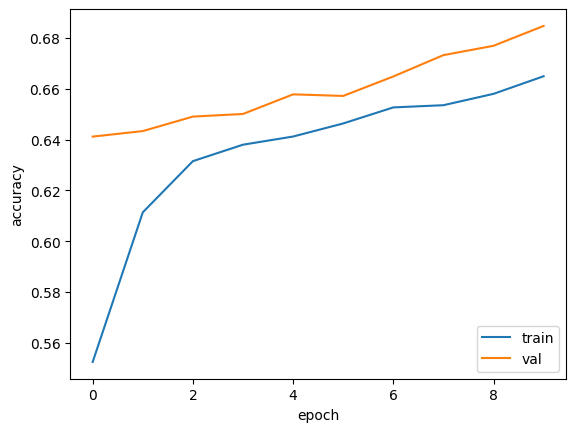

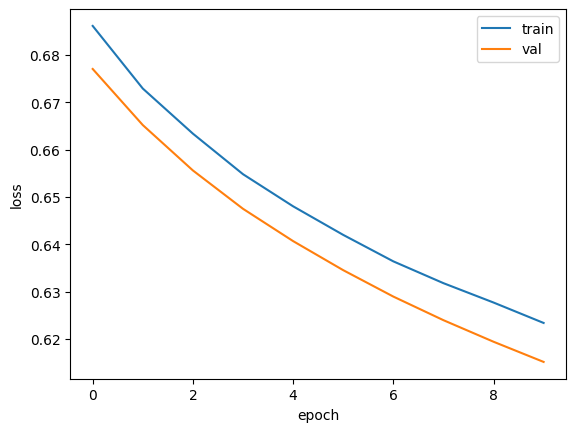


Adam
Epoch 1/10
227/227 [==============================] - 21s 56ms/step - loss: 0.6493 - accuracy: 0.6291 - val_loss: 0.6144 - val_accuracy: 0.6870
Epoch 2/10
227/227 [==============================] - 20s 56ms/step - loss: 0.6074 - accuracy: 0.6848 - val_loss: 0.5832 - val_accuracy: 0.7337
Epoch 3/10
227/227 [==============================] - 20s 56ms/step - loss: 0.5871 - accuracy: 0.7045 - val_loss: 0.5654 - val_accuracy: 0.7324
Epoch 4/10
227/227 [==============================] - 19s 53ms/step - loss: 0.5745 - accuracy: 0.7125 - val_loss: 0.5484 - val_accuracy: 0.7533
Epoch 5/10
227/227 [==============================] - 20s 56ms/step - loss: 0.5645 - accuracy: 0.7201 - val_loss: 0.5365 - val_accuracy: 0.7649
Epoch 6/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5586 - accuracy: 0.7230 - val_loss: 0.5268 - val_accuracy: 0.7688
Epoch 7/10
227/227 [==============================] - 20s 58ms/step - loss: 0.5531 - accuracy: 0.7272 - val_loss: 0.5231 - val_acc

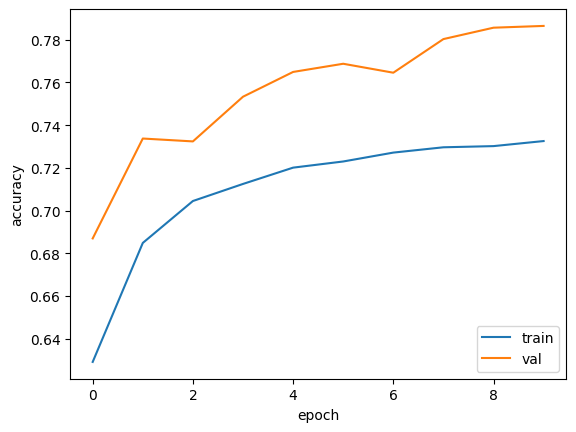

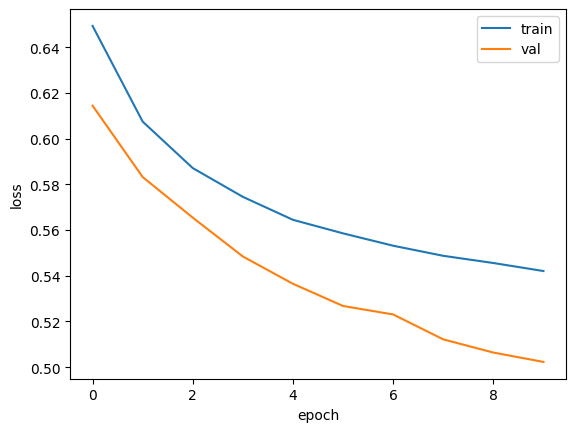


Adam
Epoch 1/10
227/227 [==============================] - 20s 55ms/step - loss: 0.6001 - accuracy: 0.6715 - val_loss: 0.5196 - val_accuracy: 0.7831
Epoch 2/10
227/227 [==============================] - 20s 55ms/step - loss: 0.5631 - accuracy: 0.7107 - val_loss: 0.5340 - val_accuracy: 0.7256
Epoch 3/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5581 - accuracy: 0.7126 - val_loss: 0.4978 - val_accuracy: 0.7638
Epoch 4/10
227/227 [==============================] - 19s 55ms/step - loss: 0.5572 - accuracy: 0.7147 - val_loss: 0.4867 - val_accuracy: 0.7864
Epoch 5/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5547 - accuracy: 0.7124 - val_loss: 0.4880 - val_accuracy: 0.7780
Epoch 6/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5574 - accuracy: 0.7137 - val_loss: 0.4761 - val_accuracy: 0.8091
Epoch 7/10
227/227 [==============================] - 19s 54ms/step - loss: 0.5585 - accuracy: 0.7116 - val_loss: 0.4845 - val_acc

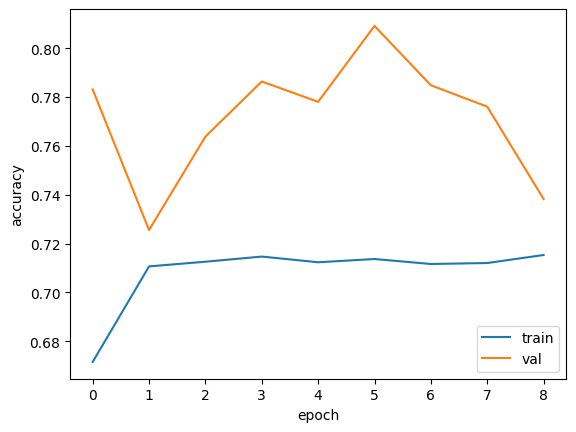

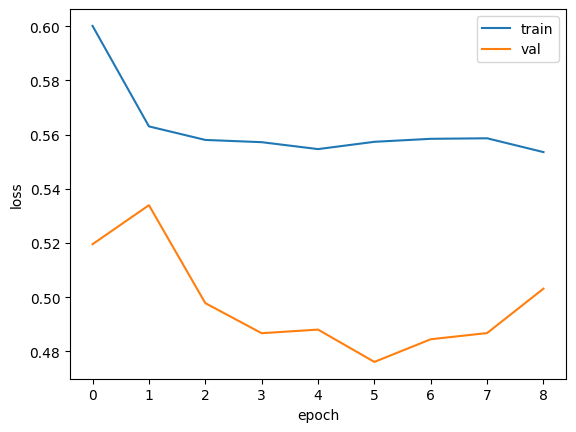


Adam
Epoch 1/10
227/227 [==============================] - 21s 58ms/step - loss: 0.6879 - accuracy: 0.5507 - val_loss: 0.6803 - val_accuracy: 0.6110
Epoch 2/10
227/227 [==============================] - 30s 89ms/step - loss: 0.6763 - accuracy: 0.6080 - val_loss: 0.6694 - val_accuracy: 0.6539
Epoch 3/10
227/227 [==============================] - 29s 81ms/step - loss: 0.6668 - accuracy: 0.6300 - val_loss: 0.6601 - val_accuracy: 0.6637
Epoch 4/10
227/227 [==============================] - 20s 56ms/step - loss: 0.6584 - accuracy: 0.6446 - val_loss: 0.6519 - val_accuracy: 0.6797
Epoch 5/10
227/227 [==============================] - 19s 54ms/step - loss: 0.6511 - accuracy: 0.6514 - val_loss: 0.6448 - val_accuracy: 0.6869
Epoch 6/10
227/227 [==============================] - 20s 56ms/step - loss: 0.6451 - accuracy: 0.6565 - val_loss: 0.6382 - val_accuracy: 0.6847
Epoch 7/10
227/227 [==============================] - 19s 53ms/step - loss: 0.6388 - accuracy: 0.6616 - val_loss: 0.6323 - val_acc

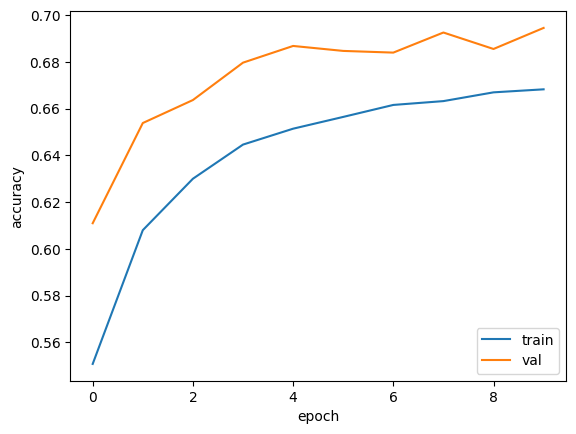

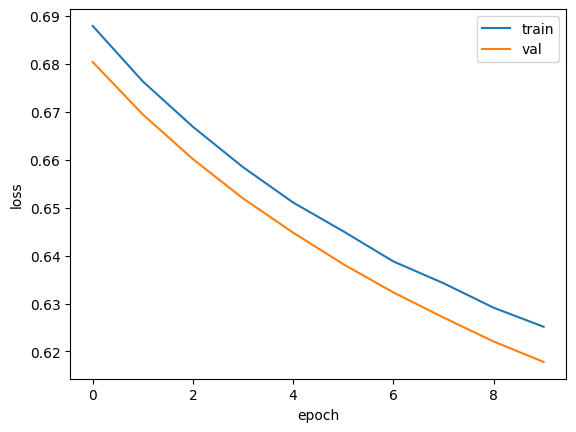


RMSprop
Epoch 1/10
227/227 [==============================] - 27s 70ms/step - loss: 0.6501 - accuracy: 0.6405 - val_loss: 0.6177 - val_accuracy: 0.6765
Epoch 2/10
227/227 [==============================] - 37s 99ms/step - loss: 0.6096 - accuracy: 0.6785 - val_loss: 0.5851 - val_accuracy: 0.7075
Epoch 3/10
227/227 [==============================] - 33s 79ms/step - loss: 0.5851 - accuracy: 0.6999 - val_loss: 0.5630 - val_accuracy: 0.7462
Epoch 4/10
227/227 [==============================] - 26s 67ms/step - loss: 0.5711 - accuracy: 0.7119 - val_loss: 0.5449 - val_accuracy: 0.7674
Epoch 5/10
227/227 [==============================] - 20s 57ms/step - loss: 0.5586 - accuracy: 0.7232 - val_loss: 0.5302 - val_accuracy: 0.7780
Epoch 6/10
227/227 [==============================] - 20s 57ms/step - loss: 0.5498 - accuracy: 0.7292 - val_loss: 0.5197 - val_accuracy: 0.7869
Epoch 7/10
227/227 [==============================] - 19s 55ms/step - loss: 0.5437 - accuracy: 0.7319 - val_loss: 0.5091 - val_

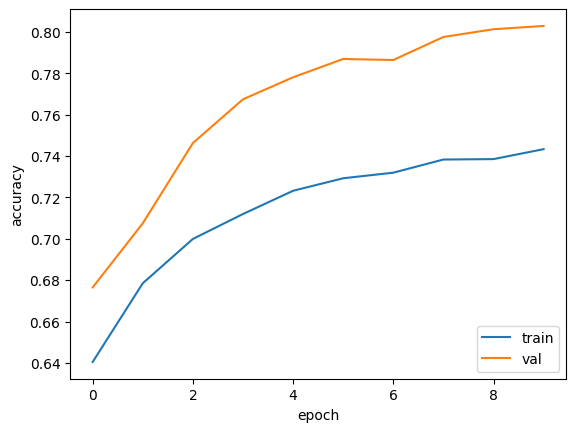

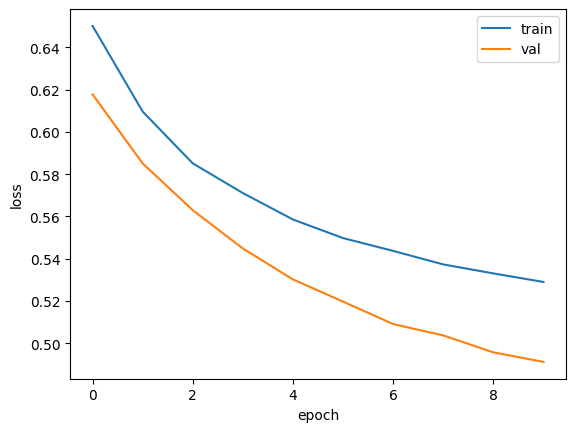


RMSprop
Epoch 1/10
227/227 [==============================] - 38s 100ms/step - loss: 0.6012 - accuracy: 0.6732 - val_loss: 0.5266 - val_accuracy: 0.7717
Epoch 2/10
227/227 [==============================] - 34s 91ms/step - loss: 0.5463 - accuracy: 0.7268 - val_loss: 0.4871 - val_accuracy: 0.7823
Epoch 3/10
227/227 [==============================] - 31s 77ms/step - loss: 0.5335 - accuracy: 0.7335 - val_loss: 0.4784 - val_accuracy: 0.7775
Epoch 4/10
227/227 [==============================] - 28s 74ms/step - loss: 0.5288 - accuracy: 0.7345 - val_loss: 0.4685 - val_accuracy: 0.7869
Epoch 5/10
227/227 [==============================] - 24s 67ms/step - loss: 0.5246 - accuracy: 0.7377 - val_loss: 0.4490 - val_accuracy: 0.8055
Epoch 6/10
227/227 [==============================] - 20s 56ms/step - loss: 0.5211 - accuracy: 0.7393 - val_loss: 0.4770 - val_accuracy: 0.7817
Epoch 7/10
227/227 [==============================] - 24s 66ms/step - loss: 0.5202 - accuracy: 0.7426 - val_loss: 0.5040 - val

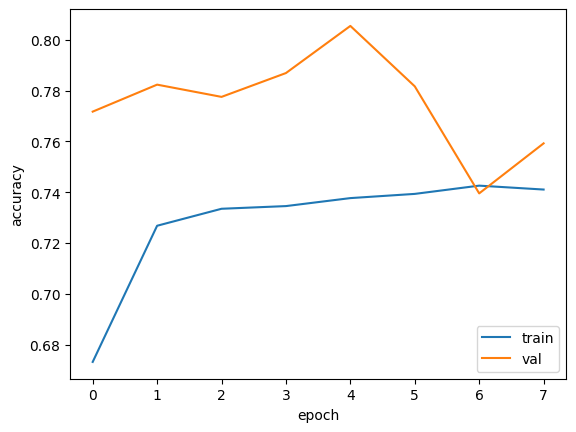

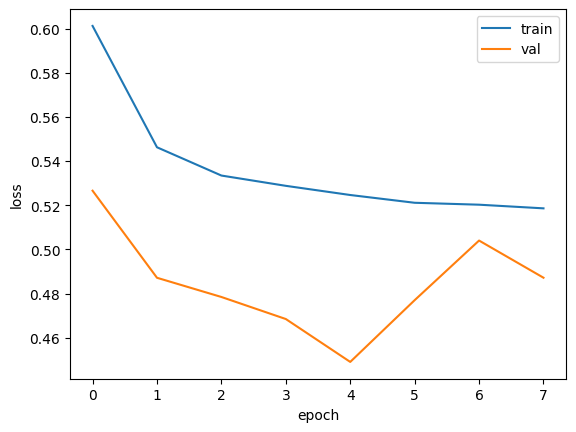


RMSprop
Epoch 1/10
227/227 [==============================] - 22s 56ms/step - loss: 0.6858 - accuracy: 0.5478 - val_loss: 0.6750 - val_accuracy: 0.6149
Epoch 2/10
227/227 [==============================] - 21s 61ms/step - loss: 0.6725 - accuracy: 0.5944 - val_loss: 0.6630 - val_accuracy: 0.6292
Epoch 3/10
227/227 [==============================] - 21s 57ms/step - loss: 0.6625 - accuracy: 0.6172 - val_loss: 0.6529 - val_accuracy: 0.6473
Epoch 4/10
227/227 [==============================] - 20s 57ms/step - loss: 0.6536 - accuracy: 0.6261 - val_loss: 0.6450 - val_accuracy: 0.6591
Epoch 5/10
227/227 [==============================] - 20s 57ms/step - loss: 0.6463 - accuracy: 0.6355 - val_loss: 0.6379 - val_accuracy: 0.6680
Epoch 6/10
227/227 [==============================] - 20s 58ms/step - loss: 0.6410 - accuracy: 0.6441 - val_loss: 0.6319 - val_accuracy: 0.6704
Epoch 7/10
227/227 [==============================] - 20s 57ms/step - loss: 0.6350 - accuracy: 0.6500 - val_loss: 0.6264 - val_

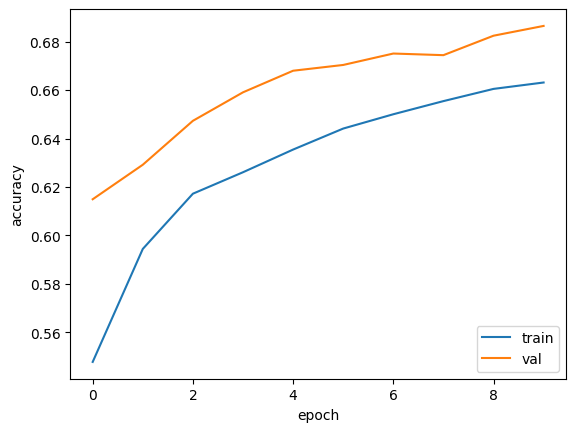

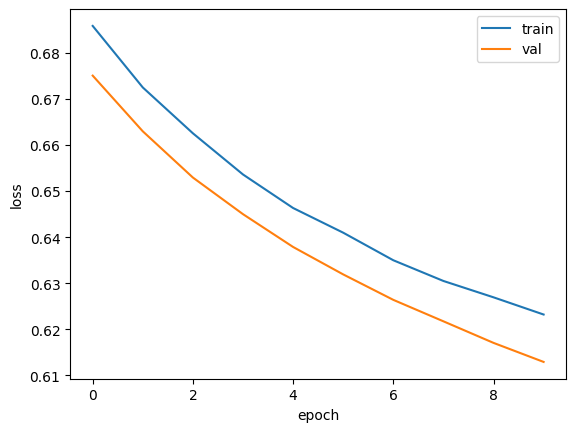


SGD
Epoch 1/10
227/227 [==============================] - 26s 71ms/step - loss: 0.6894 - accuracy: 0.5436 - val_loss: 0.6836 - val_accuracy: 0.6418
Epoch 2/10
227/227 [==============================] - 37s 102ms/step - loss: 0.6840 - accuracy: 0.5822 - val_loss: 0.6787 - val_accuracy: 0.6511
Epoch 3/10
227/227 [==============================] - 32s 78ms/step - loss: 0.6795 - accuracy: 0.6039 - val_loss: 0.6742 - val_accuracy: 0.6502
Epoch 4/10
227/227 [==============================] - 25s 70ms/step - loss: 0.6753 - accuracy: 0.6202 - val_loss: 0.6703 - val_accuracy: 0.6625
Epoch 5/10
227/227 [==============================] - 23s 68ms/step - loss: 0.6718 - accuracy: 0.6284 - val_loss: 0.6663 - val_accuracy: 0.6571
Epoch 6/10
227/227 [==============================] - 22s 63ms/step - loss: 0.6685 - accuracy: 0.6327 - val_loss: 0.6629 - val_accuracy: 0.6522
Epoch 7/10
227/227 [==============================] - 32s 97ms/step - loss: 0.6649 - accuracy: 0.6371 - val_loss: 0.6597 - val_acc

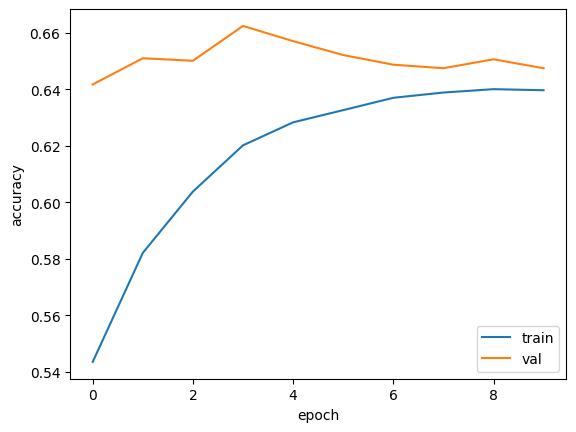

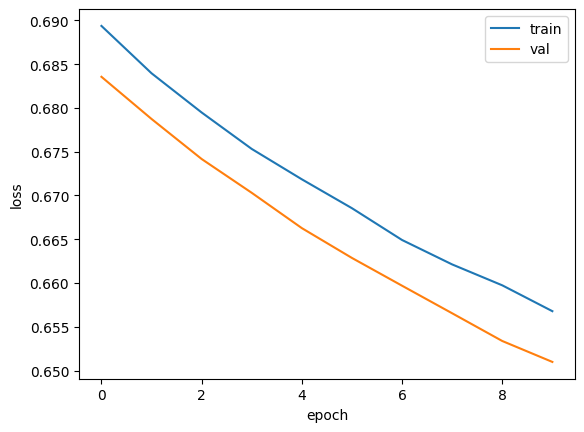


SGD
Epoch 1/10
227/227 [==============================] - 28s 57ms/step - loss: 0.6917 - accuracy: 0.5165 - val_loss: 0.6899 - val_accuracy: 0.5200
Epoch 2/10
227/227 [==============================] - 20s 55ms/step - loss: 0.6912 - accuracy: 0.5199 - val_loss: 0.6894 - val_accuracy: 0.5185
Epoch 3/10
227/227 [==============================] - 19s 54ms/step - loss: 0.6906 - accuracy: 0.5246 - val_loss: 0.6891 - val_accuracy: 0.5201
Epoch 4/10
227/227 [==============================] - 20s 57ms/step - loss: 0.6902 - accuracy: 0.5285 - val_loss: 0.6887 - val_accuracy: 0.5211
Epoch 5/10
227/227 [==============================] - 19s 54ms/step - loss: 0.6899 - accuracy: 0.5318 - val_loss: 0.6883 - val_accuracy: 0.5227
Epoch 6/10
227/227 [==============================] - 20s 58ms/step - loss: 0.6895 - accuracy: 0.5373 - val_loss: 0.6879 - val_accuracy: 0.5259
Epoch 7/10
227/227 [==============================] - 20s 57ms/step - loss: 0.6892 - accuracy: 0.5395 - val_loss: 0.6875 - val_accu

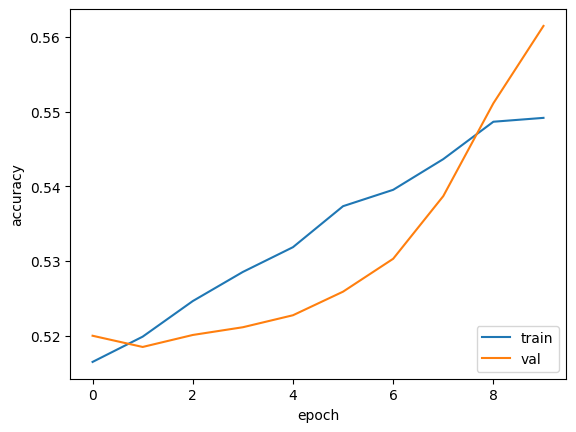

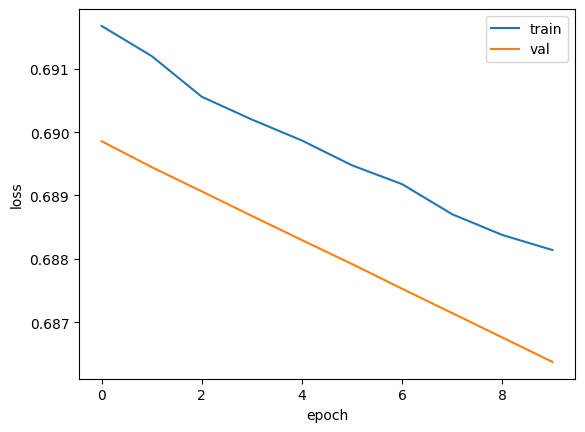


SGD
Epoch 1/10
227/227 [==============================] - 21s 57ms/step - loss: 0.6735 - accuracy: 0.6014 - val_loss: 0.6489 - val_accuracy: 0.6696
Epoch 2/10
227/227 [==============================] - 19s 56ms/step - loss: 0.6428 - accuracy: 0.6613 - val_loss: 0.6241 - val_accuracy: 0.6798
Epoch 3/10
227/227 [==============================] - 19s 55ms/step - loss: 0.6239 - accuracy: 0.6731 - val_loss: 0.6068 - val_accuracy: 0.6834
Epoch 4/10
227/227 [==============================] - 19s 55ms/step - loss: 0.6112 - accuracy: 0.6850 - val_loss: 0.5934 - val_accuracy: 0.6969
Epoch 5/10
227/227 [==============================] - 20s 56ms/step - loss: 0.6014 - accuracy: 0.6928 - val_loss: 0.5828 - val_accuracy: 0.7090
Epoch 6/10
227/227 [==============================] - 20s 55ms/step - loss: 0.5917 - accuracy: 0.7024 - val_loss: 0.5722 - val_accuracy: 0.7262
Epoch 7/10
227/227 [==============================] - 19s 55ms/step - loss: 0.5848 - accuracy: 0.7070 - val_loss: 0.5651 - val_accu

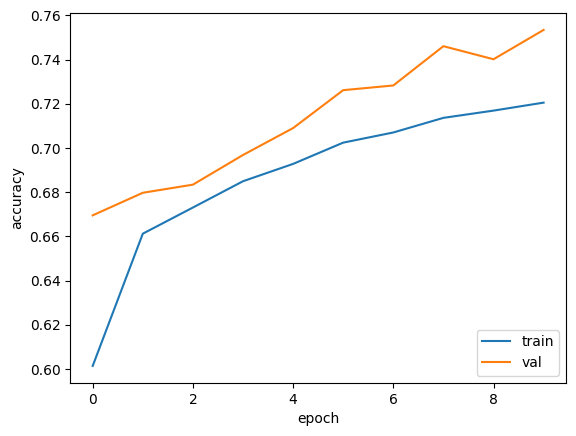

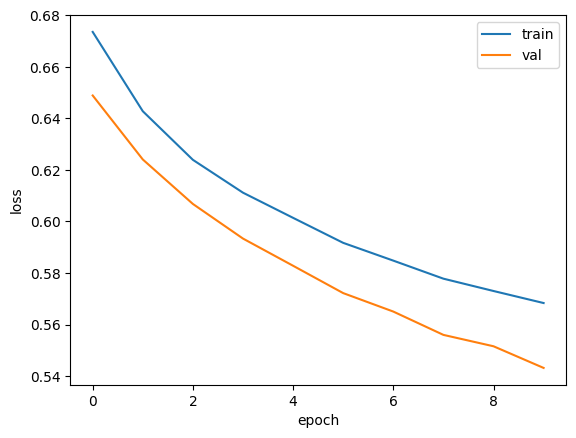

In [ ]:
#Optimizer selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()




  print("Adam")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()






  print("RMSprop")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("RMSprop")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("RMSprop")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()





  print("SGD")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('randomCNN', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.1), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
Epoch 1/10
227/227 [==============================] - 22s 60ms/step - loss: 0.5271 - accuracy: 0.7400 - val_loss: 0.4246 - val_accuracy: 0.8213
Epoch 2/10
227/227 [==============================] - 19s 55ms/step - loss: 0.4903 - accuracy: 0.7697 - val_loss: 0.4063 - val_accuracy: 0.8432
Epoch 3/10
227/227 [==============================] - 20s 58ms/step - loss: 0.4812 - accuracy: 0.7742 - val_loss: 0.4012 - val_accuracy: 0.8270
Epoch 4/10
227/227 [==============================] - 21s 56ms/step - loss: 0.4801 - accuracy: 0.7737 - val_loss: 0.3896 - val_accuracy: 0.8428
Epoch 5/10
227/227 [==============================] - 19s 57ms/step - loss: 0.4791 - accuracy: 0.7752 - val_loss: 0.3968 - val_accuracy: 0.8360
Epoch 6/10
227/227 [==============================] - 20s 57ms/step - loss: 0.4778 - accuracy: 0.7738 - val_loss: 0.3858 - val_accuracy: 0.8533
Epoch 7/10
227/227 [==============================] - 19s 56ms/step - loss: 0.4793 - accuracy: 0.7752 - val_loss: 0.4225 - val_acc

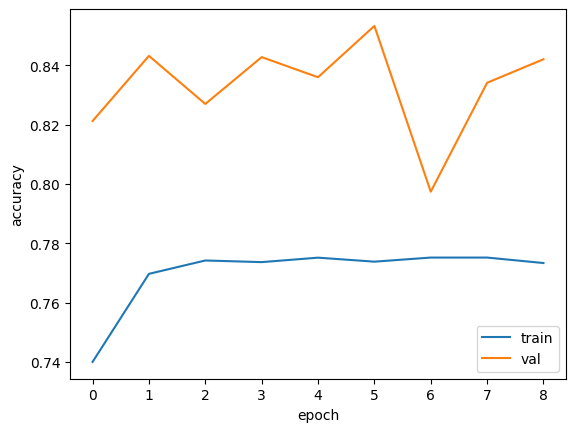

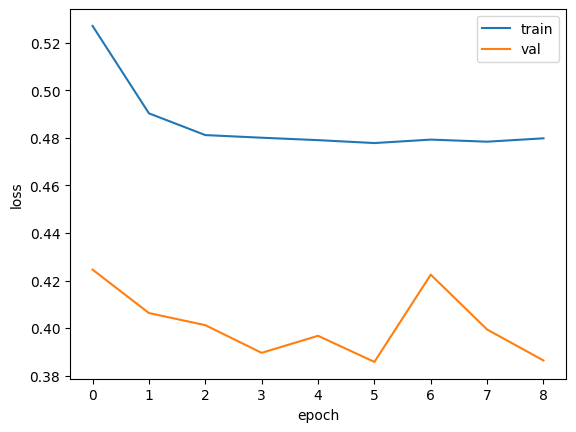


AdamW
Epoch 1/10
227/227 [==============================] - 20s 58ms/step - loss: 0.7241 - accuracy: 0.5034 - val_loss: 0.6942 - val_accuracy: 0.5218
Epoch 2/10
227/227 [==============================] - 21s 59ms/step - loss: 0.7133 - accuracy: 0.5031 - val_loss: 0.7641 - val_accuracy: 0.4782
Epoch 3/10
227/227 [==============================] - 19s 56ms/step - loss: 0.7137 - accuracy: 0.4997 - val_loss: 0.7002 - val_accuracy: 0.4782
Epoch 4/10
227/227 [==============================] - 20s 58ms/step - loss: 0.7110 - accuracy: 0.5061 - val_loss: 0.7387 - val_accuracy: 0.5218


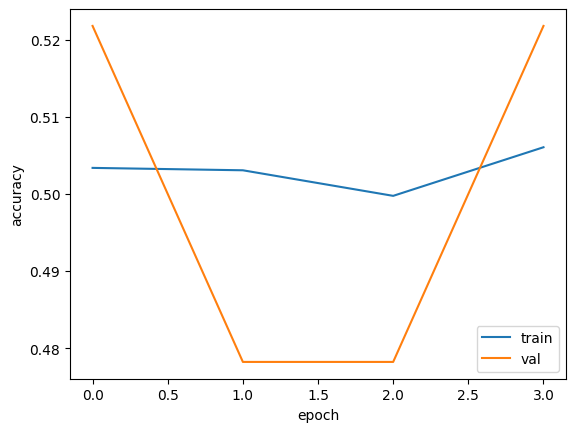

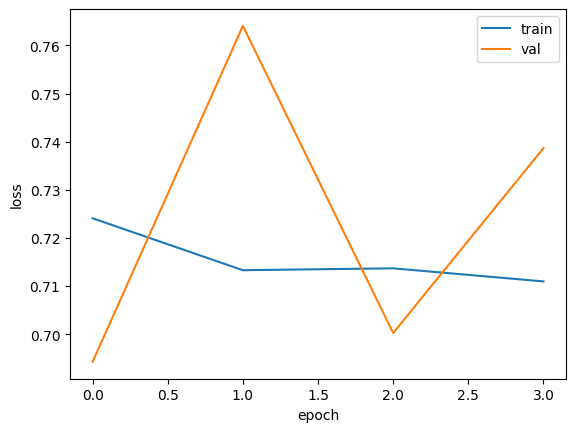


AdamW
Epoch 1/10
227/227 [==============================] - 24s 72ms/step - loss: 0.5803 - accuracy: 0.7025 - val_loss: 0.5166 - val_accuracy: 0.7748
Epoch 2/10
227/227 [==============================] - 28s 83ms/step - loss: 0.5125 - accuracy: 0.7618 - val_loss: 0.4716 - val_accuracy: 0.8086
Epoch 3/10
227/227 [==============================] - 42s 127ms/step - loss: 0.4891 - accuracy: 0.7729 - val_loss: 0.4450 - val_accuracy: 0.8220
Epoch 4/10
227/227 [==============================] - 46s 128ms/step - loss: 0.4736 - accuracy: 0.7813 - val_loss: 0.4280 - val_accuracy: 0.8270
Epoch 5/10
227/227 [==============================] - 38s 109ms/step - loss: 0.4682 - accuracy: 0.7829 - val_loss: 0.4163 - val_accuracy: 0.8351
Epoch 6/10
227/227 [==============================] - 39s 117ms/step - loss: 0.4644 - accuracy: 0.7826 - val_loss: 0.4075 - val_accuracy: 0.8357
Epoch 7/10
227/227 [==============================] - 32s 94ms/step - loss: 0.4607 - accuracy: 0.7845 - val_loss: 0.4008 - va

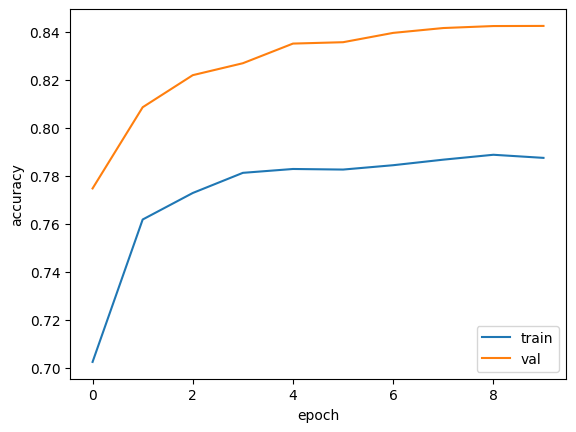

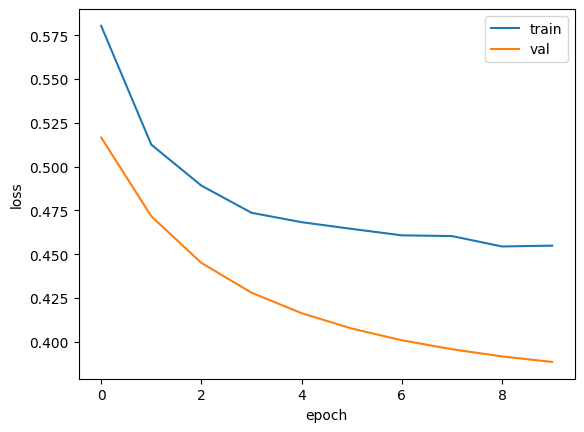

In [ ]:
#Activation function selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('randomCNN', 'tanh', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('randomCNN', 'sigmoid', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('randomCNN', 'gelu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
Epoch 1/10
227/227 [==============================] - 34s 89ms/step - loss: 0.5326 - accuracy: 0.7402 - val_loss: 0.4546 - val_accuracy: 0.8055
Epoch 2/10
227/227 [==============================] - 30s 83ms/step - loss: 0.4573 - accuracy: 0.7940 - val_loss: 0.4062 - val_accuracy: 0.8396
Epoch 3/10
227/227 [==============================] - 31s 86ms/step - loss: 0.4376 - accuracy: 0.8024 - val_loss: 0.3791 - val_accuracy: 0.8566
Epoch 4/10
227/227 [==============================] - 31s 87ms/step - loss: 0.4275 - accuracy: 0.8066 - val_loss: 0.3649 - val_accuracy: 0.8645
Epoch 5/10
227/227 [==============================] - 30s 83ms/step - loss: 0.4193 - accuracy: 0.8110 - val_loss: 0.3568 - val_accuracy: 0.8665
Epoch 6/10
227/227 [==============================] - 30s 87ms/step - loss: 0.4184 - accuracy: 0.8099 - val_loss: 0.3628 - val_accuracy: 0.8514
Epoch 7/10
227/227 [==============================] - 33s 90ms/step - loss: 0.4152 - accuracy: 0.8117 - val_loss: 0.3460 - val_acc

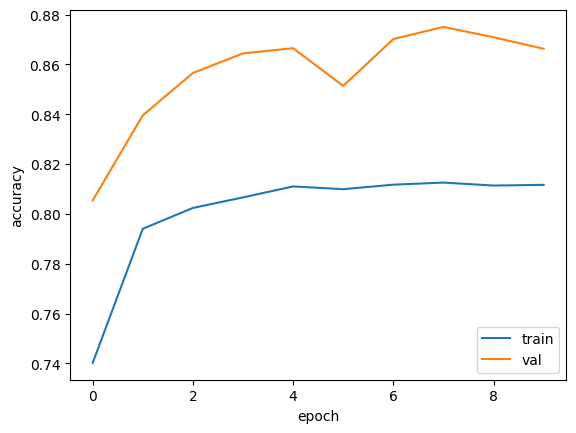

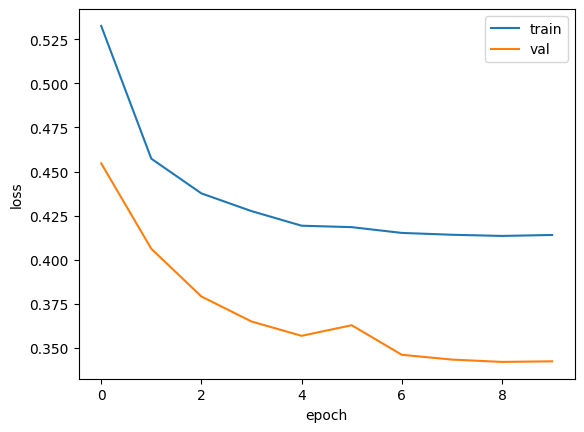


AdamW
Epoch 1/10
227/227 [==============================] - 37s 95ms/step - loss: 0.5836 - accuracy: 0.6980 - val_loss: 0.5144 - val_accuracy: 0.7772
Epoch 2/10
227/227 [==============================] - 34s 92ms/step - loss: 0.5316 - accuracy: 0.7422 - val_loss: 0.4920 - val_accuracy: 0.7767
Epoch 3/10
227/227 [==============================] - 31s 87ms/step - loss: 0.5200 - accuracy: 0.7481 - val_loss: 0.4826 - val_accuracy: 0.7794
Epoch 4/10
227/227 [==============================] - 31s 85ms/step - loss: 0.5181 - accuracy: 0.7476 - val_loss: 0.4638 - val_accuracy: 0.7891
Epoch 5/10
227/227 [==============================] - 32s 89ms/step - loss: 0.5152 - accuracy: 0.7483 - val_loss: 0.4593 - val_accuracy: 0.7893
Epoch 6/10
227/227 [==============================] - 31s 85ms/step - loss: 0.5163 - accuracy: 0.7469 - val_loss: 0.4931 - val_accuracy: 0.7645
Epoch 7/10
227/227 [==============================] - 31s 85ms/step - loss: 0.5155 - accuracy: 0.7474 - val_loss: 0.4565 - val_ac

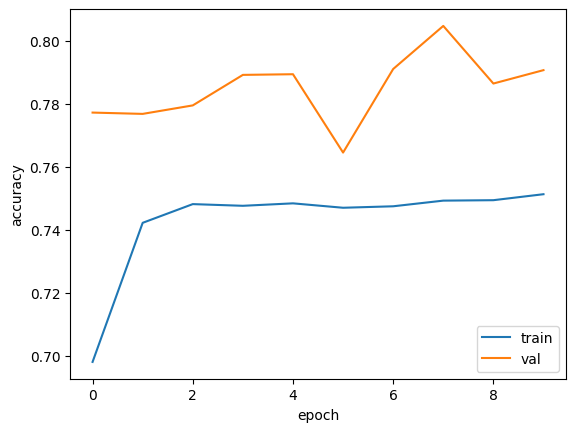

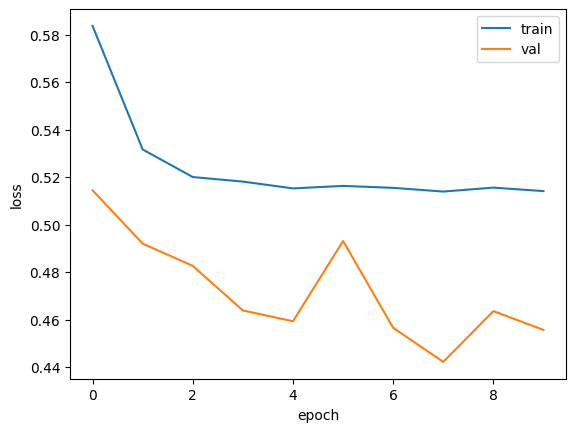

In [ ]:
#Dropout rate selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('randomCNN', 'relu', 0.1)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("AdamW")
  # Compile the model
  model = get_model('randomCNN', 'relu', 0.3)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

Epoch 1/10
227/227 [==============================] - 30s 80ms/step - loss: 0.5744 - accuracy: 0.7001 - val_loss: 0.4970 - val_accuracy: 0.7803
Epoch 2/10
227/227 [==============================] - 34s 108ms/step - loss: 0.5011 - accuracy: 0.7606 - val_loss: 0.4500 - val_accuracy: 0.8085
Epoch 3/10
227/227 [==============================] - 27s 76ms/step - loss: 0.4838 - accuracy: 0.7704 - val_loss: 0.4244 - val_accuracy: 0.8263
Epoch 4/10
227/227 [==============================] - 19s 55ms/step - loss: 0.4746 - accuracy: 0.7736 - val_loss: 0.4117 - val_accuracy: 0.8294
Epoch 5/10
227/227 [==============================] - 19s 53ms/step - loss: 0.4668 - accuracy: 0.7770 - val_loss: 0.4031 - val_accuracy: 0.8340
Epoch 6/10
227/227 [==============================] - 20s 58ms/step - loss: 0.4677 - accuracy: 0.7762 - val_loss: 0.4012 - val_accuracy: 0.8323
Epoch 7/10
227/227 [==============================] - 19s 58ms/step - loss: 0.4623 - accuracy: 0.7791 - val_loss: 0.3967 - val_accuracy

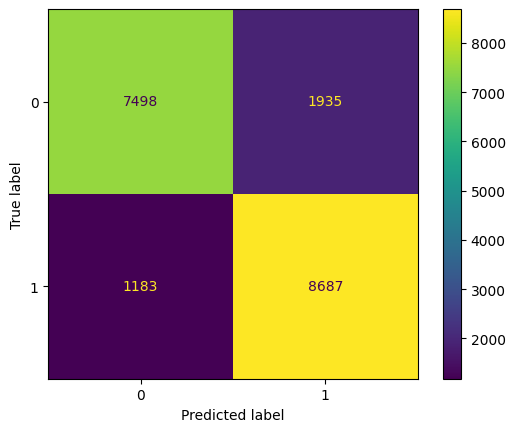


Precision:  0.81783091696479
Recall:  0.8801418439716312
F1:  0.8478430607066172
Avg acc: 0.8385
0.8384707040356422 0.8384707040356422 0.8384707040356422 0.8384707040356422 0.8384707040356422 0.8384707040356422 0.8384707040356422
Standard error: 0.0000
126/126 [==============================] - 4s 30ms/step
[[0.4829324  0.5170676 ]
 [0.63630146 0.3636987 ]
 [0.64362305 0.35637686]
 ...
 [0.6859203  0.3140796 ]
 [0.68946844 0.31053153]
 [0.6795603  0.3204396 ]]
32134


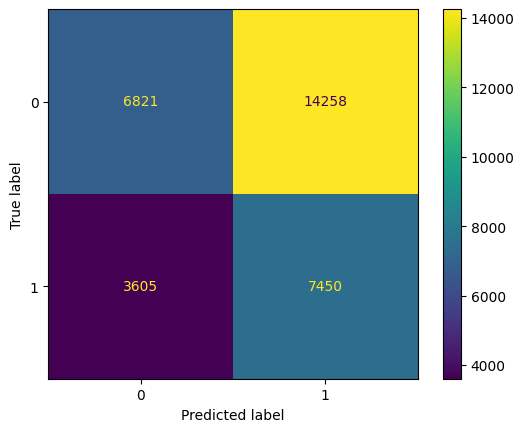


Precision:  0.3431914501566243
Recall:  0.6739032112166441
F1:  0.4547813081830114
Avg acc: 0.4441
0.4441090433808427 0.4441090433808427 0.4441090433808427 0.4441090433808427 0.4441090433808427 0.4441090433808427 0.4441090433808427
Standard error: 0.0000


In [ ]:

model = get_model('randomCNN', 'relu', 0.1)
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # Make predictions on the test set
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp))

  tf.random.set_seed(42)
  np.random.seed(71516)
  y2 = np.array(model.predict(test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # test_loss, test_acc = model.evaluate(unseen_test_dataset)
  # print('Unseen Test accuracy:', test_acc)
  # print('Unseen Test loss:', test_loss)
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(unseen_test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(42)
  np.random.seed(42)
  y2 = np.array(model.predict(unseen_test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(unseen_test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(unseen_test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(unseen_test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(unseen_test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(unseen_test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp_unseen))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp_unseen
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

Simple CNN baseline -> apparently as good as or better than resNet -> our dataset is too simple

SimpleCNN Hyperparam optim

AdamW
Epoch 1/10
227/227 [==============================] - 54s 139ms/step - loss: 0.2417 - accuracy: 0.8974 - val_loss: 0.1046 - val_accuracy: 0.9622
Epoch 2/10
227/227 [==============================] - 28s 91ms/step - loss: 0.0906 - accuracy: 0.9628 - val_loss: 0.0713 - val_accuracy: 0.9693
Epoch 3/10
227/227 [==============================] - 24s 75ms/step - loss: 0.0655 - accuracy: 0.9711 - val_loss: 0.0585 - val_accuracy: 0.9714
Epoch 4/10
227/227 [==============================] - 23s 73ms/step - loss: 0.0546 - accuracy: 0.9759 - val_loss: 0.0534 - val_accuracy: 0.9747
Epoch 5/10
227/227 [==============================] - 23s 71ms/step - loss: 0.0472 - accuracy: 0.9787 - val_loss: 0.0443 - val_accuracy: 0.9798
Epoch 6/10
227/227 [==============================] - 23s 71ms/step - loss: 0.0402 - accuracy: 0.9816 - val_loss: 0.0413 - val_accuracy: 0.9787
Epoch 7/10
227/227 [==============================] - 23s 71ms/step - loss: 0.0349 - accuracy: 0.9837 - val_loss: 0.0408 - val_ac

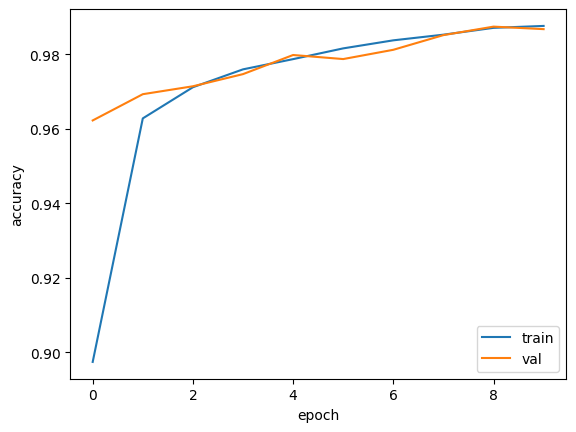

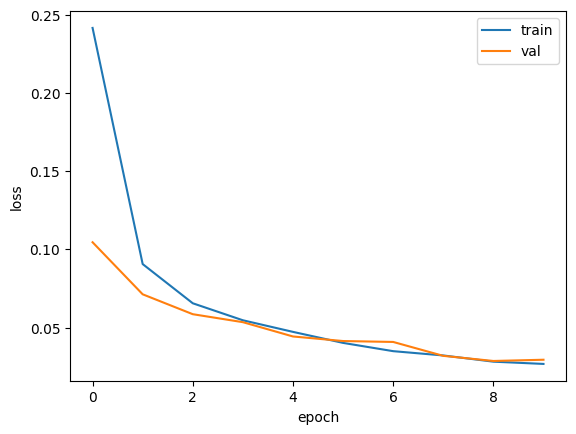


Epoch 1/10
227/227 [==============================] - 25s 71ms/step - loss: 0.8850 - accuracy: 0.7788 - val_loss: 0.2507 - val_accuracy: 0.9000
Epoch 2/10
227/227 [==============================] - 24s 73ms/step - loss: 0.1325 - accuracy: 0.9467 - val_loss: 0.0855 - val_accuracy: 0.9632
Epoch 3/10
227/227 [==============================] - 24s 72ms/step - loss: 0.0896 - accuracy: 0.9611 - val_loss: 0.0859 - val_accuracy: 0.9610
Epoch 4/10
227/227 [==============================] - 23s 72ms/step - loss: 0.0772 - accuracy: 0.9649 - val_loss: 0.0623 - val_accuracy: 0.9690
Epoch 5/10
227/227 [==============================] - 23s 72ms/step - loss: 0.0678 - accuracy: 0.9686 - val_loss: 0.0624 - val_accuracy: 0.9680
Epoch 6/10
227/227 [==============================] - 22s 69ms/step - loss: 0.0645 - accuracy: 0.9698 - val_loss: 0.0576 - val_accuracy: 0.9708
Epoch 7/10
227/227 [==============================] - 22s 70ms/step - loss: 0.0605 - accuracy: 0.9712 - val_loss: 0.0561 - val_accuracy

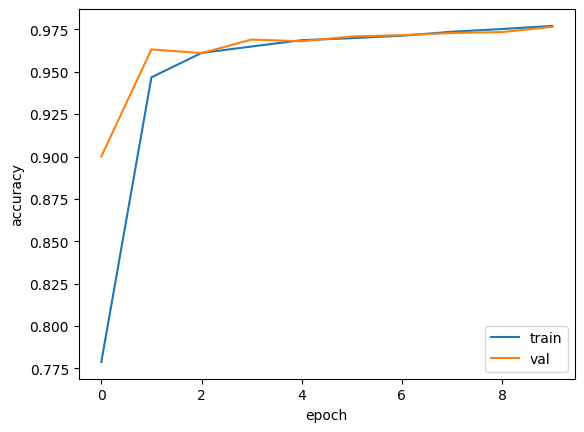

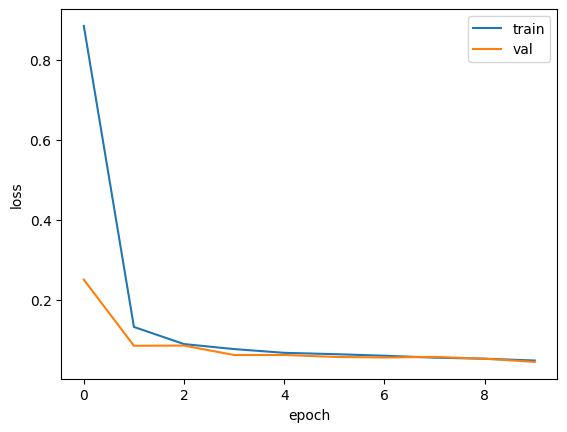


Epoch 1/10
227/227 [==============================] - 25s 72ms/step - loss: 0.3224 - accuracy: 0.8657 - val_loss: 0.1883 - val_accuracy: 0.9374
Epoch 2/10
227/227 [==============================] - 23s 71ms/step - loss: 0.1426 - accuracy: 0.9505 - val_loss: 0.1146 - val_accuracy: 0.9586
Epoch 3/10
227/227 [==============================] - 24s 74ms/step - loss: 0.1088 - accuracy: 0.9582 - val_loss: 0.0934 - val_accuracy: 0.9621
Epoch 4/10
227/227 [==============================] - 23s 71ms/step - loss: 0.0954 - accuracy: 0.9614 - val_loss: 0.0870 - val_accuracy: 0.9624
Epoch 5/10
227/227 [==============================] - 23s 74ms/step - loss: 0.0879 - accuracy: 0.9637 - val_loss: 0.0810 - val_accuracy: 0.9675
Epoch 6/10
227/227 [==============================] - 23s 73ms/step - loss: 0.0791 - accuracy: 0.9658 - val_loss: 0.0680 - val_accuracy: 0.9678
Epoch 7/10
227/227 [==============================] - 23s 73ms/step - loss: 0.0724 - accuracy: 0.9696 - val_loss: 0.0693 - val_accuracy

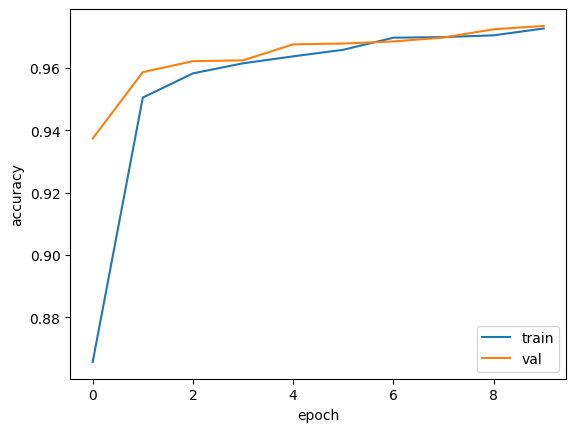

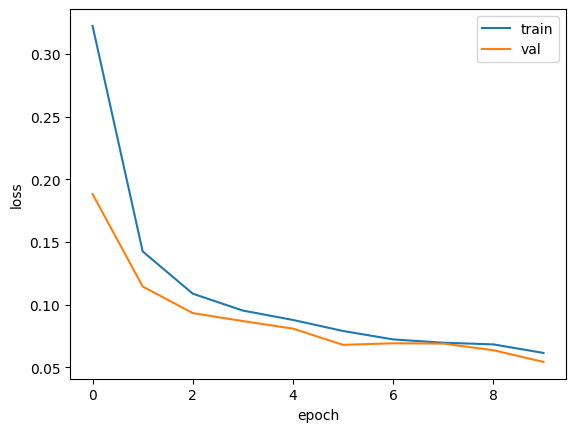


Adam
Epoch 1/10
227/227 [==============================] - 25s 73ms/step - loss: 0.2340 - accuracy: 0.8983 - val_loss: 0.0865 - val_accuracy: 0.9641
Epoch 2/10
227/227 [==============================] - 24s 74ms/step - loss: 0.0786 - accuracy: 0.9661 - val_loss: 0.0610 - val_accuracy: 0.9737
Epoch 3/10
227/227 [==============================] - 23s 74ms/step - loss: 0.0614 - accuracy: 0.9717 - val_loss: 0.0571 - val_accuracy: 0.9719
Epoch 4/10
227/227 [==============================] - 23s 72ms/step - loss: 0.0519 - accuracy: 0.9751 - val_loss: 0.0490 - val_accuracy: 0.9766
Epoch 5/10
227/227 [==============================] - 23s 70ms/step - loss: 0.0452 - accuracy: 0.9780 - val_loss: 0.0433 - val_accuracy: 0.9784
Epoch 6/10
227/227 [==============================] - 32s 108ms/step - loss: 0.0407 - accuracy: 0.9805 - val_loss: 0.0459 - val_accuracy: 0.9739
Epoch 7/10
227/227 [==============================] - 44s 107ms/step - loss: 0.0338 - accuracy: 0.9837 - val_loss: 0.0364 - val_a

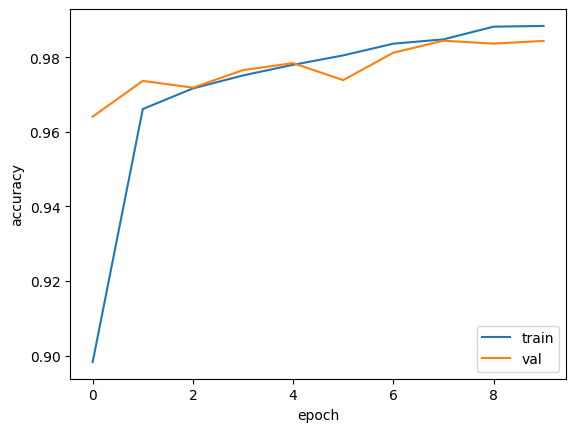

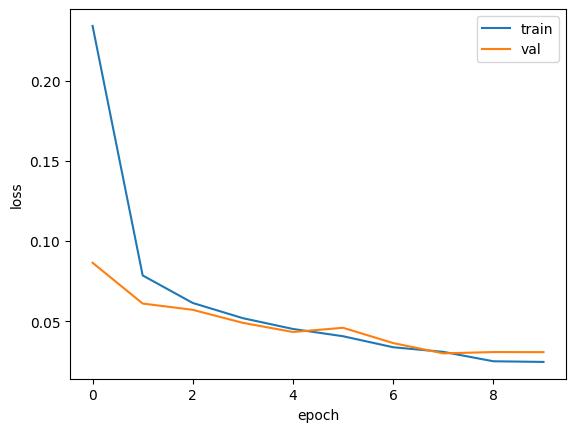


Adam
Epoch 1/10
227/227 [==============================] - 28s 80ms/step - loss: 0.6143 - accuracy: 0.8453 - val_loss: 0.1037 - val_accuracy: 0.9580
Epoch 2/10
227/227 [==============================] - 24s 74ms/step - loss: 0.0932 - accuracy: 0.9589 - val_loss: 0.0682 - val_accuracy: 0.9660
Epoch 3/10
227/227 [==============================] - 26s 81ms/step - loss: 0.0742 - accuracy: 0.9652 - val_loss: 0.0626 - val_accuracy: 0.9703
Epoch 4/10
227/227 [==============================] - 28s 86ms/step - loss: 0.0662 - accuracy: 0.9688 - val_loss: 0.0596 - val_accuracy: 0.9676
Epoch 5/10
227/227 [==============================] - 27s 82ms/step - loss: 0.0617 - accuracy: 0.9708 - val_loss: 0.0579 - val_accuracy: 0.9745
Epoch 6/10
227/227 [==============================] - 29s 80ms/step - loss: 0.0588 - accuracy: 0.9721 - val_loss: 0.0550 - val_accuracy: 0.9736
Epoch 7/10
227/227 [==============================] - 27s 87ms/step - loss: 0.0568 - accuracy: 0.9728 - val_loss: 0.0491 - val_acc

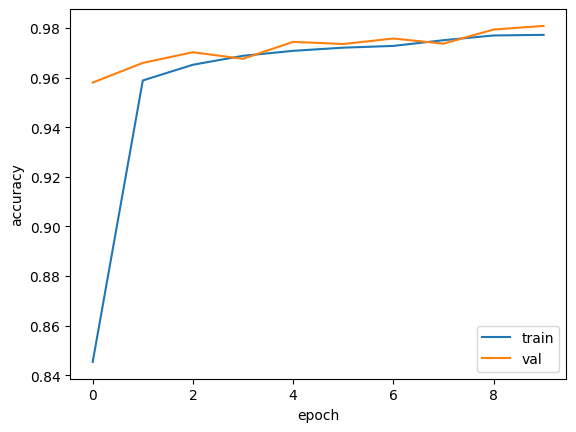

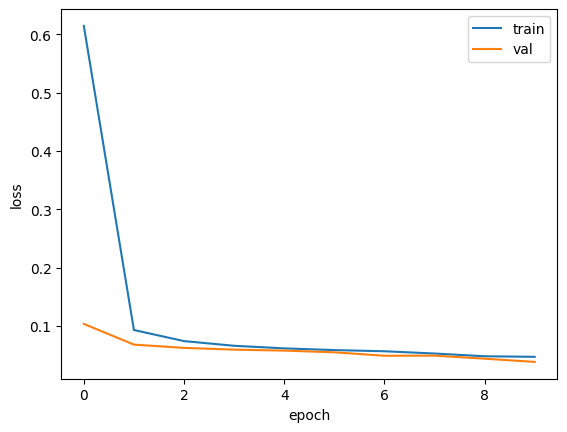


Adam
Epoch 1/10
227/227 [==============================] - 49s 132ms/step - loss: 0.3423 - accuracy: 0.8519 - val_loss: 0.1874 - val_accuracy: 0.9378
Epoch 2/10
227/227 [==============================] - 41s 119ms/step - loss: 0.1455 - accuracy: 0.9488 - val_loss: 0.1118 - val_accuracy: 0.9584
Epoch 3/10
227/227 [==============================] - 38s 113ms/step - loss: 0.1084 - accuracy: 0.9586 - val_loss: 0.0949 - val_accuracy: 0.9604
Epoch 4/10
227/227 [==============================] - 42s 123ms/step - loss: 0.0948 - accuracy: 0.9621 - val_loss: 0.0816 - val_accuracy: 0.9658
Epoch 5/10
227/227 [==============================] - 42s 124ms/step - loss: 0.0826 - accuracy: 0.9656 - val_loss: 0.0722 - val_accuracy: 0.9684
Epoch 6/10
227/227 [==============================] - 39s 113ms/step - loss: 0.0767 - accuracy: 0.9675 - val_loss: 0.0682 - val_accuracy: 0.9687
Epoch 7/10
227/227 [==============================] - 37s 108ms/step - loss: 0.0713 - accuracy: 0.9691 - val_loss: 0.0626 - 

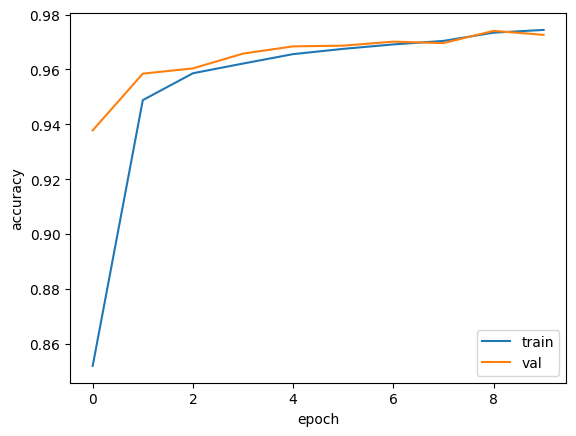

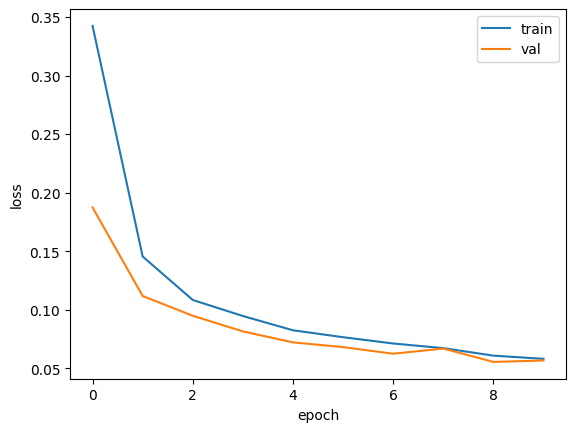


RMSprop
Epoch 1/10
227/227 [==============================] - 41s 109ms/step - loss: 0.3855 - accuracy: 0.8323 - val_loss: 0.1208 - val_accuracy: 0.9547
Epoch 2/10
227/227 [==============================] - 32s 92ms/step - loss: 0.0921 - accuracy: 0.9609 - val_loss: 0.0911 - val_accuracy: 0.9653
Epoch 3/10
227/227 [==============================] - 34s 99ms/step - loss: 0.0663 - accuracy: 0.9690 - val_loss: 0.0631 - val_accuracy: 0.9684
Epoch 4/10
227/227 [==============================] - 33s 93ms/step - loss: 0.0569 - accuracy: 0.9724 - val_loss: 0.0895 - val_accuracy: 0.9663
Epoch 5/10
227/227 [==============================] - 27s 86ms/step - loss: 0.0509 - accuracy: 0.9753 - val_loss: 0.0607 - val_accuracy: 0.9713
Epoch 6/10
227/227 [==============================] - 26s 85ms/step - loss: 0.0448 - accuracy: 0.9780 - val_loss: 0.0733 - val_accuracy: 0.9707
Epoch 7/10
227/227 [==============================] - 32s 107ms/step - loss: 0.0405 - accuracy: 0.9803 - val_loss: 0.0695 - va

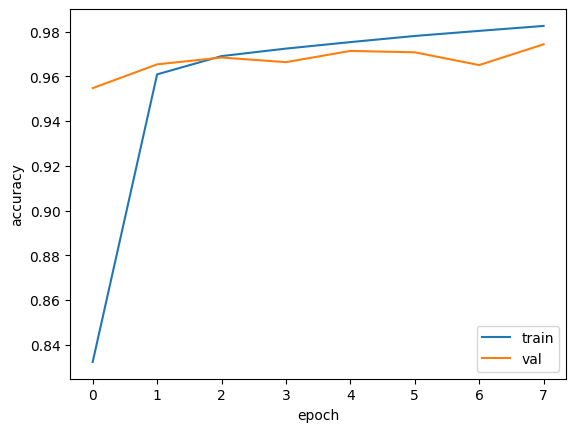

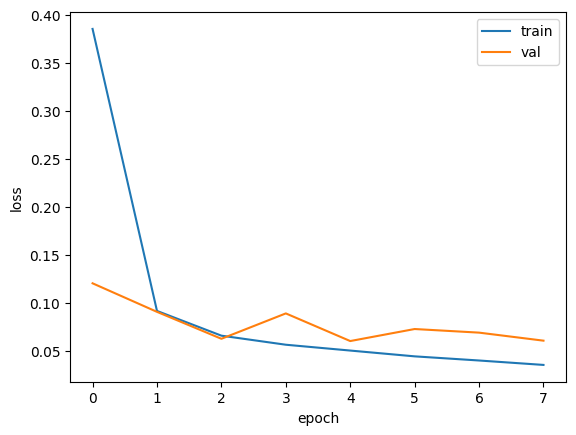


RMSprop
Epoch 1/10
227/227 [==============================] - 45s 122ms/step - loss: 4.0732 - accuracy: 0.6479 - val_loss: 0.3367 - val_accuracy: 0.8543
Epoch 2/10
227/227 [==============================] - 41s 117ms/step - loss: 0.3317 - accuracy: 0.9352 - val_loss: 0.0795 - val_accuracy: 0.9653
Epoch 3/10
227/227 [==============================] - 41s 116ms/step - loss: 0.2367 - accuracy: 0.9549 - val_loss: 0.0877 - val_accuracy: 0.9596
Epoch 4/10
227/227 [==============================] - 43s 118ms/step - loss: 0.0680 - accuracy: 0.9673 - val_loss: 0.0750 - val_accuracy: 0.9663
Epoch 5/10
227/227 [==============================] - 42s 121ms/step - loss: 0.0617 - accuracy: 0.9694 - val_loss: 0.0661 - val_accuracy: 0.9687
Epoch 6/10
227/227 [==============================] - 45s 125ms/step - loss: 0.0603 - accuracy: 0.9701 - val_loss: 0.0594 - val_accuracy: 0.9701
Epoch 7/10
227/227 [==============================] - 45s 125ms/step - loss: 0.0582 - accuracy: 0.9698 - val_loss: 0.0617

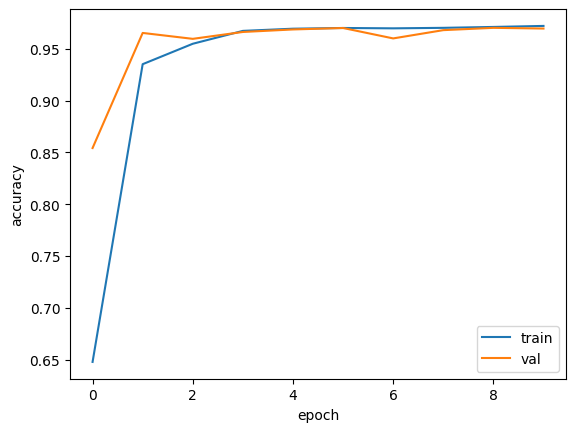

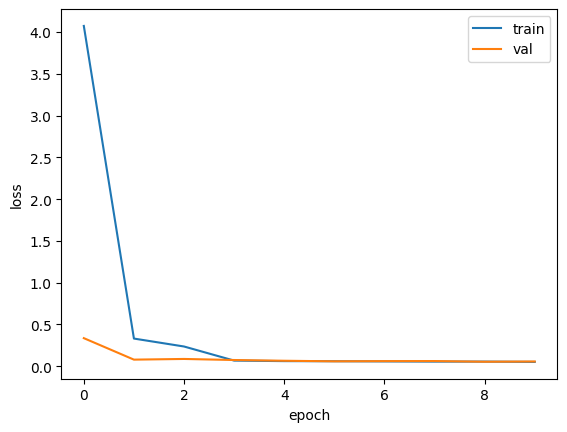


RMSprop
Epoch 1/10
227/227 [==============================] - 43s 103ms/step - loss: 0.4978 - accuracy: 0.7593 - val_loss: 0.3197 - val_accuracy: 0.8991
Epoch 2/10
227/227 [==============================] - 28s 86ms/step - loss: 0.2752 - accuracy: 0.9010 - val_loss: 0.2584 - val_accuracy: 0.8880
Epoch 3/10
227/227 [==============================] - 28s 82ms/step - loss: 0.1783 - accuracy: 0.9376 - val_loss: 0.1599 - val_accuracy: 0.9439
Epoch 4/10
227/227 [==============================] - 26s 78ms/step - loss: 0.1324 - accuracy: 0.9516 - val_loss: 0.1200 - val_accuracy: 0.9531
Epoch 5/10
227/227 [==============================] - 25s 75ms/step - loss: 0.1059 - accuracy: 0.9574 - val_loss: 0.0913 - val_accuracy: 0.9605
Epoch 6/10
227/227 [==============================] - 24s 74ms/step - loss: 0.0922 - accuracy: 0.9617 - val_loss: 0.1264 - val_accuracy: 0.9483
Epoch 7/10
227/227 [==============================] - 24s 74ms/step - loss: 0.0833 - accuracy: 0.9638 - val_loss: 0.0852 - val

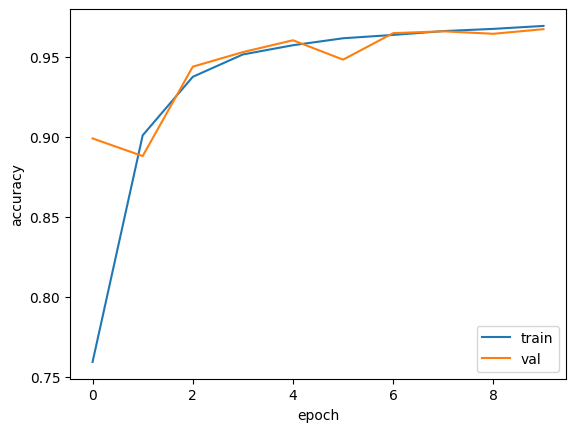

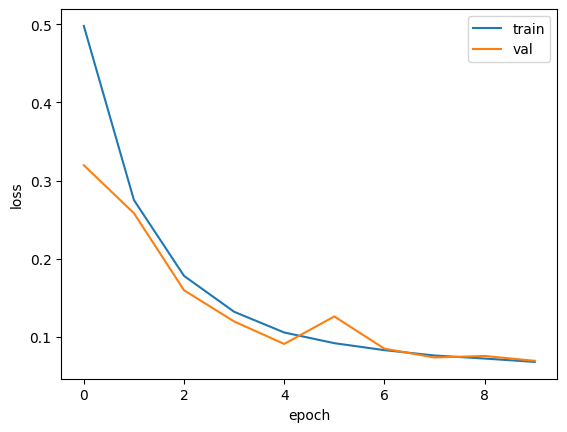


SGD
Epoch 1/10
227/227 [==============================] - 26s 75ms/step - loss: 0.6284 - accuracy: 0.6618 - val_loss: 0.5640 - val_accuracy: 0.7183
Epoch 2/10
227/227 [==============================] - 28s 86ms/step - loss: 0.5348 - accuracy: 0.7449 - val_loss: 0.4832 - val_accuracy: 0.7852
Epoch 3/10
227/227 [==============================] - 36s 99ms/step - loss: 0.4535 - accuracy: 0.8009 - val_loss: 0.3833 - val_accuracy: 0.8488
Epoch 4/10
227/227 [==============================] - 30s 87ms/step - loss: 0.3779 - accuracy: 0.8466 - val_loss: 0.3456 - val_accuracy: 0.8533
Epoch 5/10
227/227 [==============================] - 29s 87ms/step - loss: 0.3140 - accuracy: 0.8767 - val_loss: 0.3762 - val_accuracy: 0.8195
Epoch 6/10
227/227 [==============================] - 28s 85ms/step - loss: 0.2609 - accuracy: 0.9029 - val_loss: 0.2243 - val_accuracy: 0.9193
Epoch 7/10
227/227 [==============================] - 26s 84ms/step - loss: 0.2207 - accuracy: 0.9197 - val_loss: 0.2064 - val_accu

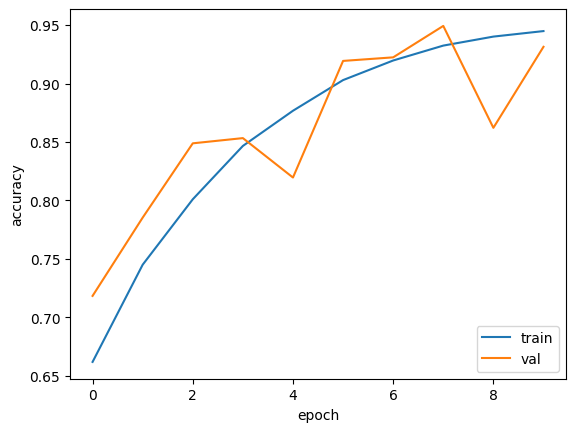

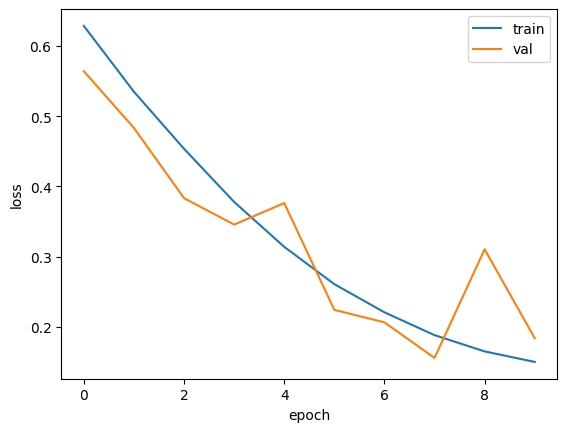


SGD
Epoch 1/10
227/227 [==============================] - 29s 75ms/step - loss: 0.6772 - accuracy: 0.5926 - val_loss: 0.6574 - val_accuracy: 0.6559
Epoch 2/10
227/227 [==============================] - 23s 73ms/step - loss: 0.6531 - accuracy: 0.6507 - val_loss: 0.6375 - val_accuracy: 0.6765
Epoch 3/10
227/227 [==============================] - 37s 120ms/step - loss: 0.6346 - accuracy: 0.6638 - val_loss: 0.6186 - val_accuracy: 0.6846
Epoch 4/10
227/227 [==============================] - 34s 97ms/step - loss: 0.6192 - accuracy: 0.6767 - val_loss: 0.6044 - val_accuracy: 0.6946
Epoch 5/10
227/227 [==============================] - 40s 117ms/step - loss: 0.6060 - accuracy: 0.6853 - val_loss: 0.5911 - val_accuracy: 0.7004
Epoch 6/10
227/227 [==============================] - 42s 124ms/step - loss: 0.5941 - accuracy: 0.6946 - val_loss: 0.5791 - val_accuracy: 0.7087
Epoch 7/10
227/227 [==============================] - 43s 124ms/step - loss: 0.5822 - accuracy: 0.7040 - val_loss: 0.5689 - val_

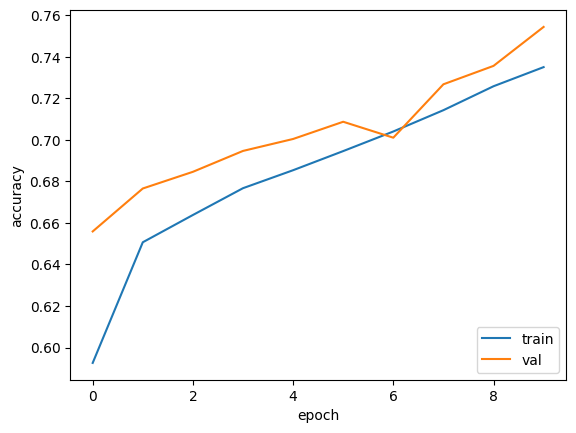

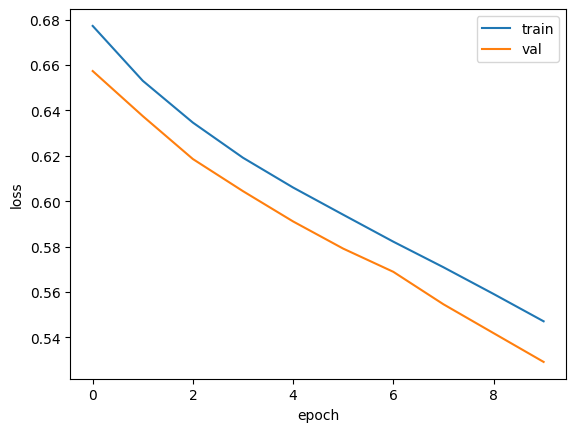


SGD
Epoch 1/10
227/227 [==============================] - 48s 131ms/step - loss: 0.4782 - accuracy: 0.7702 - val_loss: 0.2324 - val_accuracy: 0.9075
Epoch 2/10
227/227 [==============================] - 41s 120ms/step - loss: 0.1536 - accuracy: 0.9429 - val_loss: 0.1168 - val_accuracy: 0.9496
Epoch 3/10
227/227 [==============================] - 41s 120ms/step - loss: 0.0959 - accuracy: 0.9609 - val_loss: 0.0836 - val_accuracy: 0.9651
Epoch 4/10
227/227 [==============================] - 36s 105ms/step - loss: 0.0793 - accuracy: 0.9655 - val_loss: 0.0805 - val_accuracy: 0.9666
Epoch 5/10
227/227 [==============================] - 37s 111ms/step - loss: 0.0713 - accuracy: 0.9687 - val_loss: 0.0838 - val_accuracy: 0.9583
Epoch 6/10
227/227 [==============================] - 40s 113ms/step - loss: 0.0661 - accuracy: 0.9702 - val_loss: 0.0958 - val_accuracy: 0.9617
Epoch 7/10
227/227 [==============================] - 39s 115ms/step - loss: 0.0626 - accuracy: 0.9706 - val_loss: 0.0757 - v

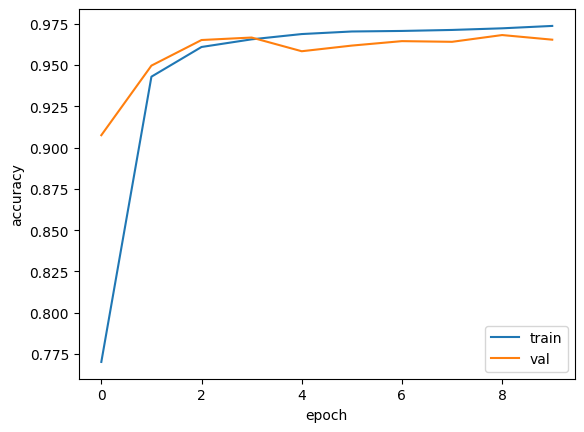

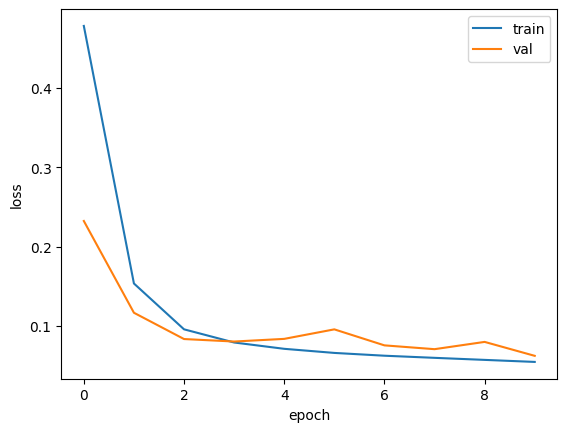

In [ ]:
#Optimizer selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()




  print("Adam")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("Adam")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()






  print("RMSprop")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("RMSprop")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("RMSprop")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.experimental.RMSprop(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()





  print("SGD")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("SGD")
  model = get_model('simpleCNN', 'relu', 0.2)
  model.compile(optimizer=  tf.keras.optimizers.experimental.SGD(learning_rate=0.1), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
Epoch 1/10
227/227 [==============================] - 44s 91ms/step - loss: 0.2599 - accuracy: 0.9148 - val_loss: 0.1033 - val_accuracy: 0.9612
Epoch 2/10
227/227 [==============================] - 28s 85ms/step - loss: 0.1030 - accuracy: 0.9606 - val_loss: 0.0800 - val_accuracy: 0.9666
Epoch 3/10
227/227 [==============================] - 28s 87ms/step - loss: 0.0780 - accuracy: 0.9695 - val_loss: 0.0708 - val_accuracy: 0.9713
Epoch 4/10
227/227 [==============================] - 29s 89ms/step - loss: 0.0656 - accuracy: 0.9735 - val_loss: 0.0620 - val_accuracy: 0.9758
Epoch 5/10
227/227 [==============================] - 24s 75ms/step - loss: 0.0558 - accuracy: 0.9767 - val_loss: 0.0573 - val_accuracy: 0.9780
Epoch 6/10
227/227 [==============================] - 23s 75ms/step - loss: 0.0480 - accuracy: 0.9796 - val_loss: 0.0511 - val_accuracy: 0.9796
Epoch 7/10
227/227 [==============================] - 24s 75ms/step - loss: 0.0403 - accuracy: 0.9834 - val_loss: 0.0398 - val_acc

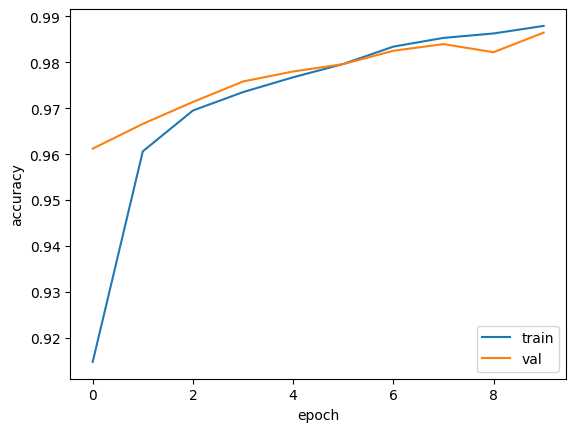

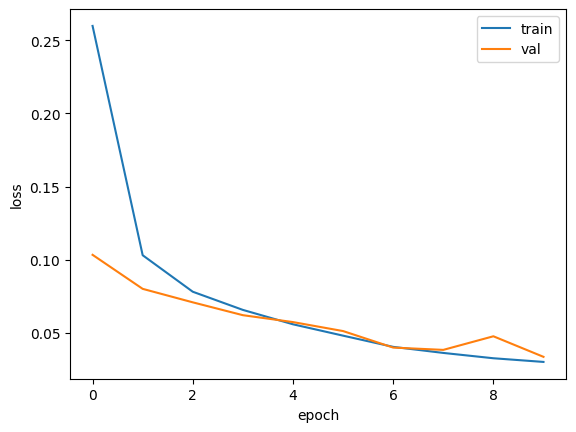


AdamW
Epoch 1/10
227/227 [==============================] - 25s 75ms/step - loss: 1.4177 - accuracy: 0.5081 - val_loss: 0.6946 - val_accuracy: 0.4782
Epoch 2/10
227/227 [==============================] - 23s 74ms/step - loss: 0.6940 - accuracy: 0.5018 - val_loss: 0.6927 - val_accuracy: 0.5218
Epoch 3/10
227/227 [==============================] - 23s 72ms/step - loss: 0.6938 - accuracy: 0.5047 - val_loss: 0.6931 - val_accuracy: 0.5218
Epoch 4/10
227/227 [==============================] - 24s 75ms/step - loss: 0.6936 - accuracy: 0.5080 - val_loss: 0.6922 - val_accuracy: 0.5218
Epoch 5/10
227/227 [==============================] - 23s 75ms/step - loss: 0.6941 - accuracy: 0.5003 - val_loss: 0.6922 - val_accuracy: 0.5218
Epoch 6/10
227/227 [==============================] - 23s 75ms/step - loss: 0.6943 - accuracy: 0.5070 - val_loss: 0.6971 - val_accuracy: 0.4782
Epoch 7/10
227/227 [==============================] - 23s 72ms/step - loss: 0.6947 - accuracy: 0.5071 - val_loss: 0.6948 - val_ac

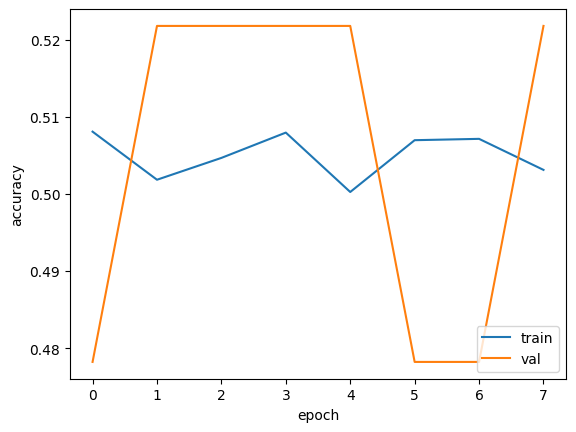

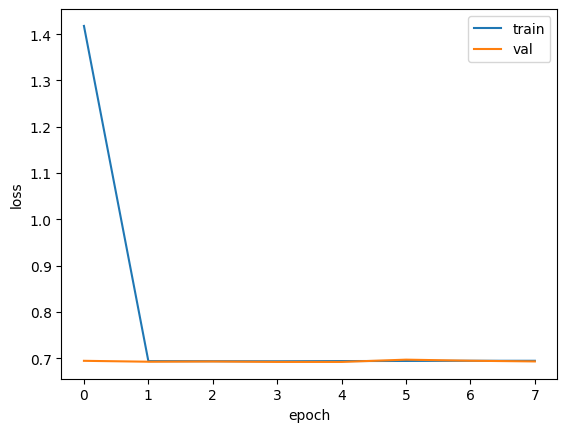


AdamW
Epoch 1/10
227/227 [==============================] - 31s 98ms/step - loss: 0.2532 - accuracy: 0.8928 - val_loss: 0.1184 - val_accuracy: 0.9540
Epoch 2/10
227/227 [==============================] - 28s 97ms/step - loss: 0.0968 - accuracy: 0.9621 - val_loss: 0.0765 - val_accuracy: 0.9677
Epoch 3/10
227/227 [==============================] - 29s 99ms/step - loss: 0.0730 - accuracy: 0.9687 - val_loss: 0.0636 - val_accuracy: 0.9696
Epoch 4/10
227/227 [==============================] - 28s 97ms/step - loss: 0.0610 - accuracy: 0.9728 - val_loss: 0.0623 - val_accuracy: 0.9736
Epoch 5/10
227/227 [==============================] - 28s 95ms/step - loss: 0.0538 - accuracy: 0.9758 - val_loss: 0.0525 - val_accuracy: 0.9737
Epoch 6/10
227/227 [==============================] - 29s 97ms/step - loss: 0.0462 - accuracy: 0.9785 - val_loss: 0.0457 - val_accuracy: 0.9766
Epoch 7/10
227/227 [==============================] - 28s 97ms/step - loss: 0.0425 - accuracy: 0.9796 - val_loss: 0.0415 - val_ac

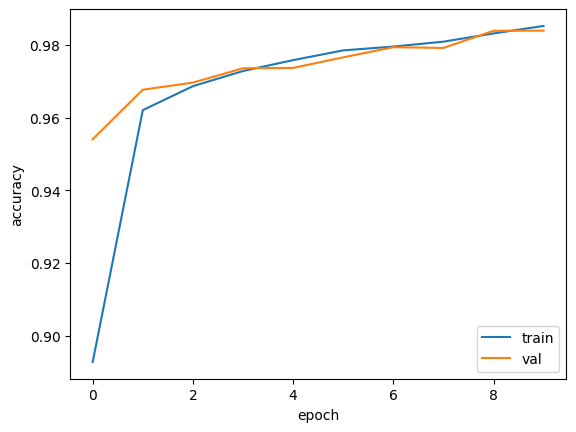

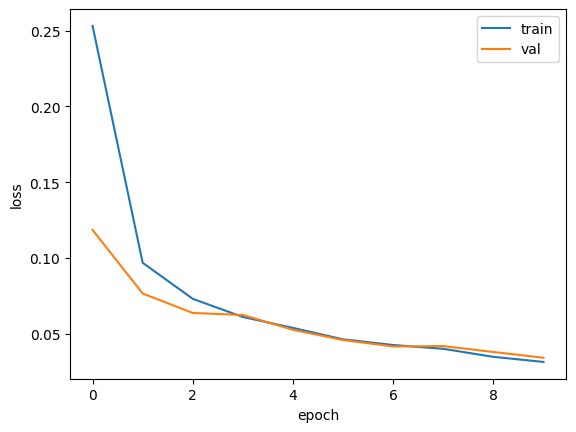

In [ ]:
#Activation function selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('simpleCNN', 'tanh', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('simpleCNN', 'sigmoid', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

  print("AdamW")
  # Compile the model
  model = get_model('simpleCNN', 'gelu', 0.2)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()


AdamW
Epoch 1/10
227/227 [==============================] - 29s 86ms/step - loss: 0.2645 - accuracy: 0.8952 - val_loss: 0.1307 - val_accuracy: 0.9592
Epoch 2/10
227/227 [==============================] - 29s 86ms/step - loss: 0.0854 - accuracy: 0.9640 - val_loss: 0.0685 - val_accuracy: 0.9707
Epoch 3/10
227/227 [==============================] - 33s 100ms/step - loss: 0.0694 - accuracy: 0.9705 - val_loss: 0.0635 - val_accuracy: 0.9658
Epoch 4/10
227/227 [==============================] - 39s 119ms/step - loss: 0.0563 - accuracy: 0.9754 - val_loss: 0.0483 - val_accuracy: 0.9767
Epoch 5/10
227/227 [==============================] - 39s 113ms/step - loss: 0.0453 - accuracy: 0.9798 - val_loss: 0.0443 - val_accuracy: 0.9801
Epoch 6/10
227/227 [==============================] - 37s 109ms/step - loss: 0.0398 - accuracy: 0.9825 - val_loss: 0.0445 - val_accuracy: 0.9809
Epoch 7/10
227/227 [==============================] - 38s 111ms/step - loss: 0.0350 - accuracy: 0.9843 - val_loss: 0.0413 - va

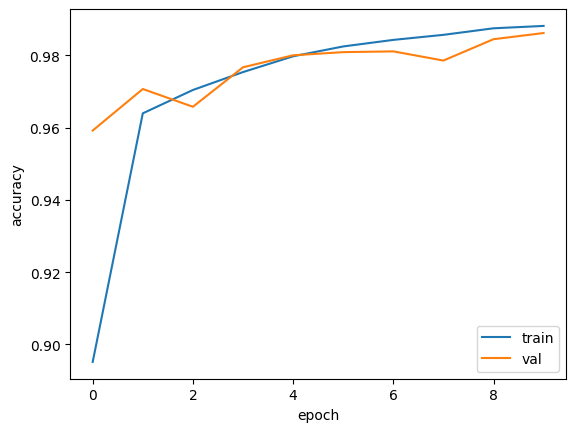

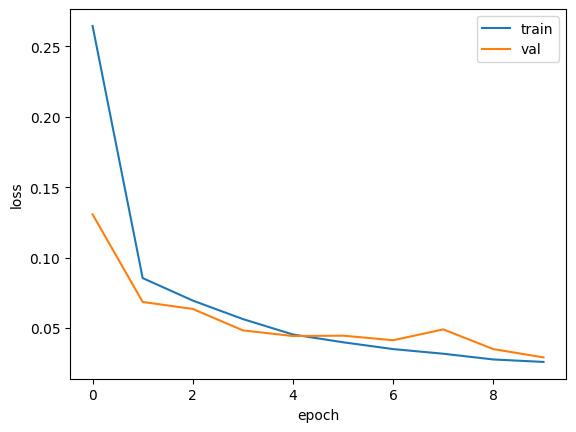


AdamW
Epoch 1/10
227/227 [==============================] - 34s 85ms/step - loss: 0.2392 - accuracy: 0.8972 - val_loss: 0.0883 - val_accuracy: 0.9590
Epoch 2/10
227/227 [==============================] - 29s 89ms/step - loss: 0.0792 - accuracy: 0.9650 - val_loss: 0.0634 - val_accuracy: 0.9693
Epoch 3/10
227/227 [==============================] - 27s 81ms/step - loss: 0.0616 - accuracy: 0.9719 - val_loss: 0.0601 - val_accuracy: 0.9743
Epoch 4/10
227/227 [==============================] - 25s 81ms/step - loss: 0.0539 - accuracy: 0.9755 - val_loss: 0.0585 - val_accuracy: 0.9711
Epoch 5/10
227/227 [==============================] - 24s 78ms/step - loss: 0.0476 - accuracy: 0.9777 - val_loss: 0.0430 - val_accuracy: 0.9801
Epoch 6/10
227/227 [==============================] - 26s 85ms/step - loss: 0.0415 - accuracy: 0.9805 - val_loss: 0.0438 - val_accuracy: 0.9800
Epoch 7/10
227/227 [==============================] - 28s 83ms/step - loss: 0.0371 - accuracy: 0.9828 - val_loss: 0.0366 - val_ac

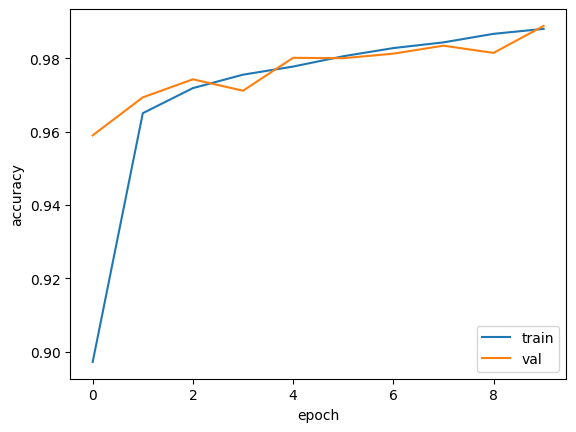

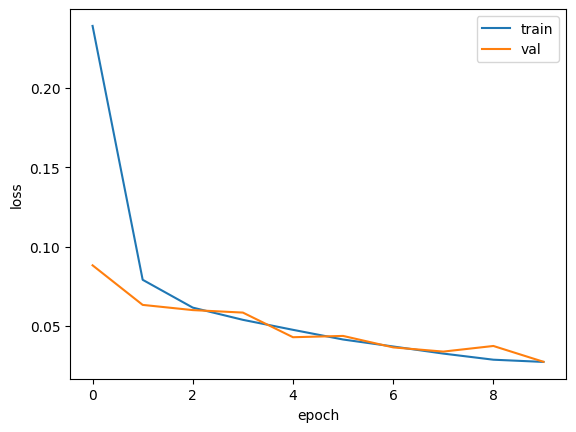

In [ ]:

#Dropout rate selection
with tf.device('/gpu:0'):
  
  # Define callbacks
  callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3),
  ]
  print("AdamW")
  # Compile the model
  model = get_model('simpleCNN', 'relu', 0.1)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()
  
  print("AdamW")
  # Compile the model
  model = get_model('simpleCNN', 'relu', 0.3)
  model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  # Train the model
  history = model.fit(train_dataset, epochs=10, validation_data=val_dataset, callbacks=callbacks)
  # accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='lower right')
  plt.show()
  print()
  # loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()
  print()

Epoch 1/10
227/227 [==============================] - 50s 139ms/step - loss: 0.2553 - accuracy: 0.8956 - val_loss: 0.1116 - val_accuracy: 0.9591
Epoch 2/10
227/227 [==============================] - 39s 92ms/step - loss: 0.0857 - accuracy: 0.9640 - val_loss: 0.0863 - val_accuracy: 0.9656
Epoch 3/10
227/227 [==============================] - 31s 93ms/step - loss: 0.0651 - accuracy: 0.9713 - val_loss: 0.0587 - val_accuracy: 0.9712
Epoch 4/10
227/227 [==============================] - 34s 106ms/step - loss: 0.0533 - accuracy: 0.9757 - val_loss: 0.0555 - val_accuracy: 0.9750
Epoch 5/10
227/227 [==============================] - 35s 107ms/step - loss: 0.0392 - accuracy: 0.9820 - val_loss: 0.0390 - val_accuracy: 0.9838
Epoch 7/10
227/227 [==============================] - 35s 106ms/step - loss: 0.0342 - accuracy: 0.9845 - val_loss: 0.0371 - val_accuracy: 0.9832
Epoch 8/10
227/227 [==============================] - 36s 106ms/step - loss: 0.0297 - accuracy: 0.9861 - val_loss: 0.0291 - val_accu

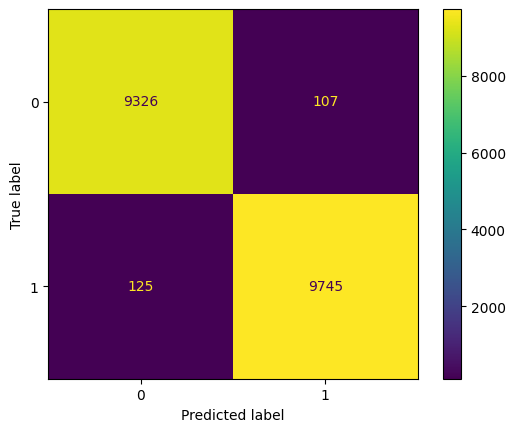


Precision:  0.9891392610637434
Recall:  0.9873353596757852
F1:  0.9882364871716864
Avg acc: 0.9880
0.9879811428275398 0.9879811428275398 0.9879811428275398 0.9879811428275398 0.9879811428275398 0.9879811428275398 0.9879811428275398
Standard error: 0.0000
126/126 [==============================] - 4s 32ms/step
[[9.6973579e-04 9.9903017e-01]
 [5.4831626e-03 9.9451679e-01]
 [7.5947188e-02 9.2405277e-01]
 ...
 [9.9982542e-01 1.7464507e-04]
 [9.9989659e-01 1.0338467e-04]
 [9.9993175e-01 6.8282192e-05]]
32134


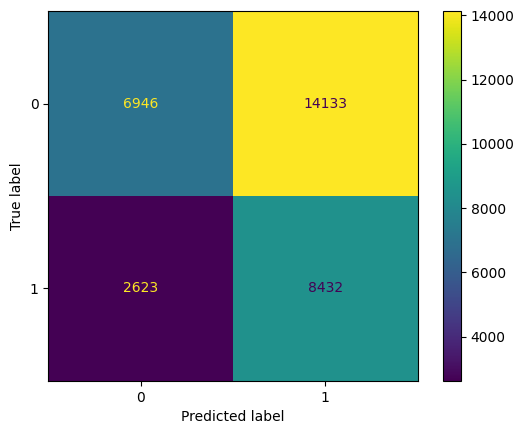


Precision:  0.3736760469754044
Recall:  0.7627317955676165
F1:  0.5016061867935754
Avg acc: 0.4786
0.4785585361299558 0.4785585361299558 0.4785585361299558 0.4785585361299558 0.4785585361299558 0.4785585361299558 0.4785585361299558
Standard error: 0.0000


In [ ]:
model = get_model('simpleCNN', 'relu', 0.1)
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # Make predictions on the test set
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp))

  tf.random.set_seed(42)
  np.random.seed(71516)
  y2 = np.array(model.predict(test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

y_pred = None
y1, y2, y3, y4, y5, y6, y7 = None, None, None, None, None, None, None
test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7 = None, None, None, None, None, None, None

with tf.device('/gpu:0'):
  # test_loss, test_acc = model.evaluate(unseen_test_dataset)
  # print('Unseen Test accuracy:', test_acc)
  # print('Unseen Test loss:', test_loss)
  tf.random.set_seed(71516)
  np.random.seed(71516)
  y1 = np.array(model.predict(unseen_test_dataset))
  test_acc1 = np.mean(np.array(binarize_preds(y1)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(42)
  np.random.seed(42)
  y2 = np.array(model.predict(unseen_test_dataset))
  test_acc2 = np.mean(np.array(binarize_preds(y2)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(0)
  np.random.seed(0)
  y3 = np.array(model.predict(unseen_test_dataset))
  test_acc3 = np.mean(np.array(binarize_preds(y3)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(420)
  np.random.seed(420)
  y4 = np.array(model.predict(unseen_test_dataset))
  test_acc4 = np.mean(np.array(binarize_preds(y4)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(111)
  np.random.seed(111)
  y5 = np.array(model.predict(unseen_test_dataset))
  test_acc5 = np.mean(np.array(binarize_preds(y5)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(222)
  np.random.seed(222)
  y6 = np.array(model.predict(unseen_test_dataset))
  test_acc6 = np.mean(np.array(binarize_preds(y6)) == np.array(y_true_temp_unseen))

  tf.random.set_seed(333)
  np.random.seed(333)
  y7 = np.array(model.predict(unseen_test_dataset))
  test_acc7 = np.mean(np.array(binarize_preds(y7)) == np.array(y_true_temp_unseen))

y_pred = np.divide((y1+ y2+ y3+ y4+ y5+ y6+ y7), 7)
print(y_pred)
y_pred_binary = (y_pred > 0.5).astype(int)
y_pred_binary = np.argmax(y_pred_binary, axis=1)
print(len(y_pred_binary))

avg_acc = (test_acc1+test_acc2+test_acc3+test_acc4+test_acc5+test_acc6+test_acc7)/7
acc_list = [test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7]
se = np.std(acc_list, ddof=1)/np.sqrt(np.size(acc_list))

y_true_true = y_true_temp_unseen
#convert this into numpy
ConfusionMatrixDisplay.from_predictions(np.array(y_true_true), np.array(y_pred_binary))
plt.show()
print()
print("Precision: ", precision_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Recall: ", recall_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("F1: ", f1_score(np.array(y_true_true), np.array(y_pred_binary), average='binary'))
print("Avg acc: {:.4f}".format(avg_acc))
print(test_acc1, test_acc2, test_acc3, test_acc4, test_acc5, test_acc6, test_acc7)
print("Standard error: {:.4f}".format(se))

Data augmentation (random rotation and rescaling) using simpleCNN

It does not improve accuracy or generalization

In [ ]:
act='tanh'
model = Sequential()
model.add(tf.keras.layers.InputLayer(input_shape=(64, 64, 3)))
model.add(tf.keras.layers.Rescaling(scale=2., offset=-1.))
model.add(tf.keras.layers.RandomRotation(factor=0.2))
model.add(Conv2D(128, (3, 3), activation=act))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation=act))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))
# Dense layers
model.add(Flatten())
model.add(Dense(512, activation=act))
model.add(Dense(2, activation='softmax'))

model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# model.build()
model.summary()

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

with tf.device('/gpu:0'):
  # Make predictions on the test set
  tf.random.set_seed(71516)
  np.random.seed(71516)
  tl1, ta1 = model.evaluate(test_dataset)
  tl2, ta2 = model.evaluate(unseen_test_dataset)
  print("Dataset 1 test acc: ", ta1)
  print("Dataset 1 test loss: ", tl1)
  print()
  print("Dataset 2 test acc: ", ta2)
  print("Dataset 2 test loss: ", tl2)



act='relu'
model = Sequential()
model.add(tf.keras.layers.InputLayer(input_shape=(64, 64, 3)))
# model.add(tf.keras.layers.Rescaling(scale=2., offset=-1.))
model.add(tf.keras.layers.RandomRotation(factor=0.5))
model.add(Conv2D(128, (3, 3), activation=act))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation=act))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))
# Dense layers
model.add(Flatten())
model.add(Dense(512, activation=act))
model.add(Dense(2, activation='softmax'))

model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# model.build()
model.summary()

model.fit(train_dataset, epochs=10, validation_data=val_dataset)

with tf.device('/gpu:0'):
  # Make predictions on the test set
  tf.random.set_seed(71516)
  np.random.seed(71516)
  tl1, ta1 = model.evaluate(test_dataset)
  tl2, ta2 = model.evaluate(unseen_test_dataset)
  print("Dataset 1 test acc: ", ta1)
  print("Dataset 1 test loss: ", tl1)
  print()
  print("Dataset 2 test acc: ", ta2)
  print("Dataset 2 test loss: ", tl2)


Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_9 (Rescaling)     (None, 64, 64, 3)         0         
                                                                 
 random_rotation_9 (RandomRo  (None, 64, 64, 3)        0         
 tation)                                                         
                                                                 
 conv2d_24 (Conv2D)          (None, 62, 62, 128)       3584      
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 31, 31, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 29, 29, 64)        73792     
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 14, 14, 64)     

In [ ]:
#Random baseline -> 5 layers, just train the last softmax layer, others random distribution.

#Another model where we unfreeze few layers from resnet-50.

